In [1]:
%load_ext cmdstanjupyter

In [2]:
import numpy as np
import pandas as pd
from scipy import stats
from scipy import linalg
from scipy import special
import matplotlib.pyplot as plt
import arviz as ar

# True values for B and Weights (2-mixture)

In [3]:
true_mat = np.array([[1, 0.3, 0.7, 1], [0, -0.8, -0.1, -0.7]])
true_prop = 0.3

In [4]:
X = np.random.normal(loc = 0, scale = 1, size = (500, 3))
X = np.array([np.concatenate(([1], a)) for a in X])

In [5]:
theta_0 = special.expit(np.matmul(X, true_mat[0]))
theta_1 = special.expit(np.matmul(X, true_mat[1]))

In [6]:
def generate_Y(prop, theta_0, theta_1, nu_0 = 50):
    n = len(theta_0)
    U = np.random.uniform(size = n)
    theta_mean = np.array([theta_0[j] if U[j] < prop else theta_1[j] for j in range(n)])
    return np.array([np.random.beta(theta_mean[j]*nu_0, (1 - theta_mean[j])*nu_0) for j in range(n)])

(array([0.38717499, 0.67246183, 1.30416839, 1.34492365, 1.05963682,
        1.10039208, 0.97812629, 1.16152497, 1.30416839, 0.87623814]),
 array([0.01579525, 0.11394209, 0.21208892, 0.31023576, 0.40838259,
        0.50652943, 0.60467627, 0.7028231 , 0.80096994, 0.89911677,
        0.99726361]),
 <BarContainer object of 10 artists>)

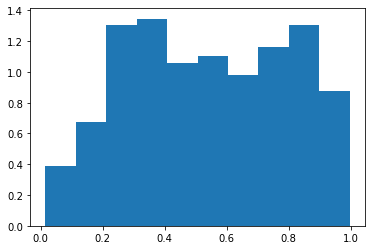

In [7]:
Y = generate_Y(prop = true_prop, theta_0 = theta_0, theta_1 = theta_1, nu_0 = 50)
plt.hist(Y, density = True)

# Modeling

In [29]:
# param_mat is a matrix of parameters, each row is an array of format: [a, b], the shape parameters of beta
def pdf_mix_beta(param_mat, weights, grid_size):
    grid = np.linspace(0, 1, grid_size)
    N = len(weights)
    def mix(x):
        return sum([weights[h]*stats.beta.pdf(x, a = param_mat[h][0], b = param_mat[h][1]) for h in range(N)])
    return mix(grid)

In [8]:
def ind_merge(ind_vec, list0, list1):
    if len(list0) + len(list1) != len(ind_vec):
        raise ValueError(" Must have: len(arr1) + len(arr2) = len(ind_vec) !! ")
    a0 = list0.copy()
    a1 = list1.copy()
    n = len(ind_vec)
    out = [None]*n
    for j in range(n):
        if ind_vec[j] == 0:
          out[j] = a0[0]
          a0.pop(0)
        else:
          out[j] = a1[0]
          a1.pop(0)
    return out

In [9]:
def m_count(H, N):
    out = []
    for h in range(N):
        out = out + [len(H) - np.count_nonzero(H - h)]
    return np.array(out)

In [10]:
def create_Theta(X, B, H):
    n = len(X)
    return np.array([special.expit(np.dot(X[i], B[H[i]])) for i in range(n)])

In [36]:
# output is a N_0 size list, each entry itself is a 3-list: X, Y, nu
def create_X_HYnu(Y, X, nu, H):
    active_list = list(frozenset(H))
    N_0 = len(active_list)
    X_HYnu = [None]*N_0
    df1 = pd.DataFrame.copy(pd.DataFrame(X), deep = True) # pass by value (not reference) so that original df_bar stays intact
    df1['Y'], df1['nu'], df1['H'] = [Y, nu, H]
    df2 = df1.groupby('H')
    for k in range(N_0):
        out_temp = df2.get_group(active_list[k]).drop('H', axis = 1, inplace = False)
        out3 = np.array(out_temp['nu'])
        out2 = np.array(out_temp['Y'])
        out1 = np.array(out_temp.drop(['Y', 'nu'], axis = 1, inplace = False))
        X_HYnu[k] = [out1, out2, out3]
    return X_HYnu

## $\nu_i$ updates

In [12]:
%%stan nu_model
data {
    int n;
    vector<lower=0, upper=1>[n] Y;
    vector<lower=0, upper=1>[n] Theta;
}

parameters {
    vector<lower=0>[n] nu;
}

model {
    nu ~ exponential(0.1);
    for(i in 1:n) {
        Y[i] ~ beta(nu[i]*Theta[i], nu[i]*(1 - Theta[i]));
    }
}

INFO:cmdstanjupyter:Reusing cached model file .stan/nu_model.stan
INFO:cmdstanjupyter:Creating CmdStanPy model & assigning it to variable "nu_model"
INFO:cmdstanjupyter:StanModel now available as variable "nu_model"!
 Compilation took a moment.


In [13]:
def update_nu(Y, X, B, H):
    n = len(Y)
    Theta = create_Theta(X, B, H)
    data_nu = {'n':n, 'Y':Y, 'Theta':Theta}
    fit_nu = nu_model.sample(data = data_nu)
    return np.array(fit_nu.summary()['Mean'].iloc[1:])

## $\alpha_i$ updates

In [14]:
%%stan alpha_model
data{
    int N;
    vector[N] W;
}

parameters{
    real<lower=0> alpha;
}

model{
    alpha ~ exponential(1);
    W ~ dirichlet(rep_vector(alpha/N, N));
}

INFO:cmdstanjupyter:Reusing cached model file .stan/alpha_model.stan
INFO:cmdstanjupyter:Creating CmdStanPy model & assigning it to variable "alpha_model"
INFO:cmdstanjupyter:StanModel now available as variable "alpha_model"!
 Compilation took a moment.


In [15]:
def update_alpha(W, N):
    # data to be fed to STAN
    data_alpha = {'N':N, 'W':W}

    # building STAN model and drawing samples
    fit_alpha = alpha_model.sample(data = data_alpha)

    # returning output
    return fit_alpha.summary()['Mean'].iloc[1]

## $W_h$ updates

In [16]:
def update_W(alpha, H, N):
    m_vec = m_count(H, N)
    return np.ravel(np.random.dirichlet(np.array([alpha/N + m for m in m_vec]), size = 1))

## $B_h$ updates

In [17]:
%%stan B_model
functions {
    real theta_mean(row_vector X, vector b){
      return inv_logit(X*b);
    }
}

data {
    int<lower = 0> n;
    int<lower=0> p;
    vector<lower=0>[n] nu;
    vector<lower=0, upper=1>[n] Y;
    matrix[n, p] X_mat;
}

parameters {
    vector[p] b;
}

model {
    b ~ normal(0, 1);
    for(i in 1:n) {
      Y[i] ~ beta(theta_mean(X_mat[i,], b)*nu[i], (1 - theta_mean(X_mat[i,], b))*nu[i]);
    }
}

INFO:cmdstanjupyter:Reusing cached model file .stan/B_model.stan
INFO:cmdstanjupyter:Creating CmdStanPy model & assigning it to variable "B_model"
INFO:cmdstanjupyter:StanModel now available as variable "B_model"!
 Compilation took a moment.


In [37]:
def update_B(Y, X, H, N, nu):
    p = len(X[0])
    # out1 stores just the active B vectors as rows
    active_list = list(frozenset(H))
    out1 = []
    X_HYnu = create_X_HYnu(Y, X, nu, H)

    # creating separate data feeds and draws df for each of the active B's
    for l in X_HYnu:
        data_B = {'n':len(l[0]), 'p':len(l[0][0]), 'Y':l[1], 'X_mat':l[0], 'nu':l[2]}
        fit_B = B_model.sample(data = data_B)
        out1 = out1 + [list(fit_B.summary()['Mean'].iloc[1:])]

    if len(active_list) == N:
        return np.array(out1) 
    else:
        out2 = list(np.random.normal(size = (N - len(active_list), p)))
        out = ind_merge([int(v in active_list) for v in range(N)], out2, out1)
    return out

## $H_i$ updates

In [19]:
def update_H(W, B, X, Y, nu):
    n = len(Y)
    N = len(W)
    H = -np.ones(n)
    for i in range(n):
        theta_means = np.array([special.expit(np.dot(X[i], b)) for b in B])
        p_vec = np.array([W[h]*stats.beta.pdf(Y[i], a = theta_means[h]*nu[i], 
                                              b = (1 - theta_means[h])*nu[i]) for h in range(N)])
        p_vec = p_vec/sum(p_vec)
        H[i] = np.array([list(v).index(1) for v in np.random.multinomial(n = 1, pvals = p_vec, size = 1)])
    return np.int_(H)

# Gibbs iteration

In [38]:
def update_all(n_iter, Y, X, N):
    n = len(Y)
    p = len(X[0])
  
    # initializing (randomly) array for the indexing variable H_i, i = 0, ... n - 1
    H = np.array([list(v).index(1) for v in np.random.multinomial(n = 1, pvals = np.ones(N)/N, size = n)])
    print(len(H))

    # initializing (randomly) array for B_h, h = 0, ... N - 1
    B = np.random.multivariate_normal(mean = np.zeros(p), cov = np.identity(p), size = N)

    # initializing array for Dirichlet component weight variable w_h, h = 0, ... N - 1
    W = np.ones(N)/N
    
    # initializing array for nu_i, i = 0, ... n - 1
    nu = np.random.exponential(10, size = n) # this leads to having mean = 10

    # initializing scale variable alpha
    alpha = 1

    # loop
    alpha_vec = []
    nu_mat = []
    W_mat = []
    B_mat = []
    H_mat = []
    for j in range(n_iter):
        nu = update_nu(Y, X, B, H)
        alpha = update_alpha(W, N)
        W = update_W(alpha, H, N)
        B = update_B(Y, X, H, N, nu)
        H = update_H(W, B, X, Y, nu)

        # storing all draws
        alpha_vec = alpha_vec + [alpha]
        nu_mat = nu_mat + [nu]
        B_mat = B_mat + [B]
        H_mat = H_mat + [H]
        W_mat = W_mat + [W]

    return {'alpha':alpha, 'nu':nu, 'W':W, 'B':B, 'H':H, 'alpha_vec':np.array(alpha_vec), 'nu_mat':np.array(nu_mat),
            'B_mat':np.array(B_mat), 'H_mat':np.array(H_mat), 'W_mat':np.array(W_mat)}

In [45]:
cov_full = update_all(n_iter = 500, Y = Y, X = X, N = 7)

20:01:01 - cmdstanpy - INFO - CmdStan start processing


500


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:11 - cmdstanpy - INFO - CmdStan done processing.
20:01:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/nu_model.stan', line 14, column 8 to column 58)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/nu_model.stan', line 14, column 8 to column 58)
Consider re-running with show_console=True if the above output is unclear!


20:01:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:19 - cmdstanpy - INFO - CmdStan done processing.


20:01:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:20 - cmdstanpy - INFO - CmdStan done processing.
20:01:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:01:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:21 - cmdstanpy - INFO - CmdStan done processing.
20:01:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:01:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:22 - cmdstanpy - INFO - CmdStan done processing.
20:01:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:01:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:24 - cmdstanpy - INFO - CmdStan done processing.
20:01:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:01:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:25 - cmdstanpy - INFO - CmdStan done processing.
20:01:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:01:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:26 - cmdstanpy - INFO - CmdStan done processing.
20:01:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:01:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:27 - cmdstanpy - INFO - CmdStan done processing.
20:01:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:01:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:41 - cmdstanpy - INFO - CmdStan done processing.


20:01:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:49 - cmdstanpy - INFO - CmdStan done processing.


20:01:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:51 - cmdstanpy - INFO - CmdStan done processing.
20:01:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:01:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:52 - cmdstanpy - INFO - CmdStan done processing.
20:01:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:01:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:53 - cmdstanpy - INFO - CmdStan done processing.
20:01:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:01:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:54 - cmdstanpy - INFO - CmdStan done processing.
20:01:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:01:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:56 - cmdstanpy - INFO - CmdStan done processing.
20:01:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:01:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:57 - cmdstanpy - INFO - CmdStan done processing.
20:01:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:01:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:01:58 - cmdstanpy - INFO - CmdStan done processing.
20:01:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:01:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:13 - cmdstanpy - INFO - CmdStan done processing.


20:02:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:21 - cmdstanpy - INFO - CmdStan done processing.


20:02:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:23 - cmdstanpy - INFO - CmdStan done processing.
20:02:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:02:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:24 - cmdstanpy - INFO - CmdStan done processing.
20:02:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:02:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:26 - cmdstanpy - INFO - CmdStan done processing.
20:02:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:02:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:27 - cmdstanpy - INFO - CmdStan done processing.
20:02:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:02:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:28 - cmdstanpy - INFO - CmdStan done processing.
20:02:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:02:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:30 - cmdstanpy - INFO - CmdStan done processing.
20:02:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:02:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:31 - cmdstanpy - INFO - CmdStan done processing.
20:02:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:02:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:45 - cmdstanpy - INFO - CmdStan done processing.
20:02:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/nu_model.stan', line 14, column 8 to column 58)
Consider re-running with show_console=True if the above output is unclear!


20:02:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:53 - cmdstanpy - INFO - CmdStan done processing.


20:02:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:56 - cmdstanpy - INFO - CmdStan done processing.
20:02:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:02:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:57 - cmdstanpy - INFO - CmdStan done processing.
20:02:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:02:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:02:58 - cmdstanpy - INFO - CmdStan done processing.
20:02:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:02:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:00 - cmdstanpy - INFO - CmdStan done processing.
20:03:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:03:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:01 - cmdstanpy - INFO - CmdStan done processing.
20:03:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:03:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:02 - cmdstanpy - INFO - CmdStan done processing.
20:03:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:03:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:03 - cmdstanpy - INFO - CmdStan done processing.
20:03:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:03:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:18 - cmdstanpy - INFO - CmdStan done processing.
20:03:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/nu_model.stan', line 14, column 8 to column 58)
Consider re-running with show_console=True if the above output is unclear!


20:03:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:26 - cmdstanpy - INFO - CmdStan done processing.


20:03:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:28 - cmdstanpy - INFO - CmdStan done processing.
20:03:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:03:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:29 - cmdstanpy - INFO - CmdStan done processing.
20:03:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:03:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:31 - cmdstanpy - INFO - CmdStan done processing.
20:03:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:03:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:32 - cmdstanpy - INFO - CmdStan done processing.
20:03:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:03:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:33 - cmdstanpy - INFO - CmdStan done processing.
20:03:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:03:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:35 - cmdstanpy - INFO - CmdStan done processing.
20:03:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:03:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:36 - cmdstanpy - INFO - CmdStan done processing.
20:03:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:03:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:51 - cmdstanpy - INFO - CmdStan done processing.


20:03:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:03:59 - cmdstanpy - INFO - CmdStan done processing.


20:03:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:01 - cmdstanpy - INFO - CmdStan done processing.
20:04:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:04:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:02 - cmdstanpy - INFO - CmdStan done processing.
20:04:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:04:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:04 - cmdstanpy - INFO - CmdStan done processing.
20:04:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:04:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:06 - cmdstanpy - INFO - CmdStan done processing.
20:04:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:04:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:07 - cmdstanpy - INFO - CmdStan done processing.
20:04:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:04:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:08 - cmdstanpy - INFO - CmdStan done processing.
20:04:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:04:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:09 - cmdstanpy - INFO - CmdStan done processing.
20:04:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:04:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:24 - cmdstanpy - INFO - CmdStan done processing.


20:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:32 - cmdstanpy - INFO - CmdStan done processing.


20:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:35 - cmdstanpy - INFO - CmdStan done processing.
20:04:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:36 - cmdstanpy - INFO - CmdStan done processing.
20:04:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:38 - cmdstanpy - INFO - CmdStan done processing.
20:04:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:39 - cmdstanpy - INFO - CmdStan done processing.
20:04:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:40 - cmdstanpy - INFO - CmdStan done processing.
20:04:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:42 - cmdstanpy - INFO - CmdStan done processing.
20:04:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:43 - cmdstanpy - INFO - CmdStan done processing.
20:04:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:04:58 - cmdstanpy - INFO - CmdStan done processing.


20:05:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:06 - cmdstanpy - INFO - CmdStan done processing.


20:05:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:08 - cmdstanpy - INFO - CmdStan done processing.
20:05:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:05:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:09 - cmdstanpy - INFO - CmdStan done processing.
20:05:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:05:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:11 - cmdstanpy - INFO - CmdStan done processing.
20:05:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:05:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:12 - cmdstanpy - INFO - CmdStan done processing.
20:05:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:05:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:14 - cmdstanpy - INFO - CmdStan done processing.
20:05:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:05:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:15 - cmdstanpy - INFO - CmdStan done processing.
20:05:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:05:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:16 - cmdstanpy - INFO - CmdStan done processing.
20:05:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:05:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:31 - cmdstanpy - INFO - CmdStan done processing.


20:05:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:39 - cmdstanpy - INFO - CmdStan done processing.


20:05:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:41 - cmdstanpy - INFO - CmdStan done processing.
20:05:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:05:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:42 - cmdstanpy - INFO - CmdStan done processing.
20:05:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:05:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:45 - cmdstanpy - INFO - CmdStan done processing.
20:05:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:05:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:46 - cmdstanpy - INFO - CmdStan done processing.
20:05:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:05:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:47 - cmdstanpy - INFO - CmdStan done processing.
20:05:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:05:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:49 - cmdstanpy - INFO - CmdStan done processing.
20:05:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:05:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:05:50 - cmdstanpy - INFO - CmdStan done processing.
20:05:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:05:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:05 - cmdstanpy - INFO - CmdStan done processing.


20:06:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:13 - cmdstanpy - INFO - CmdStan done processing.


20:06:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:15 - cmdstanpy - INFO - CmdStan done processing.
20:06:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:06:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:16 - cmdstanpy - INFO - CmdStan done processing.
20:06:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:06:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:18 - cmdstanpy - INFO - CmdStan done processing.
20:06:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:06:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:20 - cmdstanpy - INFO - CmdStan done processing.
20:06:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:06:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:21 - cmdstanpy - INFO - CmdStan done processing.
20:06:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:06:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:22 - cmdstanpy - INFO - CmdStan done processing.
20:06:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:06:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:23 - cmdstanpy - INFO - CmdStan done processing.
20:06:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:06:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:38 - cmdstanpy - INFO - CmdStan done processing.


20:06:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:46 - cmdstanpy - INFO - CmdStan done processing.
20:06:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:06:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:48 - cmdstanpy - INFO - CmdStan done processing.
20:06:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:06:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:49 - cmdstanpy - INFO - CmdStan done processing.
20:06:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:06:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:52 - cmdstanpy - INFO - CmdStan done processing.
20:06:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:06:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:53 - cmdstanpy - INFO - CmdStan done processing.
20:06:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:06:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:54 - cmdstanpy - INFO - CmdStan done processing.
20:06:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:06:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:56 - cmdstanpy - INFO - CmdStan done processing.
20:06:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:06:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:06:57 - cmdstanpy - INFO - CmdStan done processing.
20:06:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:06:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:12 - cmdstanpy - INFO - CmdStan done processing.


20:07:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:20 - cmdstanpy - INFO - CmdStan done processing.


20:07:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:22 - cmdstanpy - INFO - CmdStan done processing.
20:07:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:07:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:23 - cmdstanpy - INFO - CmdStan done processing.
20:07:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:07:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:25 - cmdstanpy - INFO - CmdStan done processing.
20:07:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:07:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:26 - cmdstanpy - INFO - CmdStan done processing.
20:07:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:07:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:28 - cmdstanpy - INFO - CmdStan done processing.
20:07:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:07:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:29 - cmdstanpy - INFO - CmdStan done processing.
20:07:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:07:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:30 - cmdstanpy - INFO - CmdStan done processing.
20:07:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:07:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:49 - cmdstanpy - INFO - CmdStan done processing.


20:07:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:07:58 - cmdstanpy - INFO - CmdStan done processing.


20:07:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:00 - cmdstanpy - INFO - CmdStan done processing.
20:08:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:08:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:01 - cmdstanpy - INFO - CmdStan done processing.
20:08:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:08:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:03 - cmdstanpy - INFO - CmdStan done processing.
20:08:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:08:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:05 - cmdstanpy - INFO - CmdStan done processing.
20:08:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:08:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:06 - cmdstanpy - INFO - CmdStan done processing.
20:08:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:08:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:07 - cmdstanpy - INFO - CmdStan done processing.
20:08:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:08:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:08 - cmdstanpy - INFO - CmdStan done processing.
20:08:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:08:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:24 - cmdstanpy - INFO - CmdStan done processing.


20:08:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:32 - cmdstanpy - INFO - CmdStan done processing.


20:08:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:34 - cmdstanpy - INFO - CmdStan done processing.
20:08:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:08:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:35 - cmdstanpy - INFO - CmdStan done processing.
20:08:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:08:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:37 - cmdstanpy - INFO - CmdStan done processing.
20:08:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:08:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:38 - cmdstanpy - INFO - CmdStan done processing.
20:08:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:08:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:40 - cmdstanpy - INFO - CmdStan done processing.
20:08:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:08:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:41 - cmdstanpy - INFO - CmdStan done processing.
20:08:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:08:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:42 - cmdstanpy - INFO - CmdStan done processing.
20:08:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:08:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:08:57 - cmdstanpy - INFO - CmdStan done processing.


20:09:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:05 - cmdstanpy - INFO - CmdStan done processing.


20:09:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:07 - cmdstanpy - INFO - CmdStan done processing.
20:09:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:09:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:09 - cmdstanpy - INFO - CmdStan done processing.
20:09:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:09:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:11 - cmdstanpy - INFO - CmdStan done processing.
20:09:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:09:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:12 - cmdstanpy - INFO - CmdStan done processing.
20:09:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:09:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:14 - cmdstanpy - INFO - CmdStan done processing.
20:09:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:09:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:15 - cmdstanpy - INFO - CmdStan done processing.
20:09:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:09:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:16 - cmdstanpy - INFO - CmdStan done processing.
20:09:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:09:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:31 - cmdstanpy - INFO - CmdStan done processing.


20:09:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:39 - cmdstanpy - INFO - CmdStan done processing.


20:09:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:41 - cmdstanpy - INFO - CmdStan done processing.
20:09:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:09:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:42 - cmdstanpy - INFO - CmdStan done processing.
20:09:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:09:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:44 - cmdstanpy - INFO - CmdStan done processing.
20:09:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:09:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:46 - cmdstanpy - INFO - CmdStan done processing.
20:09:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:09:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:47 - cmdstanpy - INFO - CmdStan done processing.
20:09:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:09:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:49 - cmdstanpy - INFO - CmdStan done processing.
20:09:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:09:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:09:49 - cmdstanpy - INFO - CmdStan done processing.
20:09:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:09:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:04 - cmdstanpy - INFO - CmdStan done processing.


20:10:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:13 - cmdstanpy - INFO - CmdStan done processing.


20:10:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:14 - cmdstanpy - INFO - CmdStan done processing.
20:10:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:10:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:15 - cmdstanpy - INFO - CmdStan done processing.
20:10:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:10:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:18 - cmdstanpy - INFO - CmdStan done processing.
20:10:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:10:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:19 - cmdstanpy - INFO - CmdStan done processing.
20:10:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:10:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:21 - cmdstanpy - INFO - CmdStan done processing.
20:10:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:10:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:22 - cmdstanpy - INFO - CmdStan done processing.
20:10:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:10:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:23 - cmdstanpy - INFO - CmdStan done processing.
20:10:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:10:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:38 - cmdstanpy - INFO - CmdStan done processing.


20:10:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:46 - cmdstanpy - INFO - CmdStan done processing.


20:10:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:48 - cmdstanpy - INFO - CmdStan done processing.
20:10:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:10:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:49 - cmdstanpy - INFO - CmdStan done processing.
20:10:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:10:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:51 - cmdstanpy - INFO - CmdStan done processing.
20:10:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:10:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:52 - cmdstanpy - INFO - CmdStan done processing.
20:10:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:10:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:54 - cmdstanpy - INFO - CmdStan done processing.
20:10:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:10:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:55 - cmdstanpy - INFO - CmdStan done processing.
20:10:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:10:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:10:56 - cmdstanpy - INFO - CmdStan done processing.
20:10:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:10:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:11 - cmdstanpy - INFO - CmdStan done processing.


20:11:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:19 - cmdstanpy - INFO - CmdStan done processing.


20:11:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:21 - cmdstanpy - INFO - CmdStan done processing.
20:11:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:11:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:22 - cmdstanpy - INFO - CmdStan done processing.
20:11:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:11:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:24 - cmdstanpy - INFO - CmdStan done processing.
20:11:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:11:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:25 - cmdstanpy - INFO - CmdStan done processing.
20:11:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:11:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:27 - cmdstanpy - INFO - CmdStan done processing.
20:11:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:11:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:28 - cmdstanpy - INFO - CmdStan done processing.
20:11:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:11:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:29 - cmdstanpy - INFO - CmdStan done processing.
20:11:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:11:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:44 - cmdstanpy - INFO - CmdStan done processing.


20:11:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:52 - cmdstanpy - INFO - CmdStan done processing.


20:11:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:54 - cmdstanpy - INFO - CmdStan done processing.
20:11:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:11:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:56 - cmdstanpy - INFO - CmdStan done processing.
20:11:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:11:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:58 - cmdstanpy - INFO - CmdStan done processing.
20:11:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:11:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:11:59 - cmdstanpy - INFO - CmdStan done processing.
20:11:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:11:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:00 - cmdstanpy - INFO - CmdStan done processing.
20:12:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:12:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:02 - cmdstanpy - INFO - CmdStan done processing.
20:12:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:12:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:03 - cmdstanpy - INFO - CmdStan done processing.
20:12:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:12:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:18 - cmdstanpy - INFO - CmdStan done processing.


20:12:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:26 - cmdstanpy - INFO - CmdStan done processing.
20:12:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:12:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:28 - cmdstanpy - INFO - CmdStan done processing.
20:12:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:12:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:29 - cmdstanpy - INFO - CmdStan done processing.
20:12:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:12:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:32 - cmdstanpy - INFO - CmdStan done processing.
20:12:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:12:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:33 - cmdstanpy - INFO - CmdStan done processing.
20:12:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:12:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:34 - cmdstanpy - INFO - CmdStan done processing.
20:12:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:12:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:35 - cmdstanpy - INFO - CmdStan done processing.
20:12:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:12:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:36 - cmdstanpy - INFO - CmdStan done processing.
20:12:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:12:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:51 - cmdstanpy - INFO - CmdStan done processing.


20:12:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:12:59 - cmdstanpy - INFO - CmdStan done processing.


20:12:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:01 - cmdstanpy - INFO - CmdStan done processing.
20:13:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:13:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:03 - cmdstanpy - INFO - CmdStan done processing.
20:13:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:13:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:05 - cmdstanpy - INFO - CmdStan done processing.
20:13:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:13:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:06 - cmdstanpy - INFO - CmdStan done processing.
20:13:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:13:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:07 - cmdstanpy - INFO - CmdStan done processing.
20:13:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:13:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:09 - cmdstanpy - INFO - CmdStan done processing.
20:13:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:13:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:10 - cmdstanpy - INFO - CmdStan done processing.
20:13:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:13:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:25 - cmdstanpy - INFO - CmdStan done processing.


20:13:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:33 - cmdstanpy - INFO - CmdStan done processing.


20:13:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:35 - cmdstanpy - INFO - CmdStan done processing.
20:13:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:13:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:36 - cmdstanpy - INFO - CmdStan done processing.
20:13:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:13:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:39 - cmdstanpy - INFO - CmdStan done processing.
20:13:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:13:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:40 - cmdstanpy - INFO - CmdStan done processing.
20:13:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:13:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:41 - cmdstanpy - INFO - CmdStan done processing.
20:13:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:13:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:42 - cmdstanpy - INFO - CmdStan done processing.
20:13:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:13:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:43 - cmdstanpy - INFO - CmdStan done processing.
20:13:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:13:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:13:58 - cmdstanpy - INFO - CmdStan done processing.


20:14:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:06 - cmdstanpy - INFO - CmdStan done processing.
20:14:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:14:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:09 - cmdstanpy - INFO - CmdStan done processing.
20:14:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:14:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:10 - cmdstanpy - INFO - CmdStan done processing.
20:14:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:14:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:12 - cmdstanpy - INFO - CmdStan done processing.
20:14:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:14:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:13 - cmdstanpy - INFO - CmdStan done processing.
20:14:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:14:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:14 - cmdstanpy - INFO - CmdStan done processing.
20:14:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:14:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:16 - cmdstanpy - INFO - CmdStan done processing.
20:14:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:14:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:17 - cmdstanpy - INFO - CmdStan done processing.
20:14:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:14:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:32 - cmdstanpy - INFO - CmdStan done processing.


20:14:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:40 - cmdstanpy - INFO - CmdStan done processing.


20:14:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:42 - cmdstanpy - INFO - CmdStan done processing.
20:14:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:14:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:43 - cmdstanpy - INFO - CmdStan done processing.
20:14:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:14:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:46 - cmdstanpy - INFO - CmdStan done processing.
20:14:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:14:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:47 - cmdstanpy - INFO - CmdStan done processing.
20:14:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:14:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:48 - cmdstanpy - INFO - CmdStan done processing.
20:14:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:14:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:49 - cmdstanpy - INFO - CmdStan done processing.
20:14:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:14:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:14:50 - cmdstanpy - INFO - CmdStan done processing.
20:14:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:14:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:05 - cmdstanpy - INFO - CmdStan done processing.


20:15:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:14 - cmdstanpy - INFO - CmdStan done processing.


20:15:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:16 - cmdstanpy - INFO - CmdStan done processing.
20:15:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:15:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:17 - cmdstanpy - INFO - CmdStan done processing.
20:15:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:15:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:20 - cmdstanpy - INFO - CmdStan done processing.
20:15:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:15:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:21 - cmdstanpy - INFO - CmdStan done processing.
20:15:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:15:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:22 - cmdstanpy - INFO - CmdStan done processing.
20:15:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:15:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:23 - cmdstanpy - INFO - CmdStan done processing.
20:15:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:15:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:24 - cmdstanpy - INFO - CmdStan done processing.
20:15:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:15:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:39 - cmdstanpy - INFO - CmdStan done processing.


20:15:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:47 - cmdstanpy - INFO - CmdStan done processing.
20:15:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:15:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:50 - cmdstanpy - INFO - CmdStan done processing.
20:15:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:15:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:51 - cmdstanpy - INFO - CmdStan done processing.
20:15:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:15:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:53 - cmdstanpy - INFO - CmdStan done processing.
20:15:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:15:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:54 - cmdstanpy - INFO - CmdStan done processing.
20:15:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:15:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:55 - cmdstanpy - INFO - CmdStan done processing.
20:15:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:15:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:57 - cmdstanpy - INFO - CmdStan done processing.
20:15:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:15:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:15:57 - cmdstanpy - INFO - CmdStan done processing.
20:15:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:15:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:12 - cmdstanpy - INFO - CmdStan done processing.


20:16:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:20 - cmdstanpy - INFO - CmdStan done processing.


20:16:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:23 - cmdstanpy - INFO - CmdStan done processing.
20:16:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:16:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:24 - cmdstanpy - INFO - CmdStan done processing.
20:16:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:16:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:27 - cmdstanpy - INFO - CmdStan done processing.
20:16:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:16:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:28 - cmdstanpy - INFO - CmdStan done processing.
20:16:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

20:16:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:28 - cmdstanpy - INFO - CmdStan done processing.
20:16:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:16:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:30 - cmdstanpy - INFO - CmdStan done processing.
20:16:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:16:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:31 - cmdstanpy - INFO - CmdStan done processing.
20:16:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:16:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:45 - cmdstanpy - INFO - CmdStan done processing.


20:16:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:54 - cmdstanpy - INFO - CmdStan done processing.


20:16:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:56 - cmdstanpy - INFO - CmdStan done processing.
20:16:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:16:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:57 - cmdstanpy - INFO - CmdStan done processing.
20:16:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:16:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:00 - cmdstanpy - INFO - CmdStan done processing.
20:17:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:17:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:01 - cmdstanpy - INFO - CmdStan done processing.
20:17:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:17:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:01 - cmdstanpy - INFO - CmdStan done processing.
20:17:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

20:17:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:03 - cmdstanpy - INFO - CmdStan done processing.
20:17:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:17:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:04 - cmdstanpy - INFO - CmdStan done processing.
20:17:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:17:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:19 - cmdstanpy - INFO - CmdStan done processing.


20:17:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:27 - cmdstanpy - INFO - CmdStan done processing.


20:17:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:29 - cmdstanpy - INFO - CmdStan done processing.
20:17:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:17:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:30 - cmdstanpy - INFO - CmdStan done processing.
20:17:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:17:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:33 - cmdstanpy - INFO - CmdStan done processing.
20:17:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:17:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:34 - cmdstanpy - INFO - CmdStan done processing.
20:17:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:17:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:35 - cmdstanpy - INFO - CmdStan done processing.
20:17:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:17:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:37 - cmdstanpy - INFO - CmdStan done processing.
20:17:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:17:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:37 - cmdstanpy - INFO - CmdStan done processing.
20:17:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:17:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:17:52 - cmdstanpy - INFO - CmdStan done processing.


20:18:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:01 - cmdstanpy - INFO - CmdStan done processing.
20:18:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:18:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:03 - cmdstanpy - INFO - CmdStan done processing.
20:18:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:18:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:04 - cmdstanpy - INFO - CmdStan done processing.
20:18:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:18:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:06 - cmdstanpy - INFO - CmdStan done processing.
20:18:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:18:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:07 - cmdstanpy - INFO - CmdStan done processing.
20:18:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:18:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:08 - cmdstanpy - INFO - CmdStan done processing.
20:18:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:18:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:10 - cmdstanpy - INFO - CmdStan done processing.
20:18:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:18:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:11 - cmdstanpy - INFO - CmdStan done processing.
20:18:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:18:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:26 - cmdstanpy - INFO - CmdStan done processing.


20:18:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:34 - cmdstanpy - INFO - CmdStan done processing.


20:18:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:36 - cmdstanpy - INFO - CmdStan done processing.
20:18:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:18:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:37 - cmdstanpy - INFO - CmdStan done processing.
20:18:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:18:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:39 - cmdstanpy - INFO - CmdStan done processing.
20:18:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:18:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:41 - cmdstanpy - INFO - CmdStan done processing.
20:18:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:18:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:41 - cmdstanpy - INFO - CmdStan done processing.
20:18:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:18:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:43 - cmdstanpy - INFO - CmdStan done processing.
20:18:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:18:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:44 - cmdstanpy - INFO - CmdStan done processing.
20:18:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:18:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:18:59 - cmdstanpy - INFO - CmdStan done processing.


20:19:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:07 - cmdstanpy - INFO - CmdStan done processing.


20:19:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:09 - cmdstanpy - INFO - CmdStan done processing.
20:19:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:19:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:10 - cmdstanpy - INFO - CmdStan done processing.
20:19:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:19:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:12 - cmdstanpy - INFO - CmdStan done processing.
20:19:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:19:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:14 - cmdstanpy - INFO - CmdStan done processing.
20:19:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:19:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:15 - cmdstanpy - INFO - CmdStan done processing.
20:19:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:19:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:16 - cmdstanpy - INFO - CmdStan done processing.
20:19:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:19:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:18 - cmdstanpy - INFO - CmdStan done processing.
20:19:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:19:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:32 - cmdstanpy - INFO - CmdStan done processing.


20:19:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:41 - cmdstanpy - INFO - CmdStan done processing.


20:19:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:42 - cmdstanpy - INFO - CmdStan done processing.
20:19:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:19:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:43 - cmdstanpy - INFO - CmdStan done processing.
20:19:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

20:19:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:46 - cmdstanpy - INFO - CmdStan done processing.
20:19:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:19:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:47 - cmdstanpy - INFO - CmdStan done processing.
20:19:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:19:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:48 - cmdstanpy - INFO - CmdStan done processing.
20:19:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:19:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:50 - cmdstanpy - INFO - CmdStan done processing.
20:19:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:19:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:19:51 - cmdstanpy - INFO - CmdStan done processing.
20:19:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:19:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:11 - cmdstanpy - INFO - CmdStan done processing.


20:20:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:19 - cmdstanpy - INFO - CmdStan done processing.


20:20:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:21 - cmdstanpy - INFO - CmdStan done processing.
20:20:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:20:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:22 - cmdstanpy - INFO - CmdStan done processing.
20:20:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:20:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:24 - cmdstanpy - INFO - CmdStan done processing.
20:20:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:20:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:26 - cmdstanpy - INFO - CmdStan done processing.
20:20:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:20:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:27 - cmdstanpy - INFO - CmdStan done processing.
20:20:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:20:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:29 - cmdstanpy - INFO - CmdStan done processing.
20:20:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:20:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:30 - cmdstanpy - INFO - CmdStan done processing.
20:20:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:20:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:45 - cmdstanpy - INFO - CmdStan done processing.


20:20:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:53 - cmdstanpy - INFO - CmdStan done processing.


20:20:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:55 - cmdstanpy - INFO - CmdStan done processing.
20:20:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:20:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:55 - cmdstanpy - INFO - CmdStan done processing.
20:20:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:20:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:58 - cmdstanpy - INFO - CmdStan done processing.
20:20:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:20:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:20:59 - cmdstanpy - INFO - CmdStan done processing.
20:20:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:21:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:00 - cmdstanpy - INFO - CmdStan done processing.
20:21:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:21:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:02 - cmdstanpy - INFO - CmdStan done processing.
20:21:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:21:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:03 - cmdstanpy - INFO - CmdStan done processing.
20:21:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:21:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:18 - cmdstanpy - INFO - CmdStan done processing.


20:21:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:26 - cmdstanpy - INFO - CmdStan done processing.


20:21:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:28 - cmdstanpy - INFO - CmdStan done processing.
20:21:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:21:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:29 - cmdstanpy - INFO - CmdStan done processing.
20:21:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:21:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:31 - cmdstanpy - INFO - CmdStan done processing.
20:21:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:21:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:33 - cmdstanpy - INFO - CmdStan done processing.
20:21:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:21:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:33 - cmdstanpy - INFO - CmdStan done processing.
20:21:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:21:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:35 - cmdstanpy - INFO - CmdStan done processing.
20:21:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:21:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:36 - cmdstanpy - INFO - CmdStan done processing.
20:21:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:21:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:51 - cmdstanpy - INFO - CmdStan done processing.


20:21:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:21:59 - cmdstanpy - INFO - CmdStan done processing.


20:21:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:02 - cmdstanpy - INFO - CmdStan done processing.
20:22:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:22:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:02 - cmdstanpy - INFO - CmdStan done processing.
20:22:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:22:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:05 - cmdstanpy - INFO - CmdStan done processing.
20:22:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:22:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:06 - cmdstanpy - INFO - CmdStan done processing.
20:22:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:22:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:07 - cmdstanpy - INFO - CmdStan done processing.
20:22:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:22:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:09 - cmdstanpy - INFO - CmdStan done processing.
20:22:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:22:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:10 - cmdstanpy - INFO - CmdStan done processing.
20:22:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:22:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:25 - cmdstanpy - INFO - CmdStan done processing.


20:22:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:33 - cmdstanpy - INFO - CmdStan done processing.


20:22:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:35 - cmdstanpy - INFO - CmdStan done processing.
20:22:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:22:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:36 - cmdstanpy - INFO - CmdStan done processing.
20:22:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:22:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:38 - cmdstanpy - INFO - CmdStan done processing.
20:22:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:22:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:39 - cmdstanpy - INFO - CmdStan done processing.
20:22:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:22:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:40 - cmdstanpy - INFO - CmdStan done processing.
20:22:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:22:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:42 - cmdstanpy - INFO - CmdStan done processing.
20:22:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:22:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:43 - cmdstanpy - INFO - CmdStan done processing.
20:22:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:22:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:22:58 - cmdstanpy - INFO - CmdStan done processing.


20:23:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:06 - cmdstanpy - INFO - CmdStan done processing.


20:23:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:08 - cmdstanpy - INFO - CmdStan done processing.
20:23:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:23:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:08 - cmdstanpy - INFO - CmdStan done processing.
20:23:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:23:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:11 - cmdstanpy - INFO - CmdStan done processing.
20:23:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:23:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:12 - cmdstanpy - INFO - CmdStan done processing.
20:23:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:23:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:13 - cmdstanpy - INFO - CmdStan done processing.
20:23:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:23:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:15 - cmdstanpy - INFO - CmdStan done processing.
20:23:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:23:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:16 - cmdstanpy - INFO - CmdStan done processing.
20:23:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:23:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:31 - cmdstanpy - INFO - CmdStan done processing.


20:23:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:39 - cmdstanpy - INFO - CmdStan done processing.


20:23:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:41 - cmdstanpy - INFO - CmdStan done processing.
20:23:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:23:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:42 - cmdstanpy - INFO - CmdStan done processing.
20:23:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:23:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:45 - cmdstanpy - INFO - CmdStan done processing.
20:23:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:23:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:45 - cmdstanpy - INFO - CmdStan done processing.
20:23:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:23:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:46 - cmdstanpy - INFO - CmdStan done processing.
20:23:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:23:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:48 - cmdstanpy - INFO - CmdStan done processing.
20:23:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:23:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:23:49 - cmdstanpy - INFO - CmdStan done processing.
20:23:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:23:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:04 - cmdstanpy - INFO - CmdStan done processing.


20:24:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:12 - cmdstanpy - INFO - CmdStan done processing.


20:24:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:15 - cmdstanpy - INFO - CmdStan done processing.
20:24:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:24:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:16 - cmdstanpy - INFO - CmdStan done processing.
20:24:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:24:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:18 - cmdstanpy - INFO - CmdStan done processing.
20:24:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:24:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:19 - cmdstanpy - INFO - CmdStan done processing.
20:24:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:24:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:20 - cmdstanpy - INFO - CmdStan done processing.
20:24:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:24:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:22 - cmdstanpy - INFO - CmdStan done processing.
20:24:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:24:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:23 - cmdstanpy - INFO - CmdStan done processing.
20:24:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:24:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:38 - cmdstanpy - INFO - CmdStan done processing.


20:24:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:46 - cmdstanpy - INFO - CmdStan done processing.


20:24:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:48 - cmdstanpy - INFO - CmdStan done processing.
20:24:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:24:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:49 - cmdstanpy - INFO - CmdStan done processing.
20:24:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

20:24:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:51 - cmdstanpy - INFO - CmdStan done processing.
20:24:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:24:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:52 - cmdstanpy - INFO - CmdStan done processing.
20:24:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:24:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:53 - cmdstanpy - INFO - CmdStan done processing.
20:24:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:24:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:55 - cmdstanpy - INFO - CmdStan done processing.
20:24:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:24:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:24:56 - cmdstanpy - INFO - CmdStan done processing.
20:24:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:24:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:11 - cmdstanpy - INFO - CmdStan done processing.


20:25:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:19 - cmdstanpy - INFO - CmdStan done processing.


20:25:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:22 - cmdstanpy - INFO - CmdStan done processing.
20:25:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:25:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:22 - cmdstanpy - INFO - CmdStan done processing.
20:25:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:25:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:25 - cmdstanpy - INFO - CmdStan done processing.
20:25:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:25:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:26 - cmdstanpy - INFO - CmdStan done processing.
20:25:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:25:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:26 - cmdstanpy - INFO - CmdStan done processing.
20:25:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:25:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:28 - cmdstanpy - INFO - CmdStan done processing.
20:25:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:25:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:30 - cmdstanpy - INFO - CmdStan done processing.
20:25:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:25:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:45 - cmdstanpy - INFO - CmdStan done processing.


20:25:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:53 - cmdstanpy - INFO - CmdStan done processing.


20:25:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:55 - cmdstanpy - INFO - CmdStan done processing.
20:25:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:25:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:58 - cmdstanpy - INFO - CmdStan done processing.
20:25:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:25:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:59 - cmdstanpy - INFO - CmdStan done processing.
20:25:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:25:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:25:59 - cmdstanpy - INFO - CmdStan done processing.
20:25:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:25:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:01 - cmdstanpy - INFO - CmdStan done processing.
20:26:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:26:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:03 - cmdstanpy - INFO - CmdStan done processing.
20:26:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:26:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:17 - cmdstanpy - INFO - CmdStan done processing.


20:26:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:25 - cmdstanpy - INFO - CmdStan done processing.


20:26:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:28 - cmdstanpy - INFO - CmdStan done processing.
20:26:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:26:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:30 - cmdstanpy - INFO - CmdStan done processing.
20:26:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:26:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:31 - cmdstanpy - INFO - CmdStan done processing.
20:26:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:26:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:32 - cmdstanpy - INFO - CmdStan done processing.
20:26:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:26:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:33 - cmdstanpy - INFO - CmdStan done processing.
20:26:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:26:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:36 - cmdstanpy - INFO - CmdStan done processing.
20:26:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:26:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:51 - cmdstanpy - INFO - CmdStan done processing.


20:26:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:26:59 - cmdstanpy - INFO - CmdStan done processing.


20:26:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:01 - cmdstanpy - INFO - CmdStan done processing.
20:27:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:27:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:03 - cmdstanpy - INFO - CmdStan done processing.
20:27:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:27:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:04 - cmdstanpy - INFO - CmdStan done processing.
20:27:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:27:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:05 - cmdstanpy - INFO - CmdStan done processing.
20:27:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:27:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:06 - cmdstanpy - INFO - CmdStan done processing.
20:27:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:27:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:08 - cmdstanpy - INFO - CmdStan done processing.
20:27:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:27:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:24 - cmdstanpy - INFO - CmdStan done processing.


20:27:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:32 - cmdstanpy - INFO - CmdStan done processing.


20:27:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:34 - cmdstanpy - INFO - CmdStan done processing.
20:27:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:27:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:36 - cmdstanpy - INFO - CmdStan done processing.
20:27:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:27:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:37 - cmdstanpy - INFO - CmdStan done processing.
20:27:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:27:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:38 - cmdstanpy - INFO - CmdStan done processing.
20:27:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:27:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:39 - cmdstanpy - INFO - CmdStan done processing.
20:27:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:27:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:42 - cmdstanpy - INFO - CmdStan done processing.
20:27:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:27:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:57 - cmdstanpy - INFO - CmdStan done processing.


20:28:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:05 - cmdstanpy - INFO - CmdStan done processing.


20:28:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:07 - cmdstanpy - INFO - CmdStan done processing.
20:28:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:28:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:09 - cmdstanpy - INFO - CmdStan done processing.
20:28:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:28:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:10 - cmdstanpy - INFO - CmdStan done processing.
20:28:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:28:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:11 - cmdstanpy - INFO - CmdStan done processing.
20:28:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:28:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:12 - cmdstanpy - INFO - CmdStan done processing.
20:28:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:28:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:15 - cmdstanpy - INFO - CmdStan done processing.
20:28:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:28:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:30 - cmdstanpy - INFO - CmdStan done processing.


20:28:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:38 - cmdstanpy - INFO - CmdStan done processing.


20:28:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:40 - cmdstanpy - INFO - CmdStan done processing.
20:28:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:28:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:42 - cmdstanpy - INFO - CmdStan done processing.
20:28:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:28:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:43 - cmdstanpy - INFO - CmdStan done processing.
20:28:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:28:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:44 - cmdstanpy - INFO - CmdStan done processing.
20:28:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:28:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:45 - cmdstanpy - INFO - CmdStan done processing.
20:28:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:28:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:28:48 - cmdstanpy - INFO - CmdStan done processing.
20:28:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:28:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:03 - cmdstanpy - INFO - CmdStan done processing.


20:29:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:11 - cmdstanpy - INFO - CmdStan done processing.


20:29:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:13 - cmdstanpy - INFO - CmdStan done processing.
20:29:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:29:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:16 - cmdstanpy - INFO - CmdStan done processing.
20:29:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:29:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:16 - cmdstanpy - INFO - CmdStan done processing.
20:29:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:29:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:17 - cmdstanpy - INFO - CmdStan done processing.
20:29:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:29:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:18 - cmdstanpy - INFO - CmdStan done processing.
20:29:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:29:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:21 - cmdstanpy - INFO - CmdStan done processing.
20:29:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:29:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:35 - cmdstanpy - INFO - CmdStan done processing.


20:29:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:44 - cmdstanpy - INFO - CmdStan done processing.


20:29:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:45 - cmdstanpy - INFO - CmdStan done processing.
20:29:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:29:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:48 - cmdstanpy - INFO - CmdStan done processing.
20:29:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:29:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:49 - cmdstanpy - INFO - CmdStan done processing.
20:29:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:29:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:49 - cmdstanpy - INFO - CmdStan done processing.
20:29:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:29:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:51 - cmdstanpy - INFO - CmdStan done processing.
20:29:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:29:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:29:53 - cmdstanpy - INFO - CmdStan done processing.
20:29:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:29:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:08 - cmdstanpy - INFO - CmdStan done processing.


20:30:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:17 - cmdstanpy - INFO - CmdStan done processing.


20:30:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:19 - cmdstanpy - INFO - CmdStan done processing.
20:30:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:30:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:21 - cmdstanpy - INFO - CmdStan done processing.
20:30:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:30:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:22 - cmdstanpy - INFO - CmdStan done processing.
20:30:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:30:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:22 - cmdstanpy - INFO - CmdStan done processing.
20:30:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:30:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:24 - cmdstanpy - INFO - CmdStan done processing.
20:30:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:30:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:27 - cmdstanpy - INFO - CmdStan done processing.
20:30:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:30:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:42 - cmdstanpy - INFO - CmdStan done processing.


20:30:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:50 - cmdstanpy - INFO - CmdStan done processing.


20:30:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:52 - cmdstanpy - INFO - CmdStan done processing.
20:30:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:30:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:52 - cmdstanpy - INFO - CmdStan done processing.
20:30:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:30:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:55 - cmdstanpy - INFO - CmdStan done processing.
20:30:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:30:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:55 - cmdstanpy - INFO - CmdStan done processing.
20:30:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:30:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:56 - cmdstanpy - INFO - CmdStan done processing.
20:30:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:30:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:30:57 - cmdstanpy - INFO - CmdStan done processing.
20:30:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:30:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:00 - cmdstanpy - INFO - CmdStan done processing.
20:31:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:31:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:15 - cmdstanpy - INFO - CmdStan done processing.


20:31:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:23 - cmdstanpy - INFO - CmdStan done processing.


20:31:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:25 - cmdstanpy - INFO - CmdStan done processing.
20:31:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:31:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:28 - cmdstanpy - INFO - CmdStan done processing.
20:31:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:31:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:28 - cmdstanpy - INFO - CmdStan done processing.
20:31:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:31:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:29 - cmdstanpy - INFO - CmdStan done processing.
20:31:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:31:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:30 - cmdstanpy - INFO - CmdStan done processing.
20:31:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:31:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:33 - cmdstanpy - INFO - CmdStan done processing.
20:31:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:31:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:51 - cmdstanpy - INFO - CmdStan done processing.


20:31:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:31:59 - cmdstanpy - INFO - CmdStan done processing.


20:31:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:01 - cmdstanpy - INFO - CmdStan done processing.
20:32:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:32:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:01 - cmdstanpy - INFO - CmdStan done processing.
20:32:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:32:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:04 - cmdstanpy - INFO - CmdStan done processing.
20:32:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:32:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:04 - cmdstanpy - INFO - CmdStan done processing.
20:32:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:32:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:05 - cmdstanpy - INFO - CmdStan done processing.
20:32:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:32:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:07 - cmdstanpy - INFO - CmdStan done processing.
20:32:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:32:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:09 - cmdstanpy - INFO - CmdStan done processing.
20:32:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:32:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:24 - cmdstanpy - INFO - CmdStan done processing.


20:32:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:32 - cmdstanpy - INFO - CmdStan done processing.


20:32:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:34 - cmdstanpy - INFO - CmdStan done processing.
20:32:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:32:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:36 - cmdstanpy - INFO - CmdStan done processing.
20:32:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:32:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:37 - cmdstanpy - INFO - CmdStan done processing.
20:32:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:32:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:38 - cmdstanpy - INFO - CmdStan done processing.
20:32:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:32:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:39 - cmdstanpy - INFO - CmdStan done processing.
20:32:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:32:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:42 - cmdstanpy - INFO - CmdStan done processing.
20:32:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:32:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:32:57 - cmdstanpy - INFO - CmdStan done processing.


20:33:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:05 - cmdstanpy - INFO - CmdStan done processing.


20:33:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:06 - cmdstanpy - INFO - CmdStan done processing.
20:33:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:33:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:09 - cmdstanpy - INFO - CmdStan done processing.
20:33:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:33:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:10 - cmdstanpy - INFO - CmdStan done processing.
20:33:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:33:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:12 - cmdstanpy - INFO - CmdStan done processing.
20:33:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:33:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:15 - cmdstanpy - INFO - CmdStan done processing.
20:33:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:33:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:30 - cmdstanpy - INFO - CmdStan done processing.


20:33:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:38 - cmdstanpy - INFO - CmdStan done processing.


20:33:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:39 - cmdstanpy - INFO - CmdStan done processing.
20:33:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:33:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:42 - cmdstanpy - INFO - CmdStan done processing.
20:33:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:33:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:43 - cmdstanpy - INFO - CmdStan done processing.
20:33:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:33:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:44 - cmdstanpy - INFO - CmdStan done processing.
20:33:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:33:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:33:47 - cmdstanpy - INFO - CmdStan done processing.
20:33:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:33:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:02 - cmdstanpy - INFO - CmdStan done processing.


20:34:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:10 - cmdstanpy - INFO - CmdStan done processing.


20:34:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:12 - cmdstanpy - INFO - CmdStan done processing.
20:34:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:34:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:15 - cmdstanpy - INFO - CmdStan done processing.
20:34:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:34:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:15 - cmdstanpy - INFO - CmdStan done processing.
20:34:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:34:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:16 - cmdstanpy - INFO - CmdStan done processing.
20:34:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:34:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:18 - cmdstanpy - INFO - CmdStan done processing.
20:34:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:34:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:20 - cmdstanpy - INFO - CmdStan done processing.
20:34:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:34:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:36 - cmdstanpy - INFO - CmdStan done processing.


20:34:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:44 - cmdstanpy - INFO - CmdStan done processing.


20:34:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:46 - cmdstanpy - INFO - CmdStan done processing.
20:34:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:34:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:49 - cmdstanpy - INFO - CmdStan done processing.
20:34:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:34:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:50 - cmdstanpy - INFO - CmdStan done processing.
20:34:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:34:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:51 - cmdstanpy - INFO - CmdStan done processing.
20:34:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:34:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:34:54 - cmdstanpy - INFO - CmdStan done processing.
20:34:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:34:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:10 - cmdstanpy - INFO - CmdStan done processing.


20:35:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:18 - cmdstanpy - INFO - CmdStan done processing.


20:35:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:20 - cmdstanpy - INFO - CmdStan done processing.
20:35:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:35:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:23 - cmdstanpy - INFO - CmdStan done processing.
20:35:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:35:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:23 - cmdstanpy - INFO - CmdStan done processing.
20:35:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:35:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:25 - cmdstanpy - INFO - CmdStan done processing.
20:35:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:35:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:28 - cmdstanpy - INFO - CmdStan done processing.
20:35:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:35:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:43 - cmdstanpy - INFO - CmdStan done processing.


20:35:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:51 - cmdstanpy - INFO - CmdStan done processing.


20:35:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:53 - cmdstanpy - INFO - CmdStan done processing.
20:35:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:35:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:56 - cmdstanpy - INFO - CmdStan done processing.
20:35:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:35:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:56 - cmdstanpy - INFO - CmdStan done processing.
20:35:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:35:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:35:58 - cmdstanpy - INFO - CmdStan done processing.
20:35:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:35:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:00 - cmdstanpy - INFO - CmdStan done processing.
20:36:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:36:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:15 - cmdstanpy - INFO - CmdStan done processing.


20:36:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:24 - cmdstanpy - INFO - CmdStan done processing.


20:36:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:26 - cmdstanpy - INFO - CmdStan done processing.
20:36:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:36:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:26 - cmdstanpy - INFO - CmdStan done processing.
20:36:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:36:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:29 - cmdstanpy - INFO - CmdStan done processing.
20:36:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:36:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:29 - cmdstanpy - INFO - CmdStan done processing.
20:36:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:36:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:31 - cmdstanpy - INFO - CmdStan done processing.
20:36:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:36:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:33 - cmdstanpy - INFO - CmdStan done processing.
20:36:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:36:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:48 - cmdstanpy - INFO - CmdStan done processing.


20:36:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:57 - cmdstanpy - INFO - CmdStan done processing.


20:36:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:58 - cmdstanpy - INFO - CmdStan done processing.
20:36:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:36:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:36:59 - cmdstanpy - INFO - CmdStan done processing.
20:36:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:36:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:01 - cmdstanpy - INFO - CmdStan done processing.
20:37:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:37:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:02 - cmdstanpy - INFO - CmdStan done processing.
20:37:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:37:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:03 - cmdstanpy - INFO - CmdStan done processing.
20:37:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:37:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:06 - cmdstanpy - INFO - CmdStan done processing.
20:37:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:37:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:21 - cmdstanpy - INFO - CmdStan done processing.


20:37:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:30 - cmdstanpy - INFO - CmdStan done processing.
20:37:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:37:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:31 - cmdstanpy - INFO - CmdStan done processing.
20:37:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:37:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:34 - cmdstanpy - INFO - CmdStan done processing.
20:37:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:37:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:35 - cmdstanpy - INFO - CmdStan done processing.
20:37:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:37:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:36 - cmdstanpy - INFO - CmdStan done processing.
20:37:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:37:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:39 - cmdstanpy - INFO - CmdStan done processing.
20:37:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:37:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:37:57 - cmdstanpy - INFO - CmdStan done processing.


20:38:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:05 - cmdstanpy - INFO - CmdStan done processing.


20:38:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:07 - cmdstanpy - INFO - CmdStan done processing.
20:38:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:38:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:09 - cmdstanpy - INFO - CmdStan done processing.
20:38:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:38:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:10 - cmdstanpy - INFO - CmdStan done processing.
20:38:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:38:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:12 - cmdstanpy - INFO - CmdStan done processing.
20:38:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:38:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:15 - cmdstanpy - INFO - CmdStan done processing.
20:38:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:38:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:29 - cmdstanpy - INFO - CmdStan done processing.


20:38:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:38 - cmdstanpy - INFO - CmdStan done processing.


20:38:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:40 - cmdstanpy - INFO - CmdStan done processing.
20:38:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:38:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:42 - cmdstanpy - INFO - CmdStan done processing.
20:38:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:38:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:43 - cmdstanpy - INFO - CmdStan done processing.
20:38:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:38:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:44 - cmdstanpy - INFO - CmdStan done processing.
20:38:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:38:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:38:47 - cmdstanpy - INFO - CmdStan done processing.
20:38:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:38:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:02 - cmdstanpy - INFO - CmdStan done processing.


20:39:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:10 - cmdstanpy - INFO - CmdStan done processing.


20:39:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:12 - cmdstanpy - INFO - CmdStan done processing.
20:39:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:39:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:12 - cmdstanpy - INFO - CmdStan done processing.
20:39:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:39:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:15 - cmdstanpy - INFO - CmdStan done processing.
20:39:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:39:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:16 - cmdstanpy - INFO - CmdStan done processing.
20:39:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:39:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:17 - cmdstanpy - INFO - CmdStan done processing.
20:39:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:39:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:20 - cmdstanpy - INFO - CmdStan done processing.
20:39:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:39:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:35 - cmdstanpy - INFO - CmdStan done processing.


20:39:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:43 - cmdstanpy - INFO - CmdStan done processing.


20:39:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:45 - cmdstanpy - INFO - CmdStan done processing.
20:39:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:39:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:47 - cmdstanpy - INFO - CmdStan done processing.
20:39:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:39:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:47 - cmdstanpy - INFO - CmdStan done processing.
20:39:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:39:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:48 - cmdstanpy - INFO - CmdStan done processing.
20:39:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:39:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:50 - cmdstanpy - INFO - CmdStan done processing.
20:39:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:39:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:39:53 - cmdstanpy - INFO - CmdStan done processing.
20:39:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:39:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:12 - cmdstanpy - INFO - CmdStan done processing.


20:40:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:20 - cmdstanpy - INFO - CmdStan done processing.


20:40:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:21 - cmdstanpy - INFO - CmdStan done processing.
20:40:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:40:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:22 - cmdstanpy - INFO - CmdStan done processing.
20:40:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:40:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:24 - cmdstanpy - INFO - CmdStan done processing.
20:40:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:40:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:25 - cmdstanpy - INFO - CmdStan done processing.
20:40:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:40:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:25 - cmdstanpy - INFO - CmdStan done processing.
20:40:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:40:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:27 - cmdstanpy - INFO - CmdStan done processing.
20:40:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:40:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:30 - cmdstanpy - INFO - CmdStan done processing.
20:40:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:40:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:45 - cmdstanpy - INFO - CmdStan done processing.


20:40:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:53 - cmdstanpy - INFO - CmdStan done processing.


20:40:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:54 - cmdstanpy - INFO - CmdStan done processing.
20:40:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:40:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:57 - cmdstanpy - INFO - CmdStan done processing.
20:40:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:40:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:57 - cmdstanpy - INFO - CmdStan done processing.
20:40:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:40:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:40:58 - cmdstanpy - INFO - CmdStan done processing.
20:40:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:40:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:00 - cmdstanpy - INFO - CmdStan done processing.
20:41:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:41:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:03 - cmdstanpy - INFO - CmdStan done processing.
20:41:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:41:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:18 - cmdstanpy - INFO - CmdStan done processing.


20:41:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:26 - cmdstanpy - INFO - CmdStan done processing.


20:41:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:27 - cmdstanpy - INFO - CmdStan done processing.
20:41:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:41:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:29 - cmdstanpy - INFO - CmdStan done processing.
20:41:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:41:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:30 - cmdstanpy - INFO - CmdStan done processing.
20:41:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:41:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:31 - cmdstanpy - INFO - CmdStan done processing.
20:41:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:41:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:33 - cmdstanpy - INFO - CmdStan done processing.
20:41:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:41:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:36 - cmdstanpy - INFO - CmdStan done processing.
20:41:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:41:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:50 - cmdstanpy - INFO - CmdStan done processing.


20:41:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:58 - cmdstanpy - INFO - CmdStan done processing.
20:41:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:41:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:41:59 - cmdstanpy - INFO - CmdStan done processing.
20:41:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:42:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:02 - cmdstanpy - INFO - CmdStan done processing.
20:42:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:42:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:03 - cmdstanpy - INFO - CmdStan done processing.
20:42:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:42:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:03 - cmdstanpy - INFO - CmdStan done processing.
20:42:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:42:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:05 - cmdstanpy - INFO - CmdStan done processing.
20:42:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:42:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:08 - cmdstanpy - INFO - CmdStan done processing.
20:42:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:42:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:23 - cmdstanpy - INFO - CmdStan done processing.


20:42:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:31 - cmdstanpy - INFO - CmdStan done processing.


20:42:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:32 - cmdstanpy - INFO - CmdStan done processing.
20:42:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:42:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:35 - cmdstanpy - INFO - CmdStan done processing.
20:42:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:42:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:35 - cmdstanpy - INFO - CmdStan done processing.
20:42:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:42:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:36 - cmdstanpy - INFO - CmdStan done processing.
20:42:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:42:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:38 - cmdstanpy - INFO - CmdStan done processing.
20:42:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:42:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:41 - cmdstanpy - INFO - CmdStan done processing.
20:42:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:42:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:42:56 - cmdstanpy - INFO - CmdStan done processing.


20:43:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:04 - cmdstanpy - INFO - CmdStan done processing.
20:43:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:43:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:06 - cmdstanpy - INFO - CmdStan done processing.
20:43:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:43:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:08 - cmdstanpy - INFO - CmdStan done processing.
20:43:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:43:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:08 - cmdstanpy - INFO - CmdStan done processing.
20:43:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:43:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:09 - cmdstanpy - INFO - CmdStan done processing.
20:43:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:43:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:11 - cmdstanpy - INFO - CmdStan done processing.
20:43:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:43:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:14 - cmdstanpy - INFO - CmdStan done processing.
20:43:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:43:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:29 - cmdstanpy - INFO - CmdStan done processing.


20:43:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:38 - cmdstanpy - INFO - CmdStan done processing.


20:43:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:39 - cmdstanpy - INFO - CmdStan done processing.
20:43:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:43:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:41 - cmdstanpy - INFO - CmdStan done processing.
20:43:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:43:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:42 - cmdstanpy - INFO - CmdStan done processing.
20:43:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:43:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:42 - cmdstanpy - INFO - CmdStan done processing.
20:43:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:43:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:44 - cmdstanpy - INFO - CmdStan done processing.
20:43:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:43:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:43:48 - cmdstanpy - INFO - CmdStan done processing.
20:43:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:43:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:02 - cmdstanpy - INFO - CmdStan done processing.


20:44:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:10 - cmdstanpy - INFO - CmdStan done processing.


20:44:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:12 - cmdstanpy - INFO - CmdStan done processing.
20:44:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:44:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:14 - cmdstanpy - INFO - CmdStan done processing.
20:44:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:44:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:15 - cmdstanpy - INFO - CmdStan done processing.
20:44:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:44:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:15 - cmdstanpy - INFO - CmdStan done processing.
20:44:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:44:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:17 - cmdstanpy - INFO - CmdStan done processing.
20:44:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:44:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:21 - cmdstanpy - INFO - CmdStan done processing.
20:44:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:44:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:35 - cmdstanpy - INFO - CmdStan done processing.


20:44:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:44 - cmdstanpy - INFO - CmdStan done processing.


20:44:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:45 - cmdstanpy - INFO - CmdStan done processing.
20:44:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:44:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:47 - cmdstanpy - INFO - CmdStan done processing.
20:44:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:44:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:48 - cmdstanpy - INFO - CmdStan done processing.
20:44:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:44:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:48 - cmdstanpy - INFO - CmdStan done processing.
20:44:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:44:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:50 - cmdstanpy - INFO - CmdStan done processing.
20:44:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:44:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:44:53 - cmdstanpy - INFO - CmdStan done processing.
20:44:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:44:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:08 - cmdstanpy - INFO - CmdStan done processing.


20:45:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:16 - cmdstanpy - INFO - CmdStan done processing.


20:45:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:17 - cmdstanpy - INFO - CmdStan done processing.
20:45:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:45:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:20 - cmdstanpy - INFO - CmdStan done processing.
20:45:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:45:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:20 - cmdstanpy - INFO - CmdStan done processing.
20:45:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:45:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:23 - cmdstanpy - INFO - CmdStan done processing.
20:45:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:45:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:26 - cmdstanpy - INFO - CmdStan done processing.
20:45:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:45:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:41 - cmdstanpy - INFO - CmdStan done processing.


20:45:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:49 - cmdstanpy - INFO - CmdStan done processing.


20:45:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:50 - cmdstanpy - INFO - CmdStan done processing.
20:45:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:45:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:53 - cmdstanpy - INFO - CmdStan done processing.
20:45:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:45:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:54 - cmdstanpy - INFO - CmdStan done processing.
20:45:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:45:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:56 - cmdstanpy - INFO - CmdStan done processing.
20:45:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:45:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:45:59 - cmdstanpy - INFO - CmdStan done processing.
20:45:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:45:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:13 - cmdstanpy - INFO - CmdStan done processing.


20:46:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:22 - cmdstanpy - INFO - CmdStan done processing.


20:46:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:23 - cmdstanpy - INFO - CmdStan done processing.
20:46:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:46:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:25 - cmdstanpy - INFO - CmdStan done processing.
20:46:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:46:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:26 - cmdstanpy - INFO - CmdStan done processing.
20:46:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:46:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:28 - cmdstanpy - INFO - CmdStan done processing.
20:46:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:46:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:31 - cmdstanpy - INFO - CmdStan done processing.
20:46:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:46:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:46 - cmdstanpy - INFO - CmdStan done processing.


20:46:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:54 - cmdstanpy - INFO - CmdStan done processing.


20:46:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:56 - cmdstanpy - INFO - CmdStan done processing.
20:46:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:46:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:58 - cmdstanpy - INFO - CmdStan done processing.
20:46:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:46:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:46:59 - cmdstanpy - INFO - CmdStan done processing.
20:46:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:46:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:01 - cmdstanpy - INFO - CmdStan done processing.
20:47:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:47:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:04 - cmdstanpy - INFO - CmdStan done processing.
20:47:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:47:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:19 - cmdstanpy - INFO - CmdStan done processing.


20:47:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:27 - cmdstanpy - INFO - CmdStan done processing.


20:47:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:28 - cmdstanpy - INFO - CmdStan done processing.
20:47:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:47:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:31 - cmdstanpy - INFO - CmdStan done processing.
20:47:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:47:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:33 - cmdstanpy - INFO - CmdStan done processing.
20:47:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:47:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:36 - cmdstanpy - INFO - CmdStan done processing.
20:47:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:47:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:52 - cmdstanpy - INFO - CmdStan done processing.


20:48:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:00 - cmdstanpy - INFO - CmdStan done processing.


20:48:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:02 - cmdstanpy - INFO - CmdStan done processing.
20:48:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:48:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:04 - cmdstanpy - INFO - CmdStan done processing.
20:48:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:48:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:06 - cmdstanpy - INFO - CmdStan done processing.
20:48:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:48:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:09 - cmdstanpy - INFO - CmdStan done processing.
20:48:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:48:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:24 - cmdstanpy - INFO - CmdStan done processing.


20:48:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:33 - cmdstanpy - INFO - CmdStan done processing.


20:48:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:34 - cmdstanpy - INFO - CmdStan done processing.
20:48:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:48:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:37 - cmdstanpy - INFO - CmdStan done processing.
20:48:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:48:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:37 - cmdstanpy - INFO - CmdStan done processing.
20:48:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:48:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:39 - cmdstanpy - INFO - CmdStan done processing.
20:48:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:48:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:42 - cmdstanpy - INFO - CmdStan done processing.
20:48:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:48:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:48:57 - cmdstanpy - INFO - CmdStan done processing.


20:49:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:05 - cmdstanpy - INFO - CmdStan done processing.


20:49:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:07 - cmdstanpy - INFO - CmdStan done processing.
20:49:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:49:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:10 - cmdstanpy - INFO - CmdStan done processing.
20:49:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:49:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:10 - cmdstanpy - INFO - CmdStan done processing.
20:49:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:49:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:12 - cmdstanpy - INFO - CmdStan done processing.
20:49:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:49:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:15 - cmdstanpy - INFO - CmdStan done processing.
20:49:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:49:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:30 - cmdstanpy - INFO - CmdStan done processing.


20:49:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:38 - cmdstanpy - INFO - CmdStan done processing.


20:49:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:40 - cmdstanpy - INFO - CmdStan done processing.
20:49:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:49:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:42 - cmdstanpy - INFO - CmdStan done processing.
20:49:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:49:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:43 - cmdstanpy - INFO - CmdStan done processing.
20:49:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:49:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:44 - cmdstanpy - INFO - CmdStan done processing.
20:49:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:49:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:47 - cmdstanpy - INFO - CmdStan done processing.
20:49:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:49:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:08 - cmdstanpy - INFO - CmdStan done processing.


20:50:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:16 - cmdstanpy - INFO - CmdStan done processing.
20:50:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:50:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:18 - cmdstanpy - INFO - CmdStan done processing.
20:50:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:50:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:20 - cmdstanpy - INFO - CmdStan done processing.
20:50:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:50:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:22 - cmdstanpy - INFO - CmdStan done processing.
20:50:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:50:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:25 - cmdstanpy - INFO - CmdStan done processing.
20:50:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:50:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:40 - cmdstanpy - INFO - CmdStan done processing.


20:50:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:48 - cmdstanpy - INFO - CmdStan done processing.


20:50:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:50 - cmdstanpy - INFO - CmdStan done processing.
20:50:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:50:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:53 - cmdstanpy - INFO - CmdStan done processing.
20:50:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:50:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:54 - cmdstanpy - INFO - CmdStan done processing.
20:50:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:50:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:50:57 - cmdstanpy - INFO - CmdStan done processing.
20:50:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:50:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:12 - cmdstanpy - INFO - CmdStan done processing.


20:51:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:20 - cmdstanpy - INFO - CmdStan done processing.


20:51:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:22 - cmdstanpy - INFO - CmdStan done processing.
20:51:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:51:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:25 - cmdstanpy - INFO - CmdStan done processing.
20:51:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:51:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:26 - cmdstanpy - INFO - CmdStan done processing.
20:51:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:51:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:30 - cmdstanpy - INFO - CmdStan done processing.
20:51:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:51:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:45 - cmdstanpy - INFO - CmdStan done processing.


20:51:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:53 - cmdstanpy - INFO - CmdStan done processing.


20:51:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:54 - cmdstanpy - INFO - CmdStan done processing.
20:51:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:51:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:57 - cmdstanpy - INFO - CmdStan done processing.
20:51:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:51:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:58 - cmdstanpy - INFO - CmdStan done processing.
20:51:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:51:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:02 - cmdstanpy - INFO - CmdStan done processing.
20:52:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:52:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:17 - cmdstanpy - INFO - CmdStan done processing.


20:52:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:25 - cmdstanpy - INFO - CmdStan done processing.


20:52:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:27 - cmdstanpy - INFO - CmdStan done processing.
20:52:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:52:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:27 - cmdstanpy - INFO - CmdStan done processing.
20:52:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:52:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:30 - cmdstanpy - INFO - CmdStan done processing.
20:52:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:52:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:31 - cmdstanpy - INFO - CmdStan done processing.
20:52:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:52:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:34 - cmdstanpy - INFO - CmdStan done processing.
20:52:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:52:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:49 - cmdstanpy - INFO - CmdStan done processing.


20:52:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:57 - cmdstanpy - INFO - CmdStan done processing.


20:52:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:59 - cmdstanpy - INFO - CmdStan done processing.
20:52:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:52:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:01 - cmdstanpy - INFO - CmdStan done processing.
20:53:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:53:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:03 - cmdstanpy - INFO - CmdStan done processing.
20:53:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:53:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:06 - cmdstanpy - INFO - CmdStan done processing.
20:53:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:53:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:21 - cmdstanpy - INFO - CmdStan done processing.


20:53:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:29 - cmdstanpy - INFO - CmdStan done processing.


20:53:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:31 - cmdstanpy - INFO - CmdStan done processing.
20:53:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:53:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:33 - cmdstanpy - INFO - CmdStan done processing.
20:53:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:53:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:34 - cmdstanpy - INFO - CmdStan done processing.
20:53:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

20:53:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:35 - cmdstanpy - INFO - CmdStan done processing.
20:53:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:53:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:38 - cmdstanpy - INFO - CmdStan done processing.
20:53:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:53:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:53:53 - cmdstanpy - INFO - CmdStan done processing.


20:54:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:01 - cmdstanpy - INFO - CmdStan done processing.


20:54:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:03 - cmdstanpy - INFO - CmdStan done processing.
20:54:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:54:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:05 - cmdstanpy - INFO - CmdStan done processing.
20:54:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:54:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:06 - cmdstanpy - INFO - CmdStan done processing.
20:54:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:54:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:08 - cmdstanpy - INFO - CmdStan done processing.
20:54:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:54:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:11 - cmdstanpy - INFO - CmdStan done processing.
20:54:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:54:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:26 - cmdstanpy - INFO - CmdStan done processing.


20:54:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:34 - cmdstanpy - INFO - CmdStan done processing.
20:54:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:54:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:36 - cmdstanpy - INFO - CmdStan done processing.
20:54:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:54:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:38 - cmdstanpy - INFO - CmdStan done processing.
20:54:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:54:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:39 - cmdstanpy - INFO - CmdStan done processing.
20:54:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:54:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:40 - cmdstanpy - INFO - CmdStan done processing.
20:54:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:54:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:44 - cmdstanpy - INFO - CmdStan done processing.
20:54:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:54:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:54:59 - cmdstanpy - INFO - CmdStan done processing.


20:55:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:07 - cmdstanpy - INFO - CmdStan done processing.


20:55:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:08 - cmdstanpy - INFO - CmdStan done processing.
20:55:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:55:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:11 - cmdstanpy - INFO - CmdStan done processing.
20:55:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:55:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:11 - cmdstanpy - INFO - CmdStan done processing.
20:55:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


20:55:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:13 - cmdstanpy - INFO - CmdStan done processing.
20:55:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:55:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:16 - cmdstanpy - INFO - CmdStan done processing.
20:55:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:55:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:31 - cmdstanpy - INFO - CmdStan done processing.


20:55:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:39 - cmdstanpy - INFO - CmdStan done processing.
20:55:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:55:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:41 - cmdstanpy - INFO - CmdStan done processing.
20:55:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:55:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:43 - cmdstanpy - INFO - CmdStan done processing.
20:55:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:55:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:45 - cmdstanpy - INFO - CmdStan done processing.
20:55:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:55:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:55:48 - cmdstanpy - INFO - CmdStan done processing.
20:55:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:55:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:03 - cmdstanpy - INFO - CmdStan done processing.


20:56:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:12 - cmdstanpy - INFO - CmdStan done processing.
20:56:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:56:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:13 - cmdstanpy - INFO - CmdStan done processing.
20:56:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:56:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:16 - cmdstanpy - INFO - CmdStan done processing.
20:56:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:56:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:17 - cmdstanpy - INFO - CmdStan done processing.
20:56:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:56:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:21 - cmdstanpy - INFO - CmdStan done processing.
20:56:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:56:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:36 - cmdstanpy - INFO - CmdStan done processing.


20:56:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:44 - cmdstanpy - INFO - CmdStan done processing.
20:56:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:56:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:46 - cmdstanpy - INFO - CmdStan done processing.
20:56:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:56:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:48 - cmdstanpy - INFO - CmdStan done processing.
20:56:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:56:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:50 - cmdstanpy - INFO - CmdStan done processing.
20:56:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:56:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:56:53 - cmdstanpy - INFO - CmdStan done processing.
20:56:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:56:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:08 - cmdstanpy - INFO - CmdStan done processing.


20:57:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:16 - cmdstanpy - INFO - CmdStan done processing.
20:57:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:57:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:18 - cmdstanpy - INFO - CmdStan done processing.
20:57:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:57:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:20 - cmdstanpy - INFO - CmdStan done processing.
20:57:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:57:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:22 - cmdstanpy - INFO - CmdStan done processing.
20:57:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:57:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:25 - cmdstanpy - INFO - CmdStan done processing.
20:57:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:57:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:41 - cmdstanpy - INFO - CmdStan done processing.


20:57:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:49 - cmdstanpy - INFO - CmdStan done processing.


20:57:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:50 - cmdstanpy - INFO - CmdStan done processing.
20:57:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:57:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:53 - cmdstanpy - INFO - CmdStan done processing.
20:57:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:57:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:55 - cmdstanpy - INFO - CmdStan done processing.
20:57:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:57:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:57:58 - cmdstanpy - INFO - CmdStan done processing.
20:57:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:57:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:13 - cmdstanpy - INFO - CmdStan done processing.


20:58:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:21 - cmdstanpy - INFO - CmdStan done processing.
20:58:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


20:58:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:22 - cmdstanpy - INFO - CmdStan done processing.
20:58:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:58:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:25 - cmdstanpy - INFO - CmdStan done processing.
20:58:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:58:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:26 - cmdstanpy - INFO - CmdStan done processing.
20:58:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

20:58:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:30 - cmdstanpy - INFO - CmdStan done processing.
20:58:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:58:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:45 - cmdstanpy - INFO - CmdStan done processing.


20:58:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:53 - cmdstanpy - INFO - CmdStan done processing.


20:58:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:54 - cmdstanpy - INFO - CmdStan done processing.
20:58:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:58:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:57 - cmdstanpy - INFO - CmdStan done processing.
20:58:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:58:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:58:58 - cmdstanpy - INFO - CmdStan done processing.
20:58:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:58:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:02 - cmdstanpy - INFO - CmdStan done processing.
20:59:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:59:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:22 - cmdstanpy - INFO - CmdStan done processing.


20:59:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:30 - cmdstanpy - INFO - CmdStan done processing.


20:59:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:31 - cmdstanpy - INFO - CmdStan done processing.
20:59:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:59:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:34 - cmdstanpy - INFO - CmdStan done processing.
20:59:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

20:59:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:34 - cmdstanpy - INFO - CmdStan done processing.
20:59:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:59:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:36 - cmdstanpy - INFO - CmdStan done processing.
20:59:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

20:59:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:40 - cmdstanpy - INFO - CmdStan done processing.
20:59:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

20:59:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:59:55 - cmdstanpy - INFO - CmdStan done processing.


21:00:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:03 - cmdstanpy - INFO - CmdStan done processing.


21:00:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:04 - cmdstanpy - INFO - CmdStan done processing.
21:00:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:00:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:07 - cmdstanpy - INFO - CmdStan done processing.
21:00:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:00:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:08 - cmdstanpy - INFO - CmdStan done processing.
21:00:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:00:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:12 - cmdstanpy - INFO - CmdStan done processing.
21:00:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:00:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:27 - cmdstanpy - INFO - CmdStan done processing.


21:00:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:35 - cmdstanpy - INFO - CmdStan done processing.
21:00:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:00:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:36 - cmdstanpy - INFO - CmdStan done processing.
21:00:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:00:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:39 - cmdstanpy - INFO - CmdStan done processing.
21:00:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:00:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:40 - cmdstanpy - INFO - CmdStan done processing.
21:00:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:00:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:44 - cmdstanpy - INFO - CmdStan done processing.
21:00:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:00:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:00:59 - cmdstanpy - INFO - CmdStan done processing.


21:01:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:07 - cmdstanpy - INFO - CmdStan done processing.


21:01:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:08 - cmdstanpy - INFO - CmdStan done processing.
21:01:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:01:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:11 - cmdstanpy - INFO - CmdStan done processing.
21:01:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:01:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:12 - cmdstanpy - INFO - CmdStan done processing.
21:01:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:01:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:16 - cmdstanpy - INFO - CmdStan done processing.
21:01:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:01:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:31 - cmdstanpy - INFO - CmdStan done processing.


21:01:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:39 - cmdstanpy - INFO - CmdStan done processing.


21:01:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:41 - cmdstanpy - INFO - CmdStan done processing.
21:01:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:01:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:43 - cmdstanpy - INFO - CmdStan done processing.
21:01:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:01:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:44 - cmdstanpy - INFO - CmdStan done processing.
21:01:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:01:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:01:49 - cmdstanpy - INFO - CmdStan done processing.
21:01:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:01:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:04 - cmdstanpy - INFO - CmdStan done processing.


21:02:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:12 - cmdstanpy - INFO - CmdStan done processing.


21:02:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:13 - cmdstanpy - INFO - CmdStan done processing.
21:02:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:02:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:14 - cmdstanpy - INFO - CmdStan done processing.
21:02:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


21:02:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:16 - cmdstanpy - INFO - CmdStan done processing.
21:02:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:02:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:17 - cmdstanpy - INFO - CmdStan done processing.
21:02:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:02:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:21 - cmdstanpy - INFO - CmdStan done processing.
21:02:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:02:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:36 - cmdstanpy - INFO - CmdStan done processing.


21:02:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:45 - cmdstanpy - INFO - CmdStan done processing.


21:02:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:46 - cmdstanpy - INFO - CmdStan done processing.
21:02:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:02:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:46 - cmdstanpy - INFO - CmdStan done processing.
21:02:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:02:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:49 - cmdstanpy - INFO - CmdStan done processing.
21:02:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:02:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:50 - cmdstanpy - INFO - CmdStan done processing.
21:02:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:02:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:02:54 - cmdstanpy - INFO - CmdStan done processing.
21:02:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:02:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:09 - cmdstanpy - INFO - CmdStan done processing.


21:03:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:18 - cmdstanpy - INFO - CmdStan done processing.


21:03:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:19 - cmdstanpy - INFO - CmdStan done processing.
21:03:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:03:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:19 - cmdstanpy - INFO - CmdStan done processing.
21:03:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:03:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:22 - cmdstanpy - INFO - CmdStan done processing.
21:03:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:03:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:22 - cmdstanpy - INFO - CmdStan done processing.
21:03:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:03:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:23 - cmdstanpy - INFO - CmdStan done processing.
21:03:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:03:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:27 - cmdstanpy - INFO - CmdStan done processing.
21:03:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:03:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:48 - cmdstanpy - INFO - CmdStan done processing.


21:03:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:56 - cmdstanpy - INFO - CmdStan done processing.


21:03:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:57 - cmdstanpy - INFO - CmdStan done processing.
21:03:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:03:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:03:58 - cmdstanpy - INFO - CmdStan done processing.
21:03:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:03:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:00 - cmdstanpy - INFO - CmdStan done processing.
21:04:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:04:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:01 - cmdstanpy - INFO - CmdStan done processing.
21:04:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:04:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:06 - cmdstanpy - INFO - CmdStan done processing.
21:04:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:04:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:20 - cmdstanpy - INFO - CmdStan done processing.


21:04:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:29 - cmdstanpy - INFO - CmdStan done processing.


21:04:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:30 - cmdstanpy - INFO - CmdStan done processing.
21:04:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:30 - cmdstanpy - INFO - CmdStan done processing.
21:04:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:33 - cmdstanpy - INFO - CmdStan done processing.
21:04:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:34 - cmdstanpy - INFO - CmdStan done processing.
21:04:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:38 - cmdstanpy - INFO - CmdStan done processing.
21:04:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:04:53 - cmdstanpy - INFO - CmdStan done processing.


21:05:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:01 - cmdstanpy - INFO - CmdStan done processing.


21:05:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:03 - cmdstanpy - INFO - CmdStan done processing.
21:05:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:05:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:05 - cmdstanpy - INFO - CmdStan done processing.
21:05:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:05:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:06 - cmdstanpy - INFO - CmdStan done processing.
21:05:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:05:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:11 - cmdstanpy - INFO - CmdStan done processing.
21:05:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:05:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:26 - cmdstanpy - INFO - CmdStan done processing.


21:05:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:34 - cmdstanpy - INFO - CmdStan done processing.


21:05:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:35 - cmdstanpy - INFO - CmdStan done processing.
21:05:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:05:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:38 - cmdstanpy - INFO - CmdStan done processing.
21:05:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:05:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:39 - cmdstanpy - INFO - CmdStan done processing.
21:05:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:05:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:43 - cmdstanpy - INFO - CmdStan done processing.
21:05:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:05:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:05:58 - cmdstanpy - INFO - CmdStan done processing.


21:06:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:06 - cmdstanpy - INFO - CmdStan done processing.


21:06:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:07 - cmdstanpy - INFO - CmdStan done processing.
21:06:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:06:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:09 - cmdstanpy - INFO - CmdStan done processing.
21:06:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:06:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:10 - cmdstanpy - INFO - CmdStan done processing.
21:06:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:06:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:15 - cmdstanpy - INFO - CmdStan done processing.
21:06:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:06:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:30 - cmdstanpy - INFO - CmdStan done processing.


21:06:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:38 - cmdstanpy - INFO - CmdStan done processing.
21:06:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:06:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:39 - cmdstanpy - INFO - CmdStan done processing.
21:06:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:06:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:42 - cmdstanpy - INFO - CmdStan done processing.
21:06:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:06:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:42 - cmdstanpy - INFO - CmdStan done processing.
21:06:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:06:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:06:47 - cmdstanpy - INFO - CmdStan done processing.
21:06:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:06:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:06 - cmdstanpy - INFO - CmdStan done processing.


21:07:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:14 - cmdstanpy - INFO - CmdStan done processing.


21:07:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:15 - cmdstanpy - INFO - CmdStan done processing.
21:07:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:07:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:17 - cmdstanpy - INFO - CmdStan done processing.
21:07:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:07:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:18 - cmdstanpy - INFO - CmdStan done processing.
21:07:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:07:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:23 - cmdstanpy - INFO - CmdStan done processing.
21:07:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:07:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:38 - cmdstanpy - INFO - CmdStan done processing.


21:07:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:46 - cmdstanpy - INFO - CmdStan done processing.


21:07:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:47 - cmdstanpy - INFO - CmdStan done processing.
21:07:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:07:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:49 - cmdstanpy - INFO - CmdStan done processing.
21:07:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:07:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:50 - cmdstanpy - INFO - CmdStan done processing.
21:07:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:07:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:07:55 - cmdstanpy - INFO - CmdStan done processing.
21:07:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:07:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:10 - cmdstanpy - INFO - CmdStan done processing.


21:08:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:19 - cmdstanpy - INFO - CmdStan done processing.


21:08:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:19 - cmdstanpy - INFO - CmdStan done processing.
21:08:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:08:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:22 - cmdstanpy - INFO - CmdStan done processing.
21:08:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:08:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:23 - cmdstanpy - INFO - CmdStan done processing.
21:08:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:08:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:28 - cmdstanpy - INFO - CmdStan done processing.
21:08:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:08:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:43 - cmdstanpy - INFO - CmdStan done processing.


21:08:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:51 - cmdstanpy - INFO - CmdStan done processing.


21:08:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:52 - cmdstanpy - INFO - CmdStan done processing.
21:08:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:08:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:54 - cmdstanpy - INFO - CmdStan done processing.
21:08:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:08:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:08:55 - cmdstanpy - INFO - CmdStan done processing.
21:08:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:08:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:00 - cmdstanpy - INFO - CmdStan done processing.
21:09:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:09:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:17 - cmdstanpy - INFO - CmdStan done processing.


21:09:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:25 - cmdstanpy - INFO - CmdStan done processing.


21:09:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:26 - cmdstanpy - INFO - CmdStan done processing.
21:09:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:09:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:29 - cmdstanpy - INFO - CmdStan done processing.
21:09:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:09:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:29 - cmdstanpy - INFO - CmdStan done processing.
21:09:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:09:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:34 - cmdstanpy - INFO - CmdStan done processing.
21:09:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:09:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:50 - cmdstanpy - INFO - CmdStan done processing.


21:09:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:58 - cmdstanpy - INFO - CmdStan done processing.


21:09:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:09:58 - cmdstanpy - INFO - CmdStan done processing.
21:09:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:09:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:01 - cmdstanpy - INFO - CmdStan done processing.
21:10:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:10:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:02 - cmdstanpy - INFO - CmdStan done processing.
21:10:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:10:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:07 - cmdstanpy - INFO - CmdStan done processing.
21:10:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:10:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:22 - cmdstanpy - INFO - CmdStan done processing.


21:10:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:30 - cmdstanpy - INFO - CmdStan done processing.


21:10:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:30 - cmdstanpy - INFO - CmdStan done processing.
21:10:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:10:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:33 - cmdstanpy - INFO - CmdStan done processing.
21:10:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:10:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:34 - cmdstanpy - INFO - CmdStan done processing.
21:10:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:10:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:39 - cmdstanpy - INFO - CmdStan done processing.
21:10:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:10:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:10:54 - cmdstanpy - INFO - CmdStan done processing.


21:11:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:02 - cmdstanpy - INFO - CmdStan done processing.


21:11:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:03 - cmdstanpy - INFO - CmdStan done processing.
21:11:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:11:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:05 - cmdstanpy - INFO - CmdStan done processing.
21:11:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:11:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:06 - cmdstanpy - INFO - CmdStan done processing.
21:11:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:11:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:11 - cmdstanpy - INFO - CmdStan done processing.
21:11:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:11:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:28 - cmdstanpy - INFO - CmdStan done processing.


21:11:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:36 - cmdstanpy - INFO - CmdStan done processing.
21:11:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:11:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:37 - cmdstanpy - INFO - CmdStan done processing.
21:11:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:11:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:40 - cmdstanpy - INFO - CmdStan done processing.
21:11:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:11:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:40 - cmdstanpy - INFO - CmdStan done processing.
21:11:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:11:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:11:45 - cmdstanpy - INFO - CmdStan done processing.
21:11:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:11:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:01 - cmdstanpy - INFO - CmdStan done processing.


21:12:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:10 - cmdstanpy - INFO - CmdStan done processing.


21:12:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:10 - cmdstanpy - INFO - CmdStan done processing.
21:12:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:12:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:13 - cmdstanpy - INFO - CmdStan done processing.
21:12:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:12:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:14 - cmdstanpy - INFO - CmdStan done processing.
21:12:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:12:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:19 - cmdstanpy - INFO - CmdStan done processing.
21:12:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:12:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:34 - cmdstanpy - INFO - CmdStan done processing.


21:12:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:42 - cmdstanpy - INFO - CmdStan done processing.


21:12:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:42 - cmdstanpy - INFO - CmdStan done processing.
21:12:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:12:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:45 - cmdstanpy - INFO - CmdStan done processing.
21:12:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:12:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:46 - cmdstanpy - INFO - CmdStan done processing.
21:12:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:12:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:12:50 - cmdstanpy - INFO - CmdStan done processing.
21:12:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:12:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:05 - cmdstanpy - INFO - CmdStan done processing.


21:13:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:13 - cmdstanpy - INFO - CmdStan done processing.


21:13:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:14 - cmdstanpy - INFO - CmdStan done processing.
21:13:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:13:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:17 - cmdstanpy - INFO - CmdStan done processing.
21:13:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:13:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:17 - cmdstanpy - INFO - CmdStan done processing.
21:13:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:13:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:22 - cmdstanpy - INFO - CmdStan done processing.
21:13:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:13:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:37 - cmdstanpy - INFO - CmdStan done processing.


21:13:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:46 - cmdstanpy - INFO - CmdStan done processing.


21:13:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:46 - cmdstanpy - INFO - CmdStan done processing.
21:13:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:13:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:49 - cmdstanpy - INFO - CmdStan done processing.
21:13:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:13:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:49 - cmdstanpy - INFO - CmdStan done processing.
21:13:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:13:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:13:55 - cmdstanpy - INFO - CmdStan done processing.
21:13:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:13:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:09 - cmdstanpy - INFO - CmdStan done processing.


21:14:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:18 - cmdstanpy - INFO - CmdStan done processing.


21:14:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:18 - cmdstanpy - INFO - CmdStan done processing.
21:14:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:14:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:21 - cmdstanpy - INFO - CmdStan done processing.
21:14:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:14:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:21 - cmdstanpy - INFO - CmdStan done processing.
21:14:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:14:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:27 - cmdstanpy - INFO - CmdStan done processing.
21:14:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:14:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:42 - cmdstanpy - INFO - CmdStan done processing.


21:14:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:50 - cmdstanpy - INFO - CmdStan done processing.


21:14:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:51 - cmdstanpy - INFO - CmdStan done processing.
21:14:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:14:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:53 - cmdstanpy - INFO - CmdStan done processing.
21:14:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:14:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:54 - cmdstanpy - INFO - CmdStan done processing.
21:14:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:14:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:14:59 - cmdstanpy - INFO - CmdStan done processing.
21:14:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:14:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:14 - cmdstanpy - INFO - CmdStan done processing.


21:15:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:22 - cmdstanpy - INFO - CmdStan done processing.


21:15:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:23 - cmdstanpy - INFO - CmdStan done processing.
21:15:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:15:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:25 - cmdstanpy - INFO - CmdStan done processing.
21:15:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:15:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:26 - cmdstanpy - INFO - CmdStan done processing.
21:15:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:15:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:31 - cmdstanpy - INFO - CmdStan done processing.
21:15:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:15:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:46 - cmdstanpy - INFO - CmdStan done processing.


21:15:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:54 - cmdstanpy - INFO - CmdStan done processing.


21:15:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:55 - cmdstanpy - INFO - CmdStan done processing.
21:15:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:15:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:58 - cmdstanpy - INFO - CmdStan done processing.
21:15:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:15:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:15:59 - cmdstanpy - INFO - CmdStan done processing.
21:15:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:15:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:03 - cmdstanpy - INFO - CmdStan done processing.
21:16:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:16:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:18 - cmdstanpy - INFO - CmdStan done processing.


21:16:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:26 - cmdstanpy - INFO - CmdStan done processing.


21:16:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:28 - cmdstanpy - INFO - CmdStan done processing.
21:16:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:16:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:30 - cmdstanpy - INFO - CmdStan done processing.
21:16:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:16:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:31 - cmdstanpy - INFO - CmdStan done processing.
21:16:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:16:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:35 - cmdstanpy - INFO - CmdStan done processing.
21:16:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:16:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:50 - cmdstanpy - INFO - CmdStan done processing.


21:16:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:16:59 - cmdstanpy - INFO - CmdStan done processing.


21:16:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:00 - cmdstanpy - INFO - CmdStan done processing.
21:17:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:17:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:03 - cmdstanpy - INFO - CmdStan done processing.
21:17:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:17:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:03 - cmdstanpy - INFO - CmdStan done processing.
21:17:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:17:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:08 - cmdstanpy - INFO - CmdStan done processing.
21:17:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:17:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:23 - cmdstanpy - INFO - CmdStan done processing.


21:17:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:31 - cmdstanpy - INFO - CmdStan done processing.


21:17:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:32 - cmdstanpy - INFO - CmdStan done processing.
21:17:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:17:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:34 - cmdstanpy - INFO - CmdStan done processing.
21:17:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:17:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:35 - cmdstanpy - INFO - CmdStan done processing.
21:17:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:17:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:40 - cmdstanpy - INFO - CmdStan done processing.
21:17:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:17:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:17:56 - cmdstanpy - INFO - CmdStan done processing.


21:18:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:04 - cmdstanpy - INFO - CmdStan done processing.


21:18:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:05 - cmdstanpy - INFO - CmdStan done processing.
21:18:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:18:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:07 - cmdstanpy - INFO - CmdStan done processing.
21:18:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:18:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:08 - cmdstanpy - INFO - CmdStan done processing.
21:18:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:18:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:13 - cmdstanpy - INFO - CmdStan done processing.
21:18:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:18:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:28 - cmdstanpy - INFO - CmdStan done processing.


21:18:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:36 - cmdstanpy - INFO - CmdStan done processing.
21:18:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:18:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:37 - cmdstanpy - INFO - CmdStan done processing.
21:18:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:18:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:39 - cmdstanpy - INFO - CmdStan done processing.
21:18:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:18:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:40 - cmdstanpy - INFO - CmdStan done processing.
21:18:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:18:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:18:45 - cmdstanpy - INFO - CmdStan done processing.
21:18:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:18:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:00 - cmdstanpy - INFO - CmdStan done processing.


21:19:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:08 - cmdstanpy - INFO - CmdStan done processing.


21:19:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:10 - cmdstanpy - INFO - CmdStan done processing.
21:19:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:19:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:12 - cmdstanpy - INFO - CmdStan done processing.
21:19:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:19:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:13 - cmdstanpy - INFO - CmdStan done processing.
21:19:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:19:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:17 - cmdstanpy - INFO - CmdStan done processing.
21:19:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:19:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:35 - cmdstanpy - INFO - CmdStan done processing.


21:19:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:43 - cmdstanpy - INFO - CmdStan done processing.


21:19:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:45 - cmdstanpy - INFO - CmdStan done processing.
21:19:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:19:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:47 - cmdstanpy - INFO - CmdStan done processing.
21:19:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:19:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:48 - cmdstanpy - INFO - CmdStan done processing.
21:19:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:19:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:48 - cmdstanpy - INFO - CmdStan done processing.
21:19:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:19:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:19:53 - cmdstanpy - INFO - CmdStan done processing.
21:19:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:19:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:08 - cmdstanpy - INFO - CmdStan done processing.


21:20:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:16 - cmdstanpy - INFO - CmdStan done processing.


21:20:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:17 - cmdstanpy - INFO - CmdStan done processing.
21:20:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:20:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:20 - cmdstanpy - INFO - CmdStan done processing.
21:20:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:20:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:20 - cmdstanpy - INFO - CmdStan done processing.
21:20:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:20:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:25 - cmdstanpy - INFO - CmdStan done processing.
21:20:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:20:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:40 - cmdstanpy - INFO - CmdStan done processing.


21:20:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:48 - cmdstanpy - INFO - CmdStan done processing.


21:20:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:49 - cmdstanpy - INFO - CmdStan done processing.
21:20:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:20:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:52 - cmdstanpy - INFO - CmdStan done processing.
21:20:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:20:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:52 - cmdstanpy - INFO - CmdStan done processing.
21:20:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:20:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:20:57 - cmdstanpy - INFO - CmdStan done processing.
21:20:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:20:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:13 - cmdstanpy - INFO - CmdStan done processing.


21:21:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:21 - cmdstanpy - INFO - CmdStan done processing.


21:21:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:22 - cmdstanpy - INFO - CmdStan done processing.
21:21:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:21:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:25 - cmdstanpy - INFO - CmdStan done processing.
21:21:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:21:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:30 - cmdstanpy - INFO - CmdStan done processing.
21:21:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:21:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:46 - cmdstanpy - INFO - CmdStan done processing.


21:21:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:54 - cmdstanpy - INFO - CmdStan done processing.


21:21:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:55 - cmdstanpy - INFO - CmdStan done processing.
21:21:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:21:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:21:58 - cmdstanpy - INFO - CmdStan done processing.
21:21:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:21:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:03 - cmdstanpy - INFO - CmdStan done processing.
21:22:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:22:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:17 - cmdstanpy - INFO - CmdStan done processing.


21:22:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:26 - cmdstanpy - INFO - CmdStan done processing.


21:22:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:26 - cmdstanpy - INFO - CmdStan done processing.
21:22:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:22:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:29 - cmdstanpy - INFO - CmdStan done processing.
21:22:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:22:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:34 - cmdstanpy - INFO - CmdStan done processing.
21:22:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:22:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:49 - cmdstanpy - INFO - CmdStan done processing.


21:22:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:57 - cmdstanpy - INFO - CmdStan done processing.


21:22:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:22:58 - cmdstanpy - INFO - CmdStan done processing.
21:22:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:22:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:01 - cmdstanpy - INFO - CmdStan done processing.
21:23:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:23:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:06 - cmdstanpy - INFO - CmdStan done processing.
21:23:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:23:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:21 - cmdstanpy - INFO - CmdStan done processing.
21:23:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/nu_model.stan', line 14, column 8 to column 58)
Consider re-running with show_console=True if the above output is unclear!


21:23:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:30 - cmdstanpy - INFO - CmdStan done processing.


21:23:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:31 - cmdstanpy - INFO - CmdStan done processing.
21:23:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:23:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:31 - cmdstanpy - INFO - CmdStan done processing.
21:23:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:23:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:34 - cmdstanpy - INFO - CmdStan done processing.
21:23:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:23:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:39 - cmdstanpy - INFO - CmdStan done processing.
21:23:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:23:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:23:54 - cmdstanpy - INFO - CmdStan done processing.


21:24:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:02 - cmdstanpy - INFO - CmdStan done processing.


21:24:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:03 - cmdstanpy - INFO - CmdStan done processing.
21:24:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:24:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:04 - cmdstanpy - INFO - CmdStan done processing.
21:24:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:24:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:06 - cmdstanpy - INFO - CmdStan done processing.
21:24:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:24:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:11 - cmdstanpy - INFO - CmdStan done processing.
21:24:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:24:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:26 - cmdstanpy - INFO - CmdStan done processing.


21:24:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:34 - cmdstanpy - INFO - CmdStan done processing.


21:24:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:35 - cmdstanpy - INFO - CmdStan done processing.
21:24:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:24:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:38 - cmdstanpy - INFO - CmdStan done processing.
21:24:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:24:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:43 - cmdstanpy - INFO - CmdStan done processing.
21:24:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:24:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:24:59 - cmdstanpy - INFO - CmdStan done processing.


21:25:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:07 - cmdstanpy - INFO - CmdStan done processing.


21:25:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:09 - cmdstanpy - INFO - CmdStan done processing.
21:25:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:25:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:11 - cmdstanpy - INFO - CmdStan done processing.
21:25:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:25:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:12 - cmdstanpy - INFO - CmdStan done processing.
21:25:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:25:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:16 - cmdstanpy - INFO - CmdStan done processing.
21:25:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:25:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:31 - cmdstanpy - INFO - CmdStan done processing.


21:25:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:40 - cmdstanpy - INFO - CmdStan done processing.


21:25:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:41 - cmdstanpy - INFO - CmdStan done processing.
21:25:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:25:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:44 - cmdstanpy - INFO - CmdStan done processing.
21:25:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:25:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:25:48 - cmdstanpy - INFO - CmdStan done processing.
21:25:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:25:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:03 - cmdstanpy - INFO - CmdStan done processing.


21:26:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:11 - cmdstanpy - INFO - CmdStan done processing.


21:26:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:13 - cmdstanpy - INFO - CmdStan done processing.
21:26:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:26:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:15 - cmdstanpy - INFO - CmdStan done processing.
21:26:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:26:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:20 - cmdstanpy - INFO - CmdStan done processing.
21:26:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:26:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:35 - cmdstanpy - INFO - CmdStan done processing.


21:26:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:43 - cmdstanpy - INFO - CmdStan done processing.
21:26:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:26:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:46 - cmdstanpy - INFO - CmdStan done processing.
21:26:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:26:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:48 - cmdstanpy - INFO - CmdStan done processing.
21:26:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:26:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:53 - cmdstanpy - INFO - CmdStan done processing.
21:26:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:26:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:10 - cmdstanpy - INFO - CmdStan done processing.


21:27:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:18 - cmdstanpy - INFO - CmdStan done processing.
21:27:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:27:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:20 - cmdstanpy - INFO - CmdStan done processing.
21:27:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:27:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:22 - cmdstanpy - INFO - CmdStan done processing.
21:27:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:27:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:27 - cmdstanpy - INFO - CmdStan done processing.
21:27:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:27:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:42 - cmdstanpy - INFO - CmdStan done processing.


21:27:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:50 - cmdstanpy - INFO - CmdStan done processing.
21:27:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:27:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:52 - cmdstanpy - INFO - CmdStan done processing.
21:27:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:27:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:54 - cmdstanpy - INFO - CmdStan done processing.
21:27:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:27:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:55 - cmdstanpy - INFO - CmdStan done processing.
21:27:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:27:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:55 - cmdstanpy - INFO - CmdStan done processing.
21:27:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:27:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:27:59 - cmdstanpy - INFO - CmdStan done processing.
21:27:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:28:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:14 - cmdstanpy - INFO - CmdStan done processing.


21:28:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:22 - cmdstanpy - INFO - CmdStan done processing.


21:28:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:24 - cmdstanpy - INFO - CmdStan done processing.
21:28:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:28:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:27 - cmdstanpy - INFO - CmdStan done processing.
21:28:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:28:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:27 - cmdstanpy - INFO - CmdStan done processing.
21:28:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:28:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:28 - cmdstanpy - INFO - CmdStan done processing.
21:28:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:28:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:32 - cmdstanpy - INFO - CmdStan done processing.
21:28:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:28:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:47 - cmdstanpy - INFO - CmdStan done processing.


21:28:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:55 - cmdstanpy - INFO - CmdStan done processing.


21:28:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:56 - cmdstanpy - INFO - CmdStan done processing.
21:28:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:28:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:59 - cmdstanpy - INFO - CmdStan done processing.
21:28:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:28:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:28:59 - cmdstanpy - INFO - CmdStan done processing.
21:28:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


21:29:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:00 - cmdstanpy - INFO - CmdStan done processing.
21:29:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:29:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:04 - cmdstanpy - INFO - CmdStan done processing.
21:29:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:29:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:19 - cmdstanpy - INFO - CmdStan done processing.


21:29:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:27 - cmdstanpy - INFO - CmdStan done processing.
21:29:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:29:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:29 - cmdstanpy - INFO - CmdStan done processing.
21:29:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:29:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:32 - cmdstanpy - INFO - CmdStan done processing.
21:29:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:29:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:32 - cmdstanpy - INFO - CmdStan done processing.
21:29:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:29:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:36 - cmdstanpy - INFO - CmdStan done processing.
21:29:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:29:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:29:51 - cmdstanpy - INFO - CmdStan done processing.


21:30:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:00 - cmdstanpy - INFO - CmdStan done processing.


21:30:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:01 - cmdstanpy - INFO - CmdStan done processing.
21:30:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:30:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:04 - cmdstanpy - INFO - CmdStan done processing.
21:30:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:30:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:08 - cmdstanpy - INFO - CmdStan done processing.
21:30:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:30:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:24 - cmdstanpy - INFO - CmdStan done processing.


21:30:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:32 - cmdstanpy - INFO - CmdStan done processing.


21:30:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:34 - cmdstanpy - INFO - CmdStan done processing.
21:30:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:30:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:36 - cmdstanpy - INFO - CmdStan done processing.
21:30:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:30:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:41 - cmdstanpy - INFO - CmdStan done processing.
21:30:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:30:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:30:55 - cmdstanpy - INFO - CmdStan done processing.


21:31:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:04 - cmdstanpy - INFO - CmdStan done processing.
21:31:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:31:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:05 - cmdstanpy - INFO - CmdStan done processing.
21:31:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:31:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:08 - cmdstanpy - INFO - CmdStan done processing.
21:31:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:31:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:12 - cmdstanpy - INFO - CmdStan done processing.
21:31:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:31:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:27 - cmdstanpy - INFO - CmdStan done processing.


21:31:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:35 - cmdstanpy - INFO - CmdStan done processing.
21:31:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:31:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:37 - cmdstanpy - INFO - CmdStan done processing.
21:31:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:31:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:39 - cmdstanpy - INFO - CmdStan done processing.
21:31:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:31:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:44 - cmdstanpy - INFO - CmdStan done processing.
21:31:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:31:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:31:59 - cmdstanpy - INFO - CmdStan done processing.


21:32:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:07 - cmdstanpy - INFO - CmdStan done processing.


21:32:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:09 - cmdstanpy - INFO - CmdStan done processing.
21:32:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:32:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:09 - cmdstanpy - INFO - CmdStan done processing.
21:32:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:32:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:12 - cmdstanpy - INFO - CmdStan done processing.
21:32:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:32:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:16 - cmdstanpy - INFO - CmdStan done processing.
21:32:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:32:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:31 - cmdstanpy - INFO - CmdStan done processing.


21:32:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:40 - cmdstanpy - INFO - CmdStan done processing.


21:32:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:41 - cmdstanpy - INFO - CmdStan done processing.
21:32:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:32:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:42 - cmdstanpy - INFO - CmdStan done processing.
21:32:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:32:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:44 - cmdstanpy - INFO - CmdStan done processing.
21:32:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:32:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:32:49 - cmdstanpy - INFO - CmdStan done processing.
21:32:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:32:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:04 - cmdstanpy - INFO - CmdStan done processing.


21:33:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:12 - cmdstanpy - INFO - CmdStan done processing.
21:33:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:33:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:13 - cmdstanpy - INFO - CmdStan done processing.
21:33:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:33:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:14 - cmdstanpy - INFO - CmdStan done processing.
21:33:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


21:33:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:16 - cmdstanpy - INFO - CmdStan done processing.
21:33:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:33:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:21 - cmdstanpy - INFO - CmdStan done processing.
21:33:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:33:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:36 - cmdstanpy - INFO - CmdStan done processing.


21:33:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:44 - cmdstanpy - INFO - CmdStan done processing.


21:33:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:45 - cmdstanpy - INFO - CmdStan done processing.
21:33:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:33:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:46 - cmdstanpy - INFO - CmdStan done processing.
21:33:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:33:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:48 - cmdstanpy - INFO - CmdStan done processing.
21:33:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:33:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:33:53 - cmdstanpy - INFO - CmdStan done processing.
21:33:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:33:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:08 - cmdstanpy - INFO - CmdStan done processing.


21:34:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:16 - cmdstanpy - INFO - CmdStan done processing.


21:34:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:18 - cmdstanpy - INFO - CmdStan done processing.
21:34:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:34:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:18 - cmdstanpy - INFO - CmdStan done processing.
21:34:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:34:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:21 - cmdstanpy - INFO - CmdStan done processing.
21:34:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:34:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:25 - cmdstanpy - INFO - CmdStan done processing.
21:34:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:34:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:40 - cmdstanpy - INFO - CmdStan done processing.


21:34:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:48 - cmdstanpy - INFO - CmdStan done processing.


21:34:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:50 - cmdstanpy - INFO - CmdStan done processing.
21:34:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:34:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:53 - cmdstanpy - INFO - CmdStan done processing.
21:34:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:34:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:34:57 - cmdstanpy - INFO - CmdStan done processing.
21:34:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:34:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:12 - cmdstanpy - INFO - CmdStan done processing.


21:35:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:20 - cmdstanpy - INFO - CmdStan done processing.
21:35:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:35:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:21 - cmdstanpy - INFO - CmdStan done processing.
21:35:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:35:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:24 - cmdstanpy - INFO - CmdStan done processing.
21:35:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:35:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:29 - cmdstanpy - INFO - CmdStan done processing.
21:35:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:35:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:44 - cmdstanpy - INFO - CmdStan done processing.


21:35:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:52 - cmdstanpy - INFO - CmdStan done processing.


21:35:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:53 - cmdstanpy - INFO - CmdStan done processing.
21:35:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:35:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:35:56 - cmdstanpy - INFO - CmdStan done processing.
21:35:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:35:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:00 - cmdstanpy - INFO - CmdStan done processing.
21:36:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:36:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:16 - cmdstanpy - INFO - CmdStan done processing.


21:36:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:24 - cmdstanpy - INFO - CmdStan done processing.


21:36:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:26 - cmdstanpy - INFO - CmdStan done processing.
21:36:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:36:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:29 - cmdstanpy - INFO - CmdStan done processing.
21:36:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:36:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:33 - cmdstanpy - INFO - CmdStan done processing.
21:36:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:36:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:48 - cmdstanpy - INFO - CmdStan done processing.


21:36:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:56 - cmdstanpy - INFO - CmdStan done processing.
21:36:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:36:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:36:58 - cmdstanpy - INFO - CmdStan done processing.
21:36:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:36:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:37:01 - cmdstanpy - INFO - CmdStan done processing.
21:37:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:37:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:37:05 - cmdstanpy - INFO - CmdStan done processing.
21:37:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:37:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:37:20 - cmdstanpy - INFO - CmdStan done processing.


21:37:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:37:28 - cmdstanpy - INFO - CmdStan done processing.


21:37:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:37:30 - cmdstanpy - INFO - CmdStan done processing.
21:37:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:37:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:37:32 - cmdstanpy - INFO - CmdStan done processing.
21:37:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:37:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:37:37 - cmdstanpy - INFO - CmdStan done processing.
21:37:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:37:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:37:52 - cmdstanpy - INFO - CmdStan done processing.


21:38:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:00 - cmdstanpy - INFO - CmdStan done processing.


21:38:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:02 - cmdstanpy - INFO - CmdStan done processing.
21:38:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:38:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:04 - cmdstanpy - INFO - CmdStan done processing.
21:38:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:38:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:08 - cmdstanpy - INFO - CmdStan done processing.
21:38:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:38:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:23 - cmdstanpy - INFO - CmdStan done processing.


21:38:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:31 - cmdstanpy - INFO - CmdStan done processing.


21:38:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:34 - cmdstanpy - INFO - CmdStan done processing.
21:38:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:38:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:36 - cmdstanpy - INFO - CmdStan done processing.
21:38:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:38:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:40 - cmdstanpy - INFO - CmdStan done processing.
21:38:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:38:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:38:55 - cmdstanpy - INFO - CmdStan done processing.


21:39:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:03 - cmdstanpy - INFO - CmdStan done processing.


21:39:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:05 - cmdstanpy - INFO - CmdStan done processing.
21:39:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:39:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:08 - cmdstanpy - INFO - CmdStan done processing.
21:39:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:39:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:12 - cmdstanpy - INFO - CmdStan done processing.
21:39:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:39:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:26 - cmdstanpy - INFO - CmdStan done processing.


21:39:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:35 - cmdstanpy - INFO - CmdStan done processing.
21:39:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:39:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:37 - cmdstanpy - INFO - CmdStan done processing.
21:39:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:39:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:39 - cmdstanpy - INFO - CmdStan done processing.
21:39:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:39:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:43 - cmdstanpy - INFO - CmdStan done processing.
21:39:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:39:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:39:58 - cmdstanpy - INFO - CmdStan done processing.


21:40:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:06 - cmdstanpy - INFO - CmdStan done processing.
21:40:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:40:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:08 - cmdstanpy - INFO - CmdStan done processing.
21:40:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:40:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:11 - cmdstanpy - INFO - CmdStan done processing.
21:40:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:40:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:15 - cmdstanpy - INFO - CmdStan done processing.
21:40:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:40:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:31 - cmdstanpy - INFO - CmdStan done processing.


21:40:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:39 - cmdstanpy - INFO - CmdStan done processing.


21:40:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:42 - cmdstanpy - INFO - CmdStan done processing.
21:40:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:40:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:44 - cmdstanpy - INFO - CmdStan done processing.
21:40:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:40:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:40:48 - cmdstanpy - INFO - CmdStan done processing.
21:40:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:40:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:03 - cmdstanpy - INFO - CmdStan done processing.


21:41:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:11 - cmdstanpy - INFO - CmdStan done processing.
21:41:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:41:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:14 - cmdstanpy - INFO - CmdStan done processing.
21:41:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:41:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:17 - cmdstanpy - INFO - CmdStan done processing.
21:41:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:41:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:20 - cmdstanpy - INFO - CmdStan done processing.
21:41:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:41:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:35 - cmdstanpy - INFO - CmdStan done processing.


21:41:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:43 - cmdstanpy - INFO - CmdStan done processing.


21:41:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:46 - cmdstanpy - INFO - CmdStan done processing.
21:41:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:41:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:49 - cmdstanpy - INFO - CmdStan done processing.
21:41:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:41:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:41:51 - cmdstanpy - INFO - CmdStan done processing.
21:41:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:41:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:06 - cmdstanpy - INFO - CmdStan done processing.


21:42:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:14 - cmdstanpy - INFO - CmdStan done processing.


21:42:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:17 - cmdstanpy - INFO - CmdStan done processing.
21:42:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:42:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:20 - cmdstanpy - INFO - CmdStan done processing.
21:42:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:42:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:23 - cmdstanpy - INFO - CmdStan done processing.
21:42:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:42:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:38 - cmdstanpy - INFO - CmdStan done processing.


21:42:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:46 - cmdstanpy - INFO - CmdStan done processing.


21:42:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:49 - cmdstanpy - INFO - CmdStan done processing.
21:42:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:42:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:52 - cmdstanpy - INFO - CmdStan done processing.
21:42:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:42:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:52 - cmdstanpy - INFO - CmdStan done processing.
21:42:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:42:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:53 - cmdstanpy - INFO - CmdStan done processing.
21:42:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


21:42:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:42:56 - cmdstanpy - INFO - CmdStan done processing.
21:42:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:42:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:11 - cmdstanpy - INFO - CmdStan done processing.


21:43:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:19 - cmdstanpy - INFO - CmdStan done processing.


21:43:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:22 - cmdstanpy - INFO - CmdStan done processing.
21:43:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:43:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:25 - cmdstanpy - INFO - CmdStan done processing.
21:43:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:43:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:26 - cmdstanpy - INFO - CmdStan done processing.
21:43:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

21:43:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:28 - cmdstanpy - INFO - CmdStan done processing.
21:43:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:43:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:43 - cmdstanpy - INFO - CmdStan done processing.


21:43:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:51 - cmdstanpy - INFO - CmdStan done processing.


21:43:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:55 - cmdstanpy - INFO - CmdStan done processing.
21:43:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:43:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:58 - cmdstanpy - INFO - CmdStan done processing.
21:43:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:43:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:43:58 - cmdstanpy - INFO - CmdStan done processing.
21:43:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:43:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:01 - cmdstanpy - INFO - CmdStan done processing.
21:44:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:44:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:15 - cmdstanpy - INFO - CmdStan done processing.


21:44:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:24 - cmdstanpy - INFO - CmdStan done processing.


21:44:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:27 - cmdstanpy - INFO - CmdStan done processing.
21:44:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:44:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:30 - cmdstanpy - INFO - CmdStan done processing.
21:44:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:44:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:30 - cmdstanpy - INFO - CmdStan done processing.
21:44:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:44:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:32 - cmdstanpy - INFO - CmdStan done processing.
21:44:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:44:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:47 - cmdstanpy - INFO - CmdStan done processing.


21:44:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:56 - cmdstanpy - INFO - CmdStan done processing.


21:44:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:44:59 - cmdstanpy - INFO - CmdStan done processing.
21:44:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:45:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:02 - cmdstanpy - INFO - CmdStan done processing.
21:45:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:45:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:04 - cmdstanpy - INFO - CmdStan done processing.
21:45:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:45:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:24 - cmdstanpy - INFO - CmdStan done processing.


21:45:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:32 - cmdstanpy - INFO - CmdStan done processing.


21:45:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:36 - cmdstanpy - INFO - CmdStan done processing.
21:45:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:45:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:38 - cmdstanpy - INFO - CmdStan done processing.
21:45:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:45:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:39 - cmdstanpy - INFO - CmdStan done processing.
21:45:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:45:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:41 - cmdstanpy - INFO - CmdStan done processing.
21:45:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:45:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:45:56 - cmdstanpy - INFO - CmdStan done processing.


21:46:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:04 - cmdstanpy - INFO - CmdStan done processing.


21:46:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:08 - cmdstanpy - INFO - CmdStan done processing.
21:46:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:46:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:10 - cmdstanpy - INFO - CmdStan done processing.
21:46:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:46:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:11 - cmdstanpy - INFO - CmdStan done processing.
21:46:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:46:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:13 - cmdstanpy - INFO - CmdStan done processing.
21:46:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:46:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:29 - cmdstanpy - INFO - CmdStan done processing.


21:46:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:37 - cmdstanpy - INFO - CmdStan done processing.


21:46:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:40 - cmdstanpy - INFO - CmdStan done processing.
21:46:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:46:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:43 - cmdstanpy - INFO - CmdStan done processing.
21:46:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:46:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:43 - cmdstanpy - INFO - CmdStan done processing.
21:46:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:46:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:46:46 - cmdstanpy - INFO - CmdStan done processing.
21:46:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:46:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:01 - cmdstanpy - INFO - CmdStan done processing.


21:47:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:09 - cmdstanpy - INFO - CmdStan done processing.
21:47:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:47:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:12 - cmdstanpy - INFO - CmdStan done processing.
21:47:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:47:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:15 - cmdstanpy - INFO - CmdStan done processing.
21:47:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:47:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:18 - cmdstanpy - INFO - CmdStan done processing.
21:47:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:47:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:33 - cmdstanpy - INFO - CmdStan done processing.


21:47:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:41 - cmdstanpy - INFO - CmdStan done processing.
21:47:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:47:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:44 - cmdstanpy - INFO - CmdStan done processing.
21:47:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:47:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:47 - cmdstanpy - INFO - CmdStan done processing.
21:47:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:47:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:47:50 - cmdstanpy - INFO - CmdStan done processing.
21:47:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:47:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:05 - cmdstanpy - INFO - CmdStan done processing.


21:48:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:13 - cmdstanpy - INFO - CmdStan done processing.


21:48:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:16 - cmdstanpy - INFO - CmdStan done processing.
21:48:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:48:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:18 - cmdstanpy - INFO - CmdStan done processing.
21:48:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:48:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:21 - cmdstanpy - INFO - CmdStan done processing.
21:48:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:48:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:36 - cmdstanpy - INFO - CmdStan done processing.


21:48:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:44 - cmdstanpy - INFO - CmdStan done processing.


21:48:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:48 - cmdstanpy - INFO - CmdStan done processing.
21:48:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:48:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:50 - cmdstanpy - INFO - CmdStan done processing.
21:48:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:48:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:48:53 - cmdstanpy - INFO - CmdStan done processing.
21:48:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:48:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:11 - cmdstanpy - INFO - CmdStan done processing.


21:49:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:20 - cmdstanpy - INFO - CmdStan done processing.


21:49:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:23 - cmdstanpy - INFO - CmdStan done processing.
21:49:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:49:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:25 - cmdstanpy - INFO - CmdStan done processing.
21:49:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:49:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:28 - cmdstanpy - INFO - CmdStan done processing.
21:49:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:49:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:43 - cmdstanpy - INFO - CmdStan done processing.


21:49:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:51 - cmdstanpy - INFO - CmdStan done processing.
21:49:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:49:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:55 - cmdstanpy - INFO - CmdStan done processing.
21:49:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:49:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:49:57 - cmdstanpy - INFO - CmdStan done processing.
21:49:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:49:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:00 - cmdstanpy - INFO - CmdStan done processing.
21:50:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:50:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:15 - cmdstanpy - INFO - CmdStan done processing.


21:50:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:23 - cmdstanpy - INFO - CmdStan done processing.


21:50:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:26 - cmdstanpy - INFO - CmdStan done processing.
21:50:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:50:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:29 - cmdstanpy - INFO - CmdStan done processing.
21:50:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:50:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:32 - cmdstanpy - INFO - CmdStan done processing.
21:50:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:50:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:46 - cmdstanpy - INFO - CmdStan done processing.


21:50:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:55 - cmdstanpy - INFO - CmdStan done processing.


21:50:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:50:58 - cmdstanpy - INFO - CmdStan done processing.
21:50:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:50:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:01 - cmdstanpy - INFO - CmdStan done processing.
21:51:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:51:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:04 - cmdstanpy - INFO - CmdStan done processing.
21:51:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:51:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:18 - cmdstanpy - INFO - CmdStan done processing.


21:51:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:27 - cmdstanpy - INFO - CmdStan done processing.


21:51:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:30 - cmdstanpy - INFO - CmdStan done processing.
21:51:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:51:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:32 - cmdstanpy - INFO - CmdStan done processing.
21:51:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:51:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:35 - cmdstanpy - INFO - CmdStan done processing.
21:51:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:51:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:50 - cmdstanpy - INFO - CmdStan done processing.


21:51:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:51:58 - cmdstanpy - INFO - CmdStan done processing.


21:51:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:02 - cmdstanpy - INFO - CmdStan done processing.
21:52:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:52:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:04 - cmdstanpy - INFO - CmdStan done processing.
21:52:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:52:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:07 - cmdstanpy - INFO - CmdStan done processing.
21:52:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:52:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:22 - cmdstanpy - INFO - CmdStan done processing.


21:52:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:30 - cmdstanpy - INFO - CmdStan done processing.


21:52:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:33 - cmdstanpy - INFO - CmdStan done processing.
21:52:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:52:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:36 - cmdstanpy - INFO - CmdStan done processing.
21:52:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:52:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:39 - cmdstanpy - INFO - CmdStan done processing.
21:52:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:52:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:52:54 - cmdstanpy - INFO - CmdStan done processing.


21:53:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:03 - cmdstanpy - INFO - CmdStan done processing.


21:53:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:05 - cmdstanpy - INFO - CmdStan done processing.
21:53:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:53:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:08 - cmdstanpy - INFO - CmdStan done processing.
21:53:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:53:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:11 - cmdstanpy - INFO - CmdStan done processing.
21:53:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:53:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:26 - cmdstanpy - INFO - CmdStan done processing.


21:53:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:34 - cmdstanpy - INFO - CmdStan done processing.
21:53:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


21:53:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:37 - cmdstanpy - INFO - CmdStan done processing.
21:53:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:53:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:39 - cmdstanpy - INFO - CmdStan done processing.
21:53:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:53:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:43 - cmdstanpy - INFO - CmdStan done processing.
21:53:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:53:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:53:58 - cmdstanpy - INFO - CmdStan done processing.


21:54:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:06 - cmdstanpy - INFO - CmdStan done processing.


21:54:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:09 - cmdstanpy - INFO - CmdStan done processing.
21:54:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:54:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:12 - cmdstanpy - INFO - CmdStan done processing.
21:54:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:54:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:12 - cmdstanpy - INFO - CmdStan done processing.
21:54:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:54:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:15 - cmdstanpy - INFO - CmdStan done processing.
21:54:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:54:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:30 - cmdstanpy - INFO - CmdStan done processing.


21:54:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:38 - cmdstanpy - INFO - CmdStan done processing.


21:54:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:42 - cmdstanpy - INFO - CmdStan done processing.
21:54:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:54:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:44 - cmdstanpy - INFO - CmdStan done processing.
21:54:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:54:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:54:47 - cmdstanpy - INFO - CmdStan done processing.
21:54:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:54:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:02 - cmdstanpy - INFO - CmdStan done processing.


21:55:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:10 - cmdstanpy - INFO - CmdStan done processing.


21:55:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:13 - cmdstanpy - INFO - CmdStan done processing.
21:55:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:55:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:15 - cmdstanpy - INFO - CmdStan done processing.
21:55:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:55:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:16 - cmdstanpy - INFO - CmdStan done processing.
21:55:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:55:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:19 - cmdstanpy - INFO - CmdStan done processing.
21:55:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:55:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:34 - cmdstanpy - INFO - CmdStan done processing.


21:55:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:42 - cmdstanpy - INFO - CmdStan done processing.


21:55:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:45 - cmdstanpy - INFO - CmdStan done processing.
21:55:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:55:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:45 - cmdstanpy - INFO - CmdStan done processing.
21:55:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:55:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:48 - cmdstanpy - INFO - CmdStan done processing.
21:55:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:55:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:55:51 - cmdstanpy - INFO - CmdStan done processing.
21:55:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:55:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:06 - cmdstanpy - INFO - CmdStan done processing.


21:56:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:14 - cmdstanpy - INFO - CmdStan done processing.


21:56:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:17 - cmdstanpy - INFO - CmdStan done processing.
21:56:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:56:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:20 - cmdstanpy - INFO - CmdStan done processing.
21:56:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:56:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:20 - cmdstanpy - INFO - CmdStan done processing.
21:56:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


21:56:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:23 - cmdstanpy - INFO - CmdStan done processing.
21:56:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:56:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:38 - cmdstanpy - INFO - CmdStan done processing.


21:56:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:46 - cmdstanpy - INFO - CmdStan done processing.


21:56:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:49 - cmdstanpy - INFO - CmdStan done processing.
21:56:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:56:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:52 - cmdstanpy - INFO - CmdStan done processing.
21:56:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:56:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:52 - cmdstanpy - INFO - CmdStan done processing.
21:56:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:56:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:56:55 - cmdstanpy - INFO - CmdStan done processing.
21:56:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:56:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:57:16 - cmdstanpy - INFO - CmdStan done processing.


21:57:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:57:24 - cmdstanpy - INFO - CmdStan done processing.


21:57:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:57:27 - cmdstanpy - INFO - CmdStan done processing.
21:57:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:57:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:57:29 - cmdstanpy - INFO - CmdStan done processing.
21:57:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:57:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:57:33 - cmdstanpy - INFO - CmdStan done processing.
21:57:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:57:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:57:48 - cmdstanpy - INFO - CmdStan done processing.


21:57:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:57:56 - cmdstanpy - INFO - CmdStan done processing.


21:57:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:57:59 - cmdstanpy - INFO - CmdStan done processing.
21:57:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:57:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:01 - cmdstanpy - INFO - CmdStan done processing.
21:58:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:58:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:05 - cmdstanpy - INFO - CmdStan done processing.
21:58:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:58:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:19 - cmdstanpy - INFO - CmdStan done processing.


21:58:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:28 - cmdstanpy - INFO - CmdStan done processing.


21:58:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:30 - cmdstanpy - INFO - CmdStan done processing.
21:58:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:58:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:33 - cmdstanpy - INFO - CmdStan done processing.
21:58:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:58:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:33 - cmdstanpy - INFO - CmdStan done processing.
21:58:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

21:58:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:37 - cmdstanpy - INFO - CmdStan done processing.
21:58:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:58:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:58:52 - cmdstanpy - INFO - CmdStan done processing.


21:59:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:00 - cmdstanpy - INFO - CmdStan done processing.


21:59:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:03 - cmdstanpy - INFO - CmdStan done processing.
21:59:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:59:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:05 - cmdstanpy - INFO - CmdStan done processing.
21:59:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:59:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:06 - cmdstanpy - INFO - CmdStan done processing.
21:59:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:59:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:09 - cmdstanpy - INFO - CmdStan done processing.
21:59:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:59:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:24 - cmdstanpy - INFO - CmdStan done processing.


21:59:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:32 - cmdstanpy - INFO - CmdStan done processing.


21:59:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:35 - cmdstanpy - INFO - CmdStan done processing.
21:59:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

21:59:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:38 - cmdstanpy - INFO - CmdStan done processing.
21:59:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

21:59:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:41 - cmdstanpy - INFO - CmdStan done processing.
21:59:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

21:59:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:59:56 - cmdstanpy - INFO - CmdStan done processing.


22:00:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:04 - cmdstanpy - INFO - CmdStan done processing.


22:00:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:07 - cmdstanpy - INFO - CmdStan done processing.
22:00:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:00:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:09 - cmdstanpy - INFO - CmdStan done processing.
22:00:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:00:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:09 - cmdstanpy - INFO - CmdStan done processing.
22:00:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


22:00:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:13 - cmdstanpy - INFO - CmdStan done processing.
22:00:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:00:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:28 - cmdstanpy - INFO - CmdStan done processing.
22:00:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/nu_model.stan', line 14, column 8 to column 58)
Consider re-running with show_console=True if the above output is unclear!


22:00:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:36 - cmdstanpy - INFO - CmdStan done processing.


22:00:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:39 - cmdstanpy - INFO - CmdStan done processing.
22:00:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:00:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:42 - cmdstanpy - INFO - CmdStan done processing.
22:00:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:00:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:42 - cmdstanpy - INFO - CmdStan done processing.
22:00:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:00:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:00:45 - cmdstanpy - INFO - CmdStan done processing.
22:00:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:00:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:05 - cmdstanpy - INFO - CmdStan done processing.


22:01:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:13 - cmdstanpy - INFO - CmdStan done processing.


22:01:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:16 - cmdstanpy - INFO - CmdStan done processing.
22:01:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:01:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:19 - cmdstanpy - INFO - CmdStan done processing.
22:01:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:01:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:22 - cmdstanpy - INFO - CmdStan done processing.
22:01:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:01:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:37 - cmdstanpy - INFO - CmdStan done processing.


22:01:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:45 - cmdstanpy - INFO - CmdStan done processing.


22:01:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:48 - cmdstanpy - INFO - CmdStan done processing.
22:01:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:01:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:50 - cmdstanpy - INFO - CmdStan done processing.
22:01:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:01:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:01:54 - cmdstanpy - INFO - CmdStan done processing.
22:01:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:01:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:10 - cmdstanpy - INFO - CmdStan done processing.


22:02:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:18 - cmdstanpy - INFO - CmdStan done processing.
22:02:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:02:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:21 - cmdstanpy - INFO - CmdStan done processing.
22:02:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:02:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:23 - cmdstanpy - INFO - CmdStan done processing.
22:02:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:02:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:26 - cmdstanpy - INFO - CmdStan done processing.
22:02:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:02:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:41 - cmdstanpy - INFO - CmdStan done processing.


22:02:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:49 - cmdstanpy - INFO - CmdStan done processing.


22:02:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:52 - cmdstanpy - INFO - CmdStan done processing.
22:02:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:02:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:55 - cmdstanpy - INFO - CmdStan done processing.
22:02:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:02:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:02:58 - cmdstanpy - INFO - CmdStan done processing.
22:02:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:02:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:13 - cmdstanpy - INFO - CmdStan done processing.
22:03:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/nu_model.stan', line 14, column 8 to column 58)
Consider re-running with show_console=True if the above output is unclear!


22:03:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:22 - cmdstanpy - INFO - CmdStan done processing.


22:03:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:25 - cmdstanpy - INFO - CmdStan done processing.
22:03:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:03:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:27 - cmdstanpy - INFO - CmdStan done processing.
22:03:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:03:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:30 - cmdstanpy - INFO - CmdStan done processing.
22:03:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:03:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:46 - cmdstanpy - INFO - CmdStan done processing.


22:03:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:54 - cmdstanpy - INFO - CmdStan done processing.


22:03:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:57 - cmdstanpy - INFO - CmdStan done processing.
22:03:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:03:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:03:59 - cmdstanpy - INFO - CmdStan done processing.
22:03:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:04:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:04:03 - cmdstanpy - INFO - CmdStan done processing.
22:04:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:04:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:04:18 - cmdstanpy - INFO - CmdStan done processing.


22:04:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:04:26 - cmdstanpy - INFO - CmdStan done processing.
22:04:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:04:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:04:29 - cmdstanpy - INFO - CmdStan done processing.
22:04:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:04:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:04:31 - cmdstanpy - INFO - CmdStan done processing.
22:04:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:04:34 - cmdstanpy - INFO - CmdStan done processing.
22:04:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:04:49 - cmdstanpy - INFO - CmdStan done processing.


22:04:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:04:57 - cmdstanpy - INFO - CmdStan done processing.
22:04:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:04:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:01 - cmdstanpy - INFO - CmdStan done processing.
22:05:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:05:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:03 - cmdstanpy - INFO - CmdStan done processing.
22:05:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:05:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:06 - cmdstanpy - INFO - CmdStan done processing.
22:05:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:05:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:21 - cmdstanpy - INFO - CmdStan done processing.


22:05:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:29 - cmdstanpy - INFO - CmdStan done processing.


22:05:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:32 - cmdstanpy - INFO - CmdStan done processing.
22:05:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:05:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:35 - cmdstanpy - INFO - CmdStan done processing.
22:05:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:05:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:35 - cmdstanpy - INFO - CmdStan done processing.
22:05:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


22:05:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:38 - cmdstanpy - INFO - CmdStan done processing.
22:05:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:05:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:05:53 - cmdstanpy - INFO - CmdStan done processing.


22:06:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:01 - cmdstanpy - INFO - CmdStan done processing.


22:06:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:04 - cmdstanpy - INFO - CmdStan done processing.
22:06:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:06:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:07 - cmdstanpy - INFO - CmdStan done processing.
22:06:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:06:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:10 - cmdstanpy - INFO - CmdStan done processing.
22:06:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:06:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:25 - cmdstanpy - INFO - CmdStan done processing.


22:06:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:33 - cmdstanpy - INFO - CmdStan done processing.
22:06:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:06:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:36 - cmdstanpy - INFO - CmdStan done processing.
22:06:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:06:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:39 - cmdstanpy - INFO - CmdStan done processing.
22:06:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:06:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:41 - cmdstanpy - INFO - CmdStan done processing.
22:06:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:06:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:06:56 - cmdstanpy - INFO - CmdStan done processing.


22:07:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:05 - cmdstanpy - INFO - CmdStan done processing.


22:07:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:08 - cmdstanpy - INFO - CmdStan done processing.
22:07:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:07:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:10 - cmdstanpy - INFO - CmdStan done processing.
22:07:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:07:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:13 - cmdstanpy - INFO - CmdStan done processing.
22:07:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:07:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:28 - cmdstanpy - INFO - CmdStan done processing.


22:07:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:36 - cmdstanpy - INFO - CmdStan done processing.


22:07:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:40 - cmdstanpy - INFO - CmdStan done processing.
22:07:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:07:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:43 - cmdstanpy - INFO - CmdStan done processing.
22:07:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:07:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:07:45 - cmdstanpy - INFO - CmdStan done processing.
22:07:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:07:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:00 - cmdstanpy - INFO - CmdStan done processing.


22:08:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:08 - cmdstanpy - INFO - CmdStan done processing.


22:08:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:12 - cmdstanpy - INFO - CmdStan done processing.
22:08:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:08:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:15 - cmdstanpy - INFO - CmdStan done processing.
22:08:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:08:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:16 - cmdstanpy - INFO - CmdStan done processing.
22:08:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:08:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:31 - cmdstanpy - INFO - CmdStan done processing.


22:08:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:39 - cmdstanpy - INFO - CmdStan done processing.


22:08:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:44 - cmdstanpy - INFO - CmdStan done processing.
22:08:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:08:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:46 - cmdstanpy - INFO - CmdStan done processing.
22:08:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:08:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:47 - cmdstanpy - INFO - CmdStan done processing.
22:08:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:08:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:08:48 - cmdstanpy - INFO - CmdStan done processing.
22:08:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:08:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:03 - cmdstanpy - INFO - CmdStan done processing.


22:09:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:12 - cmdstanpy - INFO - CmdStan done processing.


22:09:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:16 - cmdstanpy - INFO - CmdStan done processing.
22:09:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:09:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:19 - cmdstanpy - INFO - CmdStan done processing.
22:09:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:09:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:19 - cmdstanpy - INFO - CmdStan done processing.
22:09:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


22:09:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:21 - cmdstanpy - INFO - CmdStan done processing.
22:09:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:09:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:36 - cmdstanpy - INFO - CmdStan done processing.


22:09:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:44 - cmdstanpy - INFO - CmdStan done processing.


22:09:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:48 - cmdstanpy - INFO - CmdStan done processing.
22:09:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:09:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:51 - cmdstanpy - INFO - CmdStan done processing.
22:09:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:09:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:51 - cmdstanpy - INFO - CmdStan done processing.
22:09:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:09:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:09:53 - cmdstanpy - INFO - CmdStan done processing.
22:09:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:09:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:08 - cmdstanpy - INFO - CmdStan done processing.


22:10:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:16 - cmdstanpy - INFO - CmdStan done processing.


22:10:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:20 - cmdstanpy - INFO - CmdStan done processing.
22:10:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:10:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:23 - cmdstanpy - INFO - CmdStan done processing.
22:10:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:10:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:23 - cmdstanpy - INFO - CmdStan done processing.
22:10:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:10:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:25 - cmdstanpy - INFO - CmdStan done processing.
22:10:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:10:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:40 - cmdstanpy - INFO - CmdStan done processing.


22:10:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:48 - cmdstanpy - INFO - CmdStan done processing.
22:10:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:10:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:53 - cmdstanpy - INFO - CmdStan done processing.
22:10:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:10:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:55 - cmdstanpy - INFO - CmdStan done processing.
22:10:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:10:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:56 - cmdstanpy - INFO - CmdStan done processing.
22:10:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:10:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:10:57 - cmdstanpy - INFO - CmdStan done processing.
22:10:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:10:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:13 - cmdstanpy - INFO - CmdStan done processing.


22:11:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:21 - cmdstanpy - INFO - CmdStan done processing.


22:11:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:25 - cmdstanpy - INFO - CmdStan done processing.
22:11:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:11:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:28 - cmdstanpy - INFO - CmdStan done processing.
22:11:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:11:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:28 - cmdstanpy - INFO - CmdStan done processing.
22:11:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:11:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:30 - cmdstanpy - INFO - CmdStan done processing.
22:11:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:11:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:45 - cmdstanpy - INFO - CmdStan done processing.


22:11:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:53 - cmdstanpy - INFO - CmdStan done processing.


22:11:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:11:58 - cmdstanpy - INFO - CmdStan done processing.
22:11:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:11:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:00 - cmdstanpy - INFO - CmdStan done processing.
22:12:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:12:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:01 - cmdstanpy - INFO - CmdStan done processing.
22:12:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:12:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:02 - cmdstanpy - INFO - CmdStan done processing.
22:12:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:12:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:17 - cmdstanpy - INFO - CmdStan done processing.


22:12:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:25 - cmdstanpy - INFO - CmdStan done processing.
22:12:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:12:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:30 - cmdstanpy - INFO - CmdStan done processing.
22:12:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:12:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:32 - cmdstanpy - INFO - CmdStan done processing.
22:12:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:12:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:34 - cmdstanpy - INFO - CmdStan done processing.
22:12:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:12:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:50 - cmdstanpy - INFO - CmdStan done processing.


22:12:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:12:58 - cmdstanpy - INFO - CmdStan done processing.


22:12:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:03 - cmdstanpy - INFO - CmdStan done processing.
22:13:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:13:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:05 - cmdstanpy - INFO - CmdStan done processing.
22:13:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:13:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:06 - cmdstanpy - INFO - CmdStan done processing.
22:13:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:13:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:06 - cmdstanpy - INFO - CmdStan done processing.
22:13:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:13:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:08 - cmdstanpy - INFO - CmdStan done processing.
22:13:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:13:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:23 - cmdstanpy - INFO - CmdStan done processing.


22:13:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:31 - cmdstanpy - INFO - CmdStan done processing.


22:13:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:35 - cmdstanpy - INFO - CmdStan done processing.
22:13:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:13:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:37 - cmdstanpy - INFO - CmdStan done processing.
22:13:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:13:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:38 - cmdstanpy - INFO - CmdStan done processing.
22:13:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:13:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:40 - cmdstanpy - INFO - CmdStan done processing.
22:13:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:13:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:13:55 - cmdstanpy - INFO - CmdStan done processing.


22:14:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:03 - cmdstanpy - INFO - CmdStan done processing.


22:14:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:07 - cmdstanpy - INFO - CmdStan done processing.
22:14:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:14:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:10 - cmdstanpy - INFO - CmdStan done processing.
22:14:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:14:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:10 - cmdstanpy - INFO - CmdStan done processing.
22:14:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

22:14:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:12 - cmdstanpy - INFO - CmdStan done processing.
22:14:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:14:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:27 - cmdstanpy - INFO - CmdStan done processing.


22:14:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:35 - cmdstanpy - INFO - CmdStan done processing.
22:14:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:14:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:39 - cmdstanpy - INFO - CmdStan done processing.
22:14:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:14:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:42 - cmdstanpy - INFO - CmdStan done processing.
22:14:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:14:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:43 - cmdstanpy - INFO - CmdStan done processing.
22:14:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


22:14:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:44 - cmdstanpy - INFO - CmdStan done processing.
22:14:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:14:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:14:59 - cmdstanpy - INFO - CmdStan done processing.


22:15:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:08 - cmdstanpy - INFO - CmdStan done processing.


22:15:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:12 - cmdstanpy - INFO - CmdStan done processing.
22:15:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:15:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:15 - cmdstanpy - INFO - CmdStan done processing.
22:15:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:15:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:15 - cmdstanpy - INFO - CmdStan done processing.
22:15:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:15:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:17 - cmdstanpy - INFO - CmdStan done processing.
22:15:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:15:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:31 - cmdstanpy - INFO - CmdStan done processing.


22:15:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:40 - cmdstanpy - INFO - CmdStan done processing.
22:15:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:15:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:44 - cmdstanpy - INFO - CmdStan done processing.
22:15:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:15:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:47 - cmdstanpy - INFO - CmdStan done processing.
22:15:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:15:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:15:49 - cmdstanpy - INFO - CmdStan done processing.
22:15:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:15:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:04 - cmdstanpy - INFO - CmdStan done processing.


22:16:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:12 - cmdstanpy - INFO - CmdStan done processing.
22:16:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:16:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:16 - cmdstanpy - INFO - CmdStan done processing.
22:16:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:16:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:19 - cmdstanpy - INFO - CmdStan done processing.
22:16:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:16:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:20 - cmdstanpy - INFO - CmdStan done processing.
22:16:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:16:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:21 - cmdstanpy - INFO - CmdStan done processing.
22:16:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:16:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:36 - cmdstanpy - INFO - CmdStan done processing.


22:16:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:44 - cmdstanpy - INFO - CmdStan done processing.


22:16:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:48 - cmdstanpy - INFO - CmdStan done processing.
22:16:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:16:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:51 - cmdstanpy - INFO - CmdStan done processing.
22:16:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:16:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:51 - cmdstanpy - INFO - CmdStan done processing.
22:16:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:16:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:16:53 - cmdstanpy - INFO - CmdStan done processing.
22:16:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:16:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:08 - cmdstanpy - INFO - CmdStan done processing.


22:17:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:16 - cmdstanpy - INFO - CmdStan done processing.
22:17:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:17:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:21 - cmdstanpy - INFO - CmdStan done processing.
22:17:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:17:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:23 - cmdstanpy - INFO - CmdStan done processing.
22:17:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:17:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:24 - cmdstanpy - INFO - CmdStan done processing.
22:17:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:17:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:39 - cmdstanpy - INFO - CmdStan done processing.


22:17:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:47 - cmdstanpy - INFO - CmdStan done processing.
22:17:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:17:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:52 - cmdstanpy - INFO - CmdStan done processing.
22:17:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:17:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:55 - cmdstanpy - INFO - CmdStan done processing.
22:17:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:17:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:17:56 - cmdstanpy - INFO - CmdStan done processing.
22:17:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:17:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:18:16 - cmdstanpy - INFO - CmdStan done processing.


22:18:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:18:24 - cmdstanpy - INFO - CmdStan done processing.


22:18:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:18:29 - cmdstanpy - INFO - CmdStan done processing.
22:18:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:18:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:18:32 - cmdstanpy - INFO - CmdStan done processing.
22:18:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:18:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:18:32 - cmdstanpy - INFO - CmdStan done processing.
22:18:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:18:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:18:48 - cmdstanpy - INFO - CmdStan done processing.


22:18:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:18:56 - cmdstanpy - INFO - CmdStan done processing.
22:18:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:18:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:01 - cmdstanpy - INFO - CmdStan done processing.
22:19:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:19:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:03 - cmdstanpy - INFO - CmdStan done processing.
22:19:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:19:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:04 - cmdstanpy - INFO - CmdStan done processing.
22:19:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


22:19:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:05 - cmdstanpy - INFO - CmdStan done processing.
22:19:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:19:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:20 - cmdstanpy - INFO - CmdStan done processing.


22:19:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:28 - cmdstanpy - INFO - CmdStan done processing.


22:19:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:34 - cmdstanpy - INFO - CmdStan done processing.
22:19:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:19:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:37 - cmdstanpy - INFO - CmdStan done processing.
22:19:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:19:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:37 - cmdstanpy - INFO - CmdStan done processing.
22:19:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:19:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:19:53 - cmdstanpy - INFO - CmdStan done processing.


22:20:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:01 - cmdstanpy - INFO - CmdStan done processing.


22:20:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:06 - cmdstanpy - INFO - CmdStan done processing.
22:20:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:20:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:08 - cmdstanpy - INFO - CmdStan done processing.
22:20:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:20:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:09 - cmdstanpy - INFO - CmdStan done processing.
22:20:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:20:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:24 - cmdstanpy - INFO - CmdStan done processing.


22:20:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:32 - cmdstanpy - INFO - CmdStan done processing.
22:20:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:20:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:39 - cmdstanpy - INFO - CmdStan done processing.
22:20:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:20:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:41 - cmdstanpy - INFO - CmdStan done processing.
22:20:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:20:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:42 - cmdstanpy - INFO - CmdStan done processing.
22:20:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:20:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:20:57 - cmdstanpy - INFO - CmdStan done processing.


22:21:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:05 - cmdstanpy - INFO - CmdStan done processing.
22:21:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:21:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:11 - cmdstanpy - INFO - CmdStan done processing.
22:21:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:21:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:13 - cmdstanpy - INFO - CmdStan done processing.
22:21:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:21:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:14 - cmdstanpy - INFO - CmdStan done processing.
22:21:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:21:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:29 - cmdstanpy - INFO - CmdStan done processing.


22:21:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:37 - cmdstanpy - INFO - CmdStan done processing.


22:21:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:43 - cmdstanpy - INFO - CmdStan done processing.
22:21:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:21:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:45 - cmdstanpy - INFO - CmdStan done processing.
22:21:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:21:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:21:46 - cmdstanpy - INFO - CmdStan done processing.
22:21:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:21:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:01 - cmdstanpy - INFO - CmdStan done processing.


22:22:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:09 - cmdstanpy - INFO - CmdStan done processing.


22:22:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:15 - cmdstanpy - INFO - CmdStan done processing.
22:22:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:22:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:17 - cmdstanpy - INFO - CmdStan done processing.
22:22:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:22:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:18 - cmdstanpy - INFO - CmdStan done processing.
22:22:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:22:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:33 - cmdstanpy - INFO - CmdStan done processing.


22:22:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:41 - cmdstanpy - INFO - CmdStan done processing.
22:22:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:22:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:46 - cmdstanpy - INFO - CmdStan done processing.
22:22:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:22:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:48 - cmdstanpy - INFO - CmdStan done processing.
22:22:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:22:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:22:49 - cmdstanpy - INFO - CmdStan done processing.
22:22:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:22:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:04 - cmdstanpy - INFO - CmdStan done processing.


22:23:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:13 - cmdstanpy - INFO - CmdStan done processing.


22:23:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:18 - cmdstanpy - INFO - CmdStan done processing.
22:23:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:23:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:20 - cmdstanpy - INFO - CmdStan done processing.
22:23:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:23:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:21 - cmdstanpy - INFO - CmdStan done processing.
22:23:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:23:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:36 - cmdstanpy - INFO - CmdStan done processing.


22:23:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:45 - cmdstanpy - INFO - CmdStan done processing.


22:23:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:50 - cmdstanpy - INFO - CmdStan done processing.
22:23:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:23:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:53 - cmdstanpy - INFO - CmdStan done processing.
22:23:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:23:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:23:53 - cmdstanpy - INFO - CmdStan done processing.
22:23:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:23:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:10 - cmdstanpy - INFO - CmdStan done processing.


22:24:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:18 - cmdstanpy - INFO - CmdStan done processing.


22:24:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:23 - cmdstanpy - INFO - CmdStan done processing.
22:24:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:24:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:26 - cmdstanpy - INFO - CmdStan done processing.
22:24:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:24:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:26 - cmdstanpy - INFO - CmdStan done processing.
22:24:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:24:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:42 - cmdstanpy - INFO - CmdStan done processing.


22:24:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:51 - cmdstanpy - INFO - CmdStan done processing.


22:24:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:56 - cmdstanpy - INFO - CmdStan done processing.
22:24:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:24:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:58 - cmdstanpy - INFO - CmdStan done processing.
22:24:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:24:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:24:59 - cmdstanpy - INFO - CmdStan done processing.
22:24:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:25:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:25:14 - cmdstanpy - INFO - CmdStan done processing.


22:25:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:25:22 - cmdstanpy - INFO - CmdStan done processing.
22:25:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:25:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:25:28 - cmdstanpy - INFO - CmdStan done processing.
22:25:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:25:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:25:30 - cmdstanpy - INFO - CmdStan done processing.
22:25:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:25:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:25:31 - cmdstanpy - INFO - CmdStan done processing.
22:25:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:25:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:25:32 - cmdstanpy - INFO - CmdStan done processing.
22:25:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:25:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:25:49 - cmdstanpy - INFO - CmdStan done processing.


22:25:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:25:57 - cmdstanpy - INFO - CmdStan done processing.
22:25:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:25:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:03 - cmdstanpy - INFO - CmdStan done processing.
22:26:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:26:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:05 - cmdstanpy - INFO - CmdStan done processing.
22:26:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:26:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:06 - cmdstanpy - INFO - CmdStan done processing.
22:26:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:26:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:06 - cmdstanpy - INFO - CmdStan done processing.
22:26:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:26:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:22 - cmdstanpy - INFO - CmdStan done processing.


22:26:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:30 - cmdstanpy - INFO - CmdStan done processing.


22:26:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:36 - cmdstanpy - INFO - CmdStan done processing.
22:26:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:26:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:38 - cmdstanpy - INFO - CmdStan done processing.
22:26:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:26:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:39 - cmdstanpy - INFO - CmdStan done processing.
22:26:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:26:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:39 - cmdstanpy - INFO - CmdStan done processing.
22:26:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:26:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:40 - cmdstanpy - INFO - CmdStan done processing.
22:26:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:26:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:26:55 - cmdstanpy - INFO - CmdStan done processing.


22:27:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:03 - cmdstanpy - INFO - CmdStan done processing.


22:27:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:08 - cmdstanpy - INFO - CmdStan done processing.
22:27:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:27:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:10 - cmdstanpy - INFO - CmdStan done processing.
22:27:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:27:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:11 - cmdstanpy - INFO - CmdStan done processing.
22:27:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


22:27:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:12 - cmdstanpy - INFO - CmdStan done processing.
22:27:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:27:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:27 - cmdstanpy - INFO - CmdStan done processing.


22:27:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:35 - cmdstanpy - INFO - CmdStan done processing.


22:27:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:40 - cmdstanpy - INFO - CmdStan done processing.
22:27:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:27:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:43 - cmdstanpy - INFO - CmdStan done processing.
22:27:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:27:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:43 - cmdstanpy - INFO - CmdStan done processing.
22:27:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


22:27:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:44 - cmdstanpy - INFO - CmdStan done processing.
22:27:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:27:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:27:45 - cmdstanpy - INFO - CmdStan done processing.
22:27:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:27:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:02 - cmdstanpy - INFO - CmdStan done processing.


22:28:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:10 - cmdstanpy - INFO - CmdStan done processing.
22:28:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:28:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:16 - cmdstanpy - INFO - CmdStan done processing.
22:28:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:28:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:18 - cmdstanpy - INFO - CmdStan done processing.
22:28:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:28:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:19 - cmdstanpy - INFO - CmdStan done processing.
22:28:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:28:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:34 - cmdstanpy - INFO - CmdStan done processing.


22:28:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:42 - cmdstanpy - INFO - CmdStan done processing.


22:28:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:47 - cmdstanpy - INFO - CmdStan done processing.
22:28:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:28:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:50 - cmdstanpy - INFO - CmdStan done processing.
22:28:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:28:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:28:51 - cmdstanpy - INFO - CmdStan done processing.
22:28:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:28:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:06 - cmdstanpy - INFO - CmdStan done processing.


22:29:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:14 - cmdstanpy - INFO - CmdStan done processing.
22:29:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:29:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:19 - cmdstanpy - INFO - CmdStan done processing.
22:29:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:29:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:22 - cmdstanpy - INFO - CmdStan done processing.
22:29:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:29:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:22 - cmdstanpy - INFO - CmdStan done processing.
22:29:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:29:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:37 - cmdstanpy - INFO - CmdStan done processing.


22:29:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:45 - cmdstanpy - INFO - CmdStan done processing.


22:29:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:51 - cmdstanpy - INFO - CmdStan done processing.
22:29:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:29:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:53 - cmdstanpy - INFO - CmdStan done processing.
22:29:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:29:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:29:54 - cmdstanpy - INFO - CmdStan done processing.
22:29:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:29:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:09 - cmdstanpy - INFO - CmdStan done processing.


22:30:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:17 - cmdstanpy - INFO - CmdStan done processing.
22:30:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:30:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:22 - cmdstanpy - INFO - CmdStan done processing.
22:30:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:30:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:25 - cmdstanpy - INFO - CmdStan done processing.
22:30:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:30:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:26 - cmdstanpy - INFO - CmdStan done processing.
22:30:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:30:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:42 - cmdstanpy - INFO - CmdStan done processing.


22:30:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:51 - cmdstanpy - INFO - CmdStan done processing.


22:30:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:56 - cmdstanpy - INFO - CmdStan done processing.
22:30:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:30:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:58 - cmdstanpy - INFO - CmdStan done processing.
22:30:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:30:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:30:59 - cmdstanpy - INFO - CmdStan done processing.
22:30:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:31:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:31:14 - cmdstanpy - INFO - CmdStan done processing.


22:31:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:31:22 - cmdstanpy - INFO - CmdStan done processing.
22:31:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:31:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:31:28 - cmdstanpy - INFO - CmdStan done processing.
22:31:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:31:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:31:30 - cmdstanpy - INFO - CmdStan done processing.
22:31:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:31:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:31:31 - cmdstanpy - INFO - CmdStan done processing.
22:31:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:31:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:31:46 - cmdstanpy - INFO - CmdStan done processing.


22:31:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:31:54 - cmdstanpy - INFO - CmdStan done processing.
22:31:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:31:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:00 - cmdstanpy - INFO - CmdStan done processing.
22:32:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:32:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:02 - cmdstanpy - INFO - CmdStan done processing.
22:32:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:32:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:03 - cmdstanpy - INFO - CmdStan done processing.
22:32:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:32:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:17 - cmdstanpy - INFO - CmdStan done processing.


22:32:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:26 - cmdstanpy - INFO - CmdStan done processing.
22:32:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:32:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:31 - cmdstanpy - INFO - CmdStan done processing.
22:32:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:32:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:34 - cmdstanpy - INFO - CmdStan done processing.
22:32:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:32:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:34 - cmdstanpy - INFO - CmdStan done processing.
22:32:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:32:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:49 - cmdstanpy - INFO - CmdStan done processing.


22:32:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:32:57 - cmdstanpy - INFO - CmdStan done processing.


22:32:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:33:03 - cmdstanpy - INFO - CmdStan done processing.
22:33:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:33:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:33:05 - cmdstanpy - INFO - CmdStan done processing.
22:33:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:33:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:33:20 - cmdstanpy - INFO - CmdStan done processing.


22:33:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:33:29 - cmdstanpy - INFO - CmdStan done processing.


22:33:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:33:34 - cmdstanpy - INFO - CmdStan done processing.
22:33:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:33:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:33:37 - cmdstanpy - INFO - CmdStan done processing.
22:33:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:33:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:33:37 - cmdstanpy - INFO - CmdStan done processing.
22:33:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

22:33:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:33:52 - cmdstanpy - INFO - CmdStan done processing.


22:34:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:00 - cmdstanpy - INFO - CmdStan done processing.
22:34:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:34:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:06 - cmdstanpy - INFO - CmdStan done processing.
22:34:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:34:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:08 - cmdstanpy - INFO - CmdStan done processing.
22:34:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:34:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:09 - cmdstanpy - INFO - CmdStan done processing.
22:34:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


22:34:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:23 - cmdstanpy - INFO - CmdStan done processing.


22:34:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:32 - cmdstanpy - INFO - CmdStan done processing.
22:34:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:34:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:37 - cmdstanpy - INFO - CmdStan done processing.
22:34:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:34:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:40 - cmdstanpy - INFO - CmdStan done processing.
22:34:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:34:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:40 - cmdstanpy - INFO - CmdStan done processing.
22:34:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:34:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:34:55 - cmdstanpy - INFO - CmdStan done processing.


22:35:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:35:03 - cmdstanpy - INFO - CmdStan done processing.
22:35:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:35:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:35:09 - cmdstanpy - INFO - CmdStan done processing.
22:35:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:35:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:35:11 - cmdstanpy - INFO - CmdStan done processing.
22:35:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:35:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:35:26 - cmdstanpy - INFO - CmdStan done processing.


22:35:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:35:34 - cmdstanpy - INFO - CmdStan done processing.
22:35:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:35:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:35:40 - cmdstanpy - INFO - CmdStan done processing.
22:35:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:35:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:35:42 - cmdstanpy - INFO - CmdStan done processing.
22:35:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:35:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:35:57 - cmdstanpy - INFO - CmdStan done processing.


22:36:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:36:05 - cmdstanpy - INFO - CmdStan done processing.
22:36:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:36:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:36:10 - cmdstanpy - INFO - CmdStan done processing.
22:36:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

22:36:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:36:13 - cmdstanpy - INFO - CmdStan done processing.
22:36:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:36:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:36:28 - cmdstanpy - INFO - CmdStan done processing.


22:36:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:36:36 - cmdstanpy - INFO - CmdStan done processing.
22:36:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:36:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:36:42 - cmdstanpy - INFO - CmdStan done processing.
22:36:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:36:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:36:44 - cmdstanpy - INFO - CmdStan done processing.
22:36:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:36:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:36:59 - cmdstanpy - INFO - CmdStan done processing.


22:37:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:37:07 - cmdstanpy - INFO - CmdStan done processing.
22:37:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:37:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:37:13 - cmdstanpy - INFO - CmdStan done processing.
22:37:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:37:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:37:16 - cmdstanpy - INFO - CmdStan done processing.
22:37:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:37:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:37:31 - cmdstanpy - INFO - CmdStan done processing.


22:37:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:37:39 - cmdstanpy - INFO - CmdStan done processing.
22:37:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:37:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:37:45 - cmdstanpy - INFO - CmdStan done processing.
22:37:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:37:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:37:47 - cmdstanpy - INFO - CmdStan done processing.
22:37:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:37:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:02 - cmdstanpy - INFO - CmdStan done processing.


22:38:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:10 - cmdstanpy - INFO - CmdStan done processing.
22:38:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:38:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:16 - cmdstanpy - INFO - CmdStan done processing.
22:38:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:38:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:19 - cmdstanpy - INFO - CmdStan done processing.
22:38:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:38:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:33 - cmdstanpy - INFO - CmdStan done processing.


22:38:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:42 - cmdstanpy - INFO - CmdStan done processing.


22:38:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:47 - cmdstanpy - INFO - CmdStan done processing.
22:38:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:38:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:48 - cmdstanpy - INFO - CmdStan done processing.
22:38:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:38:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:38:50 - cmdstanpy - INFO - CmdStan done processing.
22:38:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:38:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:39:05 - cmdstanpy - INFO - CmdStan done processing.


22:39:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:39:14 - cmdstanpy - INFO - CmdStan done processing.
22:39:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:39:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:39:19 - cmdstanpy - INFO - CmdStan done processing.
22:39:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:39:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:39:22 - cmdstanpy - INFO - CmdStan done processing.
22:39:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:39:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:39:37 - cmdstanpy - INFO - CmdStan done processing.


22:39:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:39:45 - cmdstanpy - INFO - CmdStan done processing.
22:39:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:39:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:39:51 - cmdstanpy - INFO - CmdStan done processing.
22:39:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:39:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:39:54 - cmdstanpy - INFO - CmdStan done processing.
22:39:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:39:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:40:08 - cmdstanpy - INFO - CmdStan done processing.


22:40:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:40:17 - cmdstanpy - INFO - CmdStan done processing.


22:40:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:40:22 - cmdstanpy - INFO - CmdStan done processing.
22:40:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:40:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:40:25 - cmdstanpy - INFO - CmdStan done processing.
22:40:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:40:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:40:40 - cmdstanpy - INFO - CmdStan done processing.


22:40:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:40:48 - cmdstanpy - INFO - CmdStan done processing.


22:40:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:40:54 - cmdstanpy - INFO - CmdStan done processing.
22:40:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:40:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:40:56 - cmdstanpy - INFO - CmdStan done processing.
22:40:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:40:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:11 - cmdstanpy - INFO - CmdStan done processing.


22:41:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:19 - cmdstanpy - INFO - CmdStan done processing.
22:41:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:41:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:25 - cmdstanpy - INFO - CmdStan done processing.
22:41:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:41:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:28 - cmdstanpy - INFO - CmdStan done processing.
22:41:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:41:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:43 - cmdstanpy - INFO - CmdStan done processing.


22:41:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:51 - cmdstanpy - INFO - CmdStan done processing.


22:41:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:56 - cmdstanpy - INFO - CmdStan done processing.
22:41:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:41:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:57 - cmdstanpy - INFO - CmdStan done processing.
22:41:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:41:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:41:59 - cmdstanpy - INFO - CmdStan done processing.
22:41:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:42:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:42:00 - cmdstanpy - INFO - CmdStan done processing.
22:42:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:42:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:42:15 - cmdstanpy - INFO - CmdStan done processing.


22:42:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:42:23 - cmdstanpy - INFO - CmdStan done processing.


22:42:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:42:28 - cmdstanpy - INFO - CmdStan done processing.
22:42:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:42:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:42:31 - cmdstanpy - INFO - CmdStan done processing.
22:42:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:42:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:42:46 - cmdstanpy - INFO - CmdStan done processing.


22:42:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:42:54 - cmdstanpy - INFO - CmdStan done processing.


22:42:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:43:00 - cmdstanpy - INFO - CmdStan done processing.
22:43:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:43:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:43:02 - cmdstanpy - INFO - CmdStan done processing.
22:43:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:43:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:43:19 - cmdstanpy - INFO - CmdStan done processing.


22:43:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:43:27 - cmdstanpy - INFO - CmdStan done processing.
22:43:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:43:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:43:33 - cmdstanpy - INFO - CmdStan done processing.
22:43:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:43:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:43:36 - cmdstanpy - INFO - CmdStan done processing.
22:43:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:43:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:43:51 - cmdstanpy - INFO - CmdStan done processing.


22:43:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:43:59 - cmdstanpy - INFO - CmdStan done processing.
22:43:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:43:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:44:04 - cmdstanpy - INFO - CmdStan done processing.
22:44:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:44:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:44:07 - cmdstanpy - INFO - CmdStan done processing.
22:44:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:44:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:44:22 - cmdstanpy - INFO - CmdStan done processing.


22:44:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:44:30 - cmdstanpy - INFO - CmdStan done processing.
22:44:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:44:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:44:36 - cmdstanpy - INFO - CmdStan done processing.
22:44:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:44:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:44:38 - cmdstanpy - INFO - CmdStan done processing.
22:44:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:44:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:44:54 - cmdstanpy - INFO - CmdStan done processing.


22:45:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:45:02 - cmdstanpy - INFO - CmdStan done processing.


22:45:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:45:07 - cmdstanpy - INFO - CmdStan done processing.
22:45:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:45:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:45:10 - cmdstanpy - INFO - CmdStan done processing.
22:45:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:45:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:45:25 - cmdstanpy - INFO - CmdStan done processing.


22:45:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:45:33 - cmdstanpy - INFO - CmdStan done processing.


22:45:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:45:39 - cmdstanpy - INFO - CmdStan done processing.
22:45:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:45:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:45:41 - cmdstanpy - INFO - CmdStan done processing.
22:45:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:45:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:45:56 - cmdstanpy - INFO - CmdStan done processing.


22:46:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:46:04 - cmdstanpy - INFO - CmdStan done processing.


22:46:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:46:10 - cmdstanpy - INFO - CmdStan done processing.
22:46:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:46:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:46:12 - cmdstanpy - INFO - CmdStan done processing.
22:46:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:46:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:46:28 - cmdstanpy - INFO - CmdStan done processing.


22:46:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:46:36 - cmdstanpy - INFO - CmdStan done processing.


22:46:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:46:42 - cmdstanpy - INFO - CmdStan done processing.
22:46:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:46:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:46:44 - cmdstanpy - INFO - CmdStan done processing.
22:46:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:46:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:46:59 - cmdstanpy - INFO - CmdStan done processing.


22:47:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:47:07 - cmdstanpy - INFO - CmdStan done processing.


22:47:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:47:13 - cmdstanpy - INFO - CmdStan done processing.
22:47:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:47:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:47:15 - cmdstanpy - INFO - CmdStan done processing.
22:47:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:47:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:47:32 - cmdstanpy - INFO - CmdStan done processing.


22:47:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:47:40 - cmdstanpy - INFO - CmdStan done processing.
22:47:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:47:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:47:46 - cmdstanpy - INFO - CmdStan done processing.
22:47:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:47:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:47:48 - cmdstanpy - INFO - CmdStan done processing.
22:47:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:47:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:48:03 - cmdstanpy - INFO - CmdStan done processing.


22:48:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:48:11 - cmdstanpy - INFO - CmdStan done processing.


22:48:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:48:17 - cmdstanpy - INFO - CmdStan done processing.
22:48:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:48:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:48:19 - cmdstanpy - INFO - CmdStan done processing.
22:48:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:48:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:48:34 - cmdstanpy - INFO - CmdStan done processing.


22:48:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:48:43 - cmdstanpy - INFO - CmdStan done processing.
22:48:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:48:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:48:48 - cmdstanpy - INFO - CmdStan done processing.
22:48:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:48:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:48:51 - cmdstanpy - INFO - CmdStan done processing.
22:48:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:48:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:49:06 - cmdstanpy - INFO - CmdStan done processing.


22:49:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:49:14 - cmdstanpy - INFO - CmdStan done processing.


22:49:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:49:19 - cmdstanpy - INFO - CmdStan done processing.
22:49:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:49:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:49:22 - cmdstanpy - INFO - CmdStan done processing.
22:49:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:49:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:49:37 - cmdstanpy - INFO - CmdStan done processing.


22:49:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:49:45 - cmdstanpy - INFO - CmdStan done processing.
22:49:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:49:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:49:51 - cmdstanpy - INFO - CmdStan done processing.
22:49:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:49:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:49:53 - cmdstanpy - INFO - CmdStan done processing.
22:49:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:49:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:50:08 - cmdstanpy - INFO - CmdStan done processing.


22:50:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:50:16 - cmdstanpy - INFO - CmdStan done processing.


22:50:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:50:22 - cmdstanpy - INFO - CmdStan done processing.
22:50:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:50:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:50:24 - cmdstanpy - INFO - CmdStan done processing.
22:50:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

22:50:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:50:39 - cmdstanpy - INFO - CmdStan done processing.


22:50:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:50:47 - cmdstanpy - INFO - CmdStan done processing.
22:50:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:50:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:50:53 - cmdstanpy - INFO - CmdStan done processing.
22:50:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:50:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:50:55 - cmdstanpy - INFO - CmdStan done processing.
22:50:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:50:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:51:10 - cmdstanpy - INFO - CmdStan done processing.


22:51:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:51:19 - cmdstanpy - INFO - CmdStan done processing.


22:51:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:51:24 - cmdstanpy - INFO - CmdStan done processing.
22:51:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:51:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:51:27 - cmdstanpy - INFO - CmdStan done processing.
22:51:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:51:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:51:42 - cmdstanpy - INFO - CmdStan done processing.


22:51:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:51:50 - cmdstanpy - INFO - CmdStan done processing.
22:51:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:51:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:51:56 - cmdstanpy - INFO - CmdStan done processing.
22:51:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:51:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:51:58 - cmdstanpy - INFO - CmdStan done processing.
22:51:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:51:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:52:13 - cmdstanpy - INFO - CmdStan done processing.


22:52:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:52:21 - cmdstanpy - INFO - CmdStan done processing.
22:52:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:52:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:52:27 - cmdstanpy - INFO - CmdStan done processing.
22:52:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:52:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:52:30 - cmdstanpy - INFO - CmdStan done processing.
22:52:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:52:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:52:45 - cmdstanpy - INFO - CmdStan done processing.


22:52:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:52:53 - cmdstanpy - INFO - CmdStan done processing.
22:52:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:52:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:52:58 - cmdstanpy - INFO - CmdStan done processing.
22:52:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:52:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:52:59 - cmdstanpy - INFO - CmdStan done processing.
22:52:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:52:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:53:01 - cmdstanpy - INFO - CmdStan done processing.
22:53:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:53:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:53:16 - cmdstanpy - INFO - CmdStan done processing.


22:53:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:53:24 - cmdstanpy - INFO - CmdStan done processing.
22:53:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:53:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:53:30 - cmdstanpy - INFO - CmdStan done processing.
22:53:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:53:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:53:30 - cmdstanpy - INFO - CmdStan done processing.
22:53:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:53:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:53:33 - cmdstanpy - INFO - CmdStan done processing.
22:53:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:53:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:53:48 - cmdstanpy - INFO - CmdStan done processing.


22:53:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:53:56 - cmdstanpy - INFO - CmdStan done processing.


22:53:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:02 - cmdstanpy - INFO - CmdStan done processing.
22:54:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:54:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:02 - cmdstanpy - INFO - CmdStan done processing.
22:54:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:54:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:05 - cmdstanpy - INFO - CmdStan done processing.
22:54:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:54:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:21 - cmdstanpy - INFO - CmdStan done processing.


22:54:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:29 - cmdstanpy - INFO - CmdStan done processing.


22:54:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:34 - cmdstanpy - INFO - CmdStan done processing.
22:54:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:54:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:35 - cmdstanpy - INFO - CmdStan done processing.
22:54:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:54:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:37 - cmdstanpy - INFO - CmdStan done processing.
22:54:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:54:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:54:52 - cmdstanpy - INFO - CmdStan done processing.


22:55:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:55:01 - cmdstanpy - INFO - CmdStan done processing.
22:55:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:55:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:55:06 - cmdstanpy - INFO - CmdStan done processing.
22:55:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:55:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:55:09 - cmdstanpy - INFO - CmdStan done processing.
22:55:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:55:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:55:23 - cmdstanpy - INFO - CmdStan done processing.


22:55:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:55:32 - cmdstanpy - INFO - CmdStan done processing.
22:55:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:55:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:55:37 - cmdstanpy - INFO - CmdStan done processing.
22:55:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:55:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:55:40 - cmdstanpy - INFO - CmdStan done processing.
22:55:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:55:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:55:55 - cmdstanpy - INFO - CmdStan done processing.


22:56:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:56:03 - cmdstanpy - INFO - CmdStan done processing.
22:56:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:56:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:56:08 - cmdstanpy - INFO - CmdStan done processing.
22:56:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:56:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:56:11 - cmdstanpy - INFO - CmdStan done processing.
22:56:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:56:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:56:26 - cmdstanpy - INFO - CmdStan done processing.


22:56:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:56:34 - cmdstanpy - INFO - CmdStan done processing.
22:56:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:56:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:56:40 - cmdstanpy - INFO - CmdStan done processing.
22:56:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:56:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:56:42 - cmdstanpy - INFO - CmdStan done processing.
22:56:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:56:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:56:57 - cmdstanpy - INFO - CmdStan done processing.


22:57:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:57:06 - cmdstanpy - INFO - CmdStan done processing.
22:57:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:57:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:57:12 - cmdstanpy - INFO - CmdStan done processing.
22:57:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:57:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:57:14 - cmdstanpy - INFO - CmdStan done processing.
22:57:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:57:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:57:29 - cmdstanpy - INFO - CmdStan done processing.


22:57:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:57:37 - cmdstanpy - INFO - CmdStan done processing.


22:57:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:57:43 - cmdstanpy - INFO - CmdStan done processing.
22:57:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:57:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:57:45 - cmdstanpy - INFO - CmdStan done processing.
22:57:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:57:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:58:00 - cmdstanpy - INFO - CmdStan done processing.


22:58:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:58:08 - cmdstanpy - INFO - CmdStan done processing.
22:58:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


22:58:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:58:14 - cmdstanpy - INFO - CmdStan done processing.
22:58:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:58:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:58:17 - cmdstanpy - INFO - CmdStan done processing.
22:58:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:58:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:58:32 - cmdstanpy - INFO - CmdStan done processing.


22:58:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:58:40 - cmdstanpy - INFO - CmdStan done processing.


22:58:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:58:45 - cmdstanpy - INFO - CmdStan done processing.
22:58:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:58:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:58:48 - cmdstanpy - INFO - CmdStan done processing.
22:58:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:58:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:59:03 - cmdstanpy - INFO - CmdStan done processing.


22:59:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:59:11 - cmdstanpy - INFO - CmdStan done processing.


22:59:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:59:17 - cmdstanpy - INFO - CmdStan done processing.
22:59:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

22:59:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:59:19 - cmdstanpy - INFO - CmdStan done processing.
22:59:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

22:59:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:59:34 - cmdstanpy - INFO - CmdStan done processing.


22:59:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:59:42 - cmdstanpy - INFO - CmdStan done processing.


22:59:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:59:48 - cmdstanpy - INFO - CmdStan done processing.
22:59:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:59:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

22:59:50 - cmdstanpy - INFO - CmdStan done processing.
22:59:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

22:59:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:00:05 - cmdstanpy - INFO - CmdStan done processing.


23:00:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:00:13 - cmdstanpy - INFO - CmdStan done processing.
23:00:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:00:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:00:19 - cmdstanpy - INFO - CmdStan done processing.
23:00:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:00:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:00:22 - cmdstanpy - INFO - CmdStan done processing.
23:00:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:00:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:00:37 - cmdstanpy - INFO - CmdStan done processing.


23:00:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:00:45 - cmdstanpy - INFO - CmdStan done processing.
23:00:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:00:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:00:50 - cmdstanpy - INFO - CmdStan done processing.
23:00:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:00:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:00:53 - cmdstanpy - INFO - CmdStan done processing.
23:00:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:00:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:08 - cmdstanpy - INFO - CmdStan done processing.


23:01:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:16 - cmdstanpy - INFO - CmdStan done processing.
23:01:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:01:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:22 - cmdstanpy - INFO - CmdStan done processing.
23:01:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:01:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:25 - cmdstanpy - INFO - CmdStan done processing.
23:01:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:01:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:40 - cmdstanpy - INFO - CmdStan done processing.


23:01:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:49 - cmdstanpy - INFO - CmdStan done processing.


23:01:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:54 - cmdstanpy - INFO - CmdStan done processing.
23:01:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:01:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:57 - cmdstanpy - INFO - CmdStan done processing.
23:01:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:01:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:01:57 - cmdstanpy - INFO - CmdStan done processing.
23:01:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


23:01:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:02:12 - cmdstanpy - INFO - CmdStan done processing.


23:02:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:02:20 - cmdstanpy - INFO - CmdStan done processing.


23:02:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:02:26 - cmdstanpy - INFO - CmdStan done processing.
23:02:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:02:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:02:28 - cmdstanpy - INFO - CmdStan done processing.
23:02:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:02:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:02:29 - cmdstanpy - INFO - CmdStan done processing.
23:02:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:02:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:02:44 - cmdstanpy - INFO - CmdStan done processing.


23:02:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:02:52 - cmdstanpy - INFO - CmdStan done processing.
23:02:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:02:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:02:57 - cmdstanpy - INFO - CmdStan done processing.
23:02:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:02:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:00 - cmdstanpy - INFO - CmdStan done processing.
23:03:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:03:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:00 - cmdstanpy - INFO - CmdStan done processing.
23:03:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


23:03:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:15 - cmdstanpy - INFO - CmdStan done processing.


23:03:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:24 - cmdstanpy - INFO - CmdStan done processing.


23:03:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:29 - cmdstanpy - INFO - CmdStan done processing.
23:03:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:03:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:32 - cmdstanpy - INFO - CmdStan done processing.
23:03:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:03:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:32 - cmdstanpy - INFO - CmdStan done processing.
23:03:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:03:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:47 - cmdstanpy - INFO - CmdStan done processing.


23:03:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:03:55 - cmdstanpy - INFO - CmdStan done processing.


23:03:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:04:01 - cmdstanpy - INFO - CmdStan done processing.
23:04:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:04:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:04:03 - cmdstanpy - INFO - CmdStan done processing.
23:04:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:04:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:04:18 - cmdstanpy - INFO - CmdStan done processing.


23:04:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:04:26 - cmdstanpy - INFO - CmdStan done processing.
23:04:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:04:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:04:32 - cmdstanpy - INFO - CmdStan done processing.
23:04:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:04:35 - cmdstanpy - INFO - CmdStan done processing.
23:04:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:04:50 - cmdstanpy - INFO - CmdStan done processing.


23:04:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:04:58 - cmdstanpy - INFO - CmdStan done processing.


23:04:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:05:04 - cmdstanpy - INFO - CmdStan done processing.
23:05:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:05:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:05:07 - cmdstanpy - INFO - CmdStan done processing.
23:05:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:05:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:05:21 - cmdstanpy - INFO - CmdStan done processing.


23:05:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:05:30 - cmdstanpy - INFO - CmdStan done processing.
23:05:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:05:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:05:35 - cmdstanpy - INFO - CmdStan done processing.
23:05:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:05:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:05:38 - cmdstanpy - INFO - CmdStan done processing.
23:05:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:05:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:05:53 - cmdstanpy - INFO - CmdStan done processing.


23:06:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:01 - cmdstanpy - INFO - CmdStan done processing.
23:06:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:06:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:07 - cmdstanpy - INFO - CmdStan done processing.
23:06:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:06:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:09 - cmdstanpy - INFO - CmdStan done processing.
23:06:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:06:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:09 - cmdstanpy - INFO - CmdStan done processing.
23:06:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


23:06:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:24 - cmdstanpy - INFO - CmdStan done processing.


23:06:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:33 - cmdstanpy - INFO - CmdStan done processing.
23:06:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:06:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:38 - cmdstanpy - INFO - CmdStan done processing.
23:06:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:06:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:39 - cmdstanpy - INFO - CmdStan done processing.
23:06:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:06:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:41 - cmdstanpy - INFO - CmdStan done processing.
23:06:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:06:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:06:56 - cmdstanpy - INFO - CmdStan done processing.


23:07:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:04 - cmdstanpy - INFO - CmdStan done processing.


23:07:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:09 - cmdstanpy - INFO - CmdStan done processing.
23:07:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

23:07:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:12 - cmdstanpy - INFO - CmdStan done processing.
23:07:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:07:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:12 - cmdstanpy - INFO - CmdStan done processing.
23:07:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


23:07:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:27 - cmdstanpy - INFO - CmdStan done processing.


23:07:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:36 - cmdstanpy - INFO - CmdStan done processing.


23:07:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:41 - cmdstanpy - INFO - CmdStan done processing.
23:07:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:07:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:44 - cmdstanpy - INFO - CmdStan done processing.
23:07:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:07:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:07:59 - cmdstanpy - INFO - CmdStan done processing.


23:08:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:08:07 - cmdstanpy - INFO - CmdStan done processing.
23:08:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:08:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:08:12 - cmdstanpy - INFO - CmdStan done processing.
23:08:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:08:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:08:15 - cmdstanpy - INFO - CmdStan done processing.
23:08:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:08:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:08:30 - cmdstanpy - INFO - CmdStan done processing.


23:08:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:08:38 - cmdstanpy - INFO - CmdStan done processing.
23:08:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:08:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:08:43 - cmdstanpy - INFO - CmdStan done processing.
23:08:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:08:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:08:46 - cmdstanpy - INFO - CmdStan done processing.
23:08:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:08:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:09:01 - cmdstanpy - INFO - CmdStan done processing.


23:09:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:09:10 - cmdstanpy - INFO - CmdStan done processing.


23:09:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:09:15 - cmdstanpy - INFO - CmdStan done processing.
23:09:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:09:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:09:18 - cmdstanpy - INFO - CmdStan done processing.
23:09:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:09:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:09:32 - cmdstanpy - INFO - CmdStan done processing.


23:09:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:09:41 - cmdstanpy - INFO - CmdStan done processing.
23:09:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:09:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:09:46 - cmdstanpy - INFO - CmdStan done processing.
23:09:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:09:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:09:49 - cmdstanpy - INFO - CmdStan done processing.
23:09:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:09:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:10:04 - cmdstanpy - INFO - CmdStan done processing.


23:10:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:10:12 - cmdstanpy - INFO - CmdStan done processing.
23:10:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:10:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:10:17 - cmdstanpy - INFO - CmdStan done processing.
23:10:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:10:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:10:20 - cmdstanpy - INFO - CmdStan done processing.
23:10:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:10:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:10:34 - cmdstanpy - INFO - CmdStan done processing.


23:10:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:10:43 - cmdstanpy - INFO - CmdStan done processing.
23:10:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:10:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:10:48 - cmdstanpy - INFO - CmdStan done processing.
23:10:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:10:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:10:51 - cmdstanpy - INFO - CmdStan done processing.
23:10:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:10:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:11:06 - cmdstanpy - INFO - CmdStan done processing.


23:11:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:11:14 - cmdstanpy - INFO - CmdStan done processing.
23:11:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:11:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:11:20 - cmdstanpy - INFO - CmdStan done processing.
23:11:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:11:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:11:22 - cmdstanpy - INFO - CmdStan done processing.
23:11:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:11:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:11:37 - cmdstanpy - INFO - CmdStan done processing.


23:11:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:11:45 - cmdstanpy - INFO - CmdStan done processing.


23:11:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:11:51 - cmdstanpy - INFO - CmdStan done processing.
23:11:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:11:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:11:53 - cmdstanpy - INFO - CmdStan done processing.
23:11:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:11:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:12:08 - cmdstanpy - INFO - CmdStan done processing.


23:12:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:12:16 - cmdstanpy - INFO - CmdStan done processing.
23:12:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:12:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:12:22 - cmdstanpy - INFO - CmdStan done processing.
23:12:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:12:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:12:25 - cmdstanpy - INFO - CmdStan done processing.
23:12:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:12:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:12:40 - cmdstanpy - INFO - CmdStan done processing.


23:12:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:12:49 - cmdstanpy - INFO - CmdStan done processing.
23:12:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:12:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:12:54 - cmdstanpy - INFO - CmdStan done processing.
23:12:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:12:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:12:57 - cmdstanpy - INFO - CmdStan done processing.
23:12:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:12:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:13:12 - cmdstanpy - INFO - CmdStan done processing.


23:13:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:13:20 - cmdstanpy - INFO - CmdStan done processing.
23:13:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:13:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:13:25 - cmdstanpy - INFO - CmdStan done processing.
23:13:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:13:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:13:28 - cmdstanpy - INFO - CmdStan done processing.
23:13:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:13:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:13:43 - cmdstanpy - INFO - CmdStan done processing.


23:13:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:13:51 - cmdstanpy - INFO - CmdStan done processing.


23:13:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:13:57 - cmdstanpy - INFO - CmdStan done processing.
23:13:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:13:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:13:59 - cmdstanpy - INFO - CmdStan done processing.
23:13:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:14:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:14:00 - cmdstanpy - INFO - CmdStan done processing.
23:14:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:14:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:14:15 - cmdstanpy - INFO - CmdStan done processing.


23:14:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:14:23 - cmdstanpy - INFO - CmdStan done processing.
23:14:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:14:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:14:29 - cmdstanpy - INFO - CmdStan done processing.
23:14:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:14:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:14:32 - cmdstanpy - INFO - CmdStan done processing.
23:14:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:14:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:14:46 - cmdstanpy - INFO - CmdStan done processing.


23:14:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:14:54 - cmdstanpy - INFO - CmdStan done processing.
23:14:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:14:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:15:00 - cmdstanpy - INFO - CmdStan done processing.
23:15:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:15:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:15:03 - cmdstanpy - INFO - CmdStan done processing.
23:15:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:15:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:15:17 - cmdstanpy - INFO - CmdStan done processing.


23:15:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:15:26 - cmdstanpy - INFO - CmdStan done processing.
23:15:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:15:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:15:31 - cmdstanpy - INFO - CmdStan done processing.
23:15:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:15:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:15:34 - cmdstanpy - INFO - CmdStan done processing.
23:15:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:15:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:15:49 - cmdstanpy - INFO - CmdStan done processing.


23:15:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:15:57 - cmdstanpy - INFO - CmdStan done processing.
23:15:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:15:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:16:02 - cmdstanpy - INFO - CmdStan done processing.
23:16:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:16:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:16:05 - cmdstanpy - INFO - CmdStan done processing.
23:16:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:16:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:16:20 - cmdstanpy - INFO - CmdStan done processing.


23:16:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:16:28 - cmdstanpy - INFO - CmdStan done processing.
23:16:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:16:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:16:33 - cmdstanpy - INFO - CmdStan done processing.
23:16:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 

23:16:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:16:36 - cmdstanpy - INFO - CmdStan done processing.
23:16:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:16:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:16:51 - cmdstanpy - INFO - CmdStan done processing.


23:16:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:16:59 - cmdstanpy - INFO - CmdStan done processing.


23:16:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:17:05 - cmdstanpy - INFO - CmdStan done processing.
23:17:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:17:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:17:07 - cmdstanpy - INFO - CmdStan done processing.
23:17:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:17:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:17:22 - cmdstanpy - INFO - CmdStan done processing.


23:17:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:17:30 - cmdstanpy - INFO - CmdStan done processing.
23:17:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:17:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:17:36 - cmdstanpy - INFO - CmdStan done processing.
23:17:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 

23:17:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:17:38 - cmdstanpy - INFO - CmdStan done processing.
23:17:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:17:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:17:53 - cmdstanpy - INFO - CmdStan done processing.


23:18:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:01 - cmdstanpy - INFO - CmdStan done processing.
23:18:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:18:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:07 - cmdstanpy - INFO - CmdStan done processing.
23:18:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:18:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:10 - cmdstanpy - INFO - CmdStan done processing.
23:18:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:18:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:10 - cmdstanpy - INFO - CmdStan done processing.
23:18:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:18:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:25 - cmdstanpy - INFO - CmdStan done processing.


23:18:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:33 - cmdstanpy - INFO - CmdStan done processing.
23:18:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:18:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:39 - cmdstanpy - INFO - CmdStan done processing.
23:18:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:18:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:41 - cmdstanpy - INFO - CmdStan done processing.
23:18:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:18:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:18:56 - cmdstanpy - INFO - CmdStan done processing.


23:19:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:19:04 - cmdstanpy - INFO - CmdStan done processing.


23:19:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:19:10 - cmdstanpy - INFO - CmdStan done processing.
23:19:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:19:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:19:13 - cmdstanpy - INFO - CmdStan done processing.
23:19:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:19:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:19:27 - cmdstanpy - INFO - CmdStan done processing.


23:19:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:19:36 - cmdstanpy - INFO - CmdStan done processing.
23:19:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:19:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:19:41 - cmdstanpy - INFO - CmdStan done processing.
23:19:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:19:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:19:43 - cmdstanpy - INFO - CmdStan done processing.
23:19:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:19:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:00 - cmdstanpy - INFO - CmdStan done processing.


23:20:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:09 - cmdstanpy - INFO - CmdStan done processing.


23:20:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:14 - cmdstanpy - INFO - CmdStan done processing.
23:20:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 2

23:20:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:17 - cmdstanpy - INFO - CmdStan done processing.
23:20:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:20:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:32 - cmdstanpy - INFO - CmdStan done processing.


23:20:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:40 - cmdstanpy - INFO - CmdStan done processing.


23:20:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:46 - cmdstanpy - INFO - CmdStan done processing.
23:20:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:20:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:48 - cmdstanpy - INFO - CmdStan done processing.
23:20:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:20:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:49 - cmdstanpy - INFO - CmdStan done processing.
23:20:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:20:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:20:49 - cmdstanpy - INFO - CmdStan done processing.
23:20:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


23:20:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:04 - cmdstanpy - INFO - CmdStan done processing.


23:21:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:12 - cmdstanpy - INFO - CmdStan done processing.


23:21:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:17 - cmdstanpy - INFO - CmdStan done processing.
23:21:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:21:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:20 - cmdstanpy - INFO - CmdStan done processing.
23:21:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:21:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:20 - cmdstanpy - INFO - CmdStan done processing.
23:21:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:21:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:21 - cmdstanpy - INFO - CmdStan done processing.
23:21:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:21:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:36 - cmdstanpy - INFO - CmdStan done processing.


23:21:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:44 - cmdstanpy - INFO - CmdStan done processing.


23:21:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:49 - cmdstanpy - INFO - CmdStan done processing.
23:21:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:21:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:52 - cmdstanpy - INFO - CmdStan done processing.
23:21:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:21:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:21:52 - cmdstanpy - INFO - CmdStan done processing.
23:21:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


23:21:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:07 - cmdstanpy - INFO - CmdStan done processing.


23:22:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:15 - cmdstanpy - INFO - CmdStan done processing.
23:22:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:22:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:21 - cmdstanpy - INFO - CmdStan done processing.
23:22:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:22:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:24 - cmdstanpy - INFO - CmdStan done processing.
23:22:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:22:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:24 - cmdstanpy - INFO - CmdStan done processing.
23:22:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:22:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:39 - cmdstanpy - INFO - CmdStan done processing.


23:22:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:47 - cmdstanpy - INFO - CmdStan done processing.


23:22:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:53 - cmdstanpy - INFO - CmdStan done processing.
23:22:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:22:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:55 - cmdstanpy - INFO - CmdStan done processing.
23:22:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:22:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:22:56 - cmdstanpy - INFO - CmdStan done processing.
23:22:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:22:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:11 - cmdstanpy - INFO - CmdStan done processing.


23:23:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:19 - cmdstanpy - INFO - CmdStan done processing.
23:23:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:23:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:24 - cmdstanpy - INFO - CmdStan done processing.
23:23:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:23:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:27 - cmdstanpy - INFO - CmdStan done processing.
23:23:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:23:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:42 - cmdstanpy - INFO - CmdStan done processing.


23:23:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:50 - cmdstanpy - INFO - CmdStan done processing.
23:23:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:23:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:56 - cmdstanpy - INFO - CmdStan done processing.
23:23:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:23:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:58 - cmdstanpy - INFO - CmdStan done processing.
23:23:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:23:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:23:59 - cmdstanpy - INFO - CmdStan done processing.
23:23:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:23:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:24:14 - cmdstanpy - INFO - CmdStan done processing.


23:24:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:24:22 - cmdstanpy - INFO - CmdStan done processing.
23:24:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:24:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:24:27 - cmdstanpy - INFO - CmdStan done processing.
23:24:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:24:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:24:30 - cmdstanpy - INFO - CmdStan done processing.
23:24:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:24:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:24:30 - cmdstanpy - INFO - CmdStan done processing.
23:24:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:24:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:24:45 - cmdstanpy - INFO - CmdStan done processing.


23:24:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:24:54 - cmdstanpy - INFO - CmdStan done processing.


23:24:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:24:59 - cmdstanpy - INFO - CmdStan done processing.
23:24:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:24:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:25:02 - cmdstanpy - INFO - CmdStan done processing.
23:25:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:25:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:25:02 - cmdstanpy - INFO - CmdStan done processing.
23:25:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:25:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:25:22 - cmdstanpy - INFO - CmdStan done processing.


23:25:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:25:30 - cmdstanpy - INFO - CmdStan done processing.
23:25:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:25:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:25:36 - cmdstanpy - INFO - CmdStan done processing.
23:25:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:25:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:25:38 - cmdstanpy - INFO - CmdStan done processing.
23:25:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:25:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:25:39 - cmdstanpy - INFO - CmdStan done processing.
23:25:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:25:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:25:54 - cmdstanpy - INFO - CmdStan done processing.


23:26:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:02 - cmdstanpy - INFO - CmdStan done processing.
23:26:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:26:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:07 - cmdstanpy - INFO - CmdStan done processing.
23:26:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:26:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:10 - cmdstanpy - INFO - CmdStan done processing.
23:26:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:26:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:10 - cmdstanpy - INFO - CmdStan done processing.
23:26:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:26:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:25 - cmdstanpy - INFO - CmdStan done processing.


23:26:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:33 - cmdstanpy - INFO - CmdStan done processing.


23:26:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:39 - cmdstanpy - INFO - CmdStan done processing.
23:26:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:26:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:41 - cmdstanpy - INFO - CmdStan done processing.
23:26:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:26:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:42 - cmdstanpy - INFO - CmdStan done processing.
23:26:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

23:26:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:42 - cmdstanpy - INFO - CmdStan done processing.
23:26:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:26:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:26:57 - cmdstanpy - INFO - CmdStan done processing.


23:27:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:27:06 - cmdstanpy - INFO - CmdStan done processing.
23:27:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:27:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:27:11 - cmdstanpy - INFO - CmdStan done processing.
23:27:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:27:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:27:14 - cmdstanpy - INFO - CmdStan done processing.
23:27:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:27:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:27:29 - cmdstanpy - INFO - CmdStan done processing.


23:27:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:27:37 - cmdstanpy - INFO - CmdStan done processing.
23:27:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:27:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:27:43 - cmdstanpy - INFO - CmdStan done processing.
23:27:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:27:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:27:45 - cmdstanpy - INFO - CmdStan done processing.
23:27:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:27:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:28:00 - cmdstanpy - INFO - CmdStan done processing.


23:28:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:28:08 - cmdstanpy - INFO - CmdStan done processing.


23:28:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:28:14 - cmdstanpy - INFO - CmdStan done processing.
23:28:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:28:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:28:16 - cmdstanpy - INFO - CmdStan done processing.
23:28:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:28:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:28:37 - cmdstanpy - INFO - CmdStan done processing.


23:28:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:28:45 - cmdstanpy - INFO - CmdStan done processing.
23:28:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:28:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:28:51 - cmdstanpy - INFO - CmdStan done processing.
23:28:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:28:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:28:53 - cmdstanpy - INFO - CmdStan done processing.
23:28:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:28:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:29:09 - cmdstanpy - INFO - CmdStan done processing.


23:29:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:29:17 - cmdstanpy - INFO - CmdStan done processing.


23:29:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:29:23 - cmdstanpy - INFO - CmdStan done processing.
23:29:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:29:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:29:25 - cmdstanpy - INFO - CmdStan done processing.
23:29:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:29:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:29:40 - cmdstanpy - INFO - CmdStan done processing.


23:29:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:29:48 - cmdstanpy - INFO - CmdStan done processing.
23:29:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:29:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:29:54 - cmdstanpy - INFO - CmdStan done processing.
23:29:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:29:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:29:56 - cmdstanpy - INFO - CmdStan done processing.
23:29:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:29:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:30:12 - cmdstanpy - INFO - CmdStan done processing.


23:30:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:30:20 - cmdstanpy - INFO - CmdStan done processing.


23:30:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:30:25 - cmdstanpy - INFO - CmdStan done processing.
23:30:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:30:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:30:28 - cmdstanpy - INFO - CmdStan done processing.
23:30:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:30:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:30:43 - cmdstanpy - INFO - CmdStan done processing.


23:30:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:30:51 - cmdstanpy - INFO - CmdStan done processing.
23:30:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:30:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:30:56 - cmdstanpy - INFO - CmdStan done processing.
23:30:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:30:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:30:59 - cmdstanpy - INFO - CmdStan done processing.
23:30:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:31:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:31:14 - cmdstanpy - INFO - CmdStan done processing.


23:31:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:31:22 - cmdstanpy - INFO - CmdStan done processing.
23:31:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:31:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:31:28 - cmdstanpy - INFO - CmdStan done processing.
23:31:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:31:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:31:31 - cmdstanpy - INFO - CmdStan done processing.
23:31:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:31:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:31:45 - cmdstanpy - INFO - CmdStan done processing.


23:31:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:31:53 - cmdstanpy - INFO - CmdStan done processing.
23:31:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:31:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:31:59 - cmdstanpy - INFO - CmdStan done processing.
23:31:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:31:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:32:01 - cmdstanpy - INFO - CmdStan done processing.
23:32:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:32:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:32:16 - cmdstanpy - INFO - CmdStan done processing.


23:32:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:32:24 - cmdstanpy - INFO - CmdStan done processing.
23:32:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:32:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:32:30 - cmdstanpy - INFO - CmdStan done processing.
23:32:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:32:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:32:33 - cmdstanpy - INFO - CmdStan done processing.
23:32:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:32:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:32:47 - cmdstanpy - INFO - CmdStan done processing.


23:32:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:32:55 - cmdstanpy - INFO - CmdStan done processing.
23:32:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:32:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:33:01 - cmdstanpy - INFO - CmdStan done processing.
23:33:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:33:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:33:04 - cmdstanpy - INFO - CmdStan done processing.
23:33:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:33:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:33:19 - cmdstanpy - INFO - CmdStan done processing.


23:33:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:33:27 - cmdstanpy - INFO - CmdStan done processing.
23:33:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:33:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:33:33 - cmdstanpy - INFO - CmdStan done processing.
23:33:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:33:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:33:35 - cmdstanpy - INFO - CmdStan done processing.
23:33:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:33:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:33:50 - cmdstanpy - INFO - CmdStan done processing.


23:33:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:33:58 - cmdstanpy - INFO - CmdStan done processing.
23:33:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:33:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:34:04 - cmdstanpy - INFO - CmdStan done processing.
23:34:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:34:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:34:07 - cmdstanpy - INFO - CmdStan done processing.
23:34:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:34:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:34:24 - cmdstanpy - INFO - CmdStan done processing.


23:34:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:34:32 - cmdstanpy - INFO - CmdStan done processing.


23:34:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:34:38 - cmdstanpy - INFO - CmdStan done processing.
23:34:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:34:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:34:40 - cmdstanpy - INFO - CmdStan done processing.
23:34:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:34:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:34:55 - cmdstanpy - INFO - CmdStan done processing.


23:35:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:35:03 - cmdstanpy - INFO - CmdStan done processing.
23:35:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:35:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:35:08 - cmdstanpy - INFO - CmdStan done processing.
23:35:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:35:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:35:11 - cmdstanpy - INFO - CmdStan done processing.
23:35:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:35:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:35:26 - cmdstanpy - INFO - CmdStan done processing.


23:35:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:35:34 - cmdstanpy - INFO - CmdStan done processing.


23:35:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:35:39 - cmdstanpy - INFO - CmdStan done processing.
23:35:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:35:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:35:42 - cmdstanpy - INFO - CmdStan done processing.
23:35:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:35:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:35:58 - cmdstanpy - INFO - CmdStan done processing.


23:36:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:36:06 - cmdstanpy - INFO - CmdStan done processing.


23:36:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:36:12 - cmdstanpy - INFO - CmdStan done processing.
23:36:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:36:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:36:15 - cmdstanpy - INFO - CmdStan done processing.
23:36:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:36:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:36:31 - cmdstanpy - INFO - CmdStan done processing.


23:36:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:36:40 - cmdstanpy - INFO - CmdStan done processing.
23:36:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:36:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:36:45 - cmdstanpy - INFO - CmdStan done processing.
23:36:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:36:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:36:48 - cmdstanpy - INFO - CmdStan done processing.
23:36:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:36:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:02 - cmdstanpy - INFO - CmdStan done processing.


23:37:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:11 - cmdstanpy - INFO - CmdStan done processing.
23:37:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:37:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:16 - cmdstanpy - INFO - CmdStan done processing.
23:37:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:37:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:16 - cmdstanpy - INFO - CmdStan done processing.
23:37:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:37:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:19 - cmdstanpy - INFO - CmdStan done processing.
23:37:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:37:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:34 - cmdstanpy - INFO - CmdStan done processing.


23:37:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:43 - cmdstanpy - INFO - CmdStan done processing.
23:37:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:37:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:48 - cmdstanpy - INFO - CmdStan done processing.
23:37:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:37:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:37:51 - cmdstanpy - INFO - CmdStan done processing.
23:37:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:37:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:38:06 - cmdstanpy - INFO - CmdStan done processing.


23:38:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:38:14 - cmdstanpy - INFO - CmdStan done processing.
23:38:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:38:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:38:20 - cmdstanpy - INFO - CmdStan done processing.
23:38:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:38:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:38:22 - cmdstanpy - INFO - CmdStan done processing.
23:38:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:38:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:38:37 - cmdstanpy - INFO - CmdStan done processing.


23:38:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:38:45 - cmdstanpy - INFO - CmdStan done processing.
23:38:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:38:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:38:51 - cmdstanpy - INFO - CmdStan done processing.
23:38:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:38:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:38:53 - cmdstanpy - INFO - CmdStan done processing.
23:38:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:38:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:08 - cmdstanpy - INFO - CmdStan done processing.


23:39:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:16 - cmdstanpy - INFO - CmdStan done processing.


23:39:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:21 - cmdstanpy - INFO - CmdStan done processing.
23:39:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:39:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:24 - cmdstanpy - INFO - CmdStan done processing.
23:39:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:39:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:24 - cmdstanpy - INFO - CmdStan done processing.
23:39:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:39:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:39 - cmdstanpy - INFO - CmdStan done processing.


23:39:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:47 - cmdstanpy - INFO - CmdStan done processing.
23:39:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:39:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:53 - cmdstanpy - INFO - CmdStan done processing.
23:39:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:39:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:39:56 - cmdstanpy - INFO - CmdStan done processing.
23:39:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:39:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:40:11 - cmdstanpy - INFO - CmdStan done processing.


23:40:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:40:19 - cmdstanpy - INFO - CmdStan done processing.


23:40:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:40:24 - cmdstanpy - INFO - CmdStan done processing.
23:40:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:40:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:40:27 - cmdstanpy - INFO - CmdStan done processing.
23:40:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:40:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:40:42 - cmdstanpy - INFO - CmdStan done processing.


23:40:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:40:50 - cmdstanpy - INFO - CmdStan done processing.


23:40:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:40:56 - cmdstanpy - INFO - CmdStan done processing.
23:40:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:40:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:40:58 - cmdstanpy - INFO - CmdStan done processing.
23:40:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:40:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:41:13 - cmdstanpy - INFO - CmdStan done processing.


23:41:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:41:21 - cmdstanpy - INFO - CmdStan done processing.
23:41:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:41:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:41:27 - cmdstanpy - INFO - CmdStan done processing.
23:41:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:41:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:41:29 - cmdstanpy - INFO - CmdStan done processing.
23:41:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:41:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:41:44 - cmdstanpy - INFO - CmdStan done processing.


23:41:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:41:52 - cmdstanpy - INFO - CmdStan done processing.
23:41:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:41:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:41:58 - cmdstanpy - INFO - CmdStan done processing.
23:41:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:41:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:42:01 - cmdstanpy - INFO - CmdStan done processing.
23:42:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:42:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:42:16 - cmdstanpy - INFO - CmdStan done processing.


23:42:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:42:24 - cmdstanpy - INFO - CmdStan done processing.


23:42:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:42:30 - cmdstanpy - INFO - CmdStan done processing.
23:42:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:42:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:42:32 - cmdstanpy - INFO - CmdStan done processing.
23:42:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:42:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:42:47 - cmdstanpy - INFO - CmdStan done processing.


23:42:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:42:55 - cmdstanpy - INFO - CmdStan done processing.
23:42:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:42:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:43:01 - cmdstanpy - INFO - CmdStan done processing.
23:43:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:43:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:43:03 - cmdstanpy - INFO - CmdStan done processing.
23:43:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:43:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:43:21 - cmdstanpy - INFO - CmdStan done processing.


23:43:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:43:29 - cmdstanpy - INFO - CmdStan done processing.
23:43:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:43:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:43:35 - cmdstanpy - INFO - CmdStan done processing.
23:43:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:43:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:43:37 - cmdstanpy - INFO - CmdStan done processing.
23:43:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:43:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:43:52 - cmdstanpy - INFO - CmdStan done processing.


23:44:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:44:00 - cmdstanpy - INFO - CmdStan done processing.
23:44:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:44:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:44:06 - cmdstanpy - INFO - CmdStan done processing.
23:44:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:44:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:44:09 - cmdstanpy - INFO - CmdStan done processing.
23:44:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:44:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:44:24 - cmdstanpy - INFO - CmdStan done processing.


23:44:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:44:32 - cmdstanpy - INFO - CmdStan done processing.
23:44:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:44:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:44:37 - cmdstanpy - INFO - CmdStan done processing.
23:44:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:44:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:44:40 - cmdstanpy - INFO - CmdStan done processing.
23:44:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:44:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:44:55 - cmdstanpy - INFO - CmdStan done processing.


23:45:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:45:03 - cmdstanpy - INFO - CmdStan done processing.


23:45:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:45:09 - cmdstanpy - INFO - CmdStan done processing.
23:45:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:45:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:45:11 - cmdstanpy - INFO - CmdStan done processing.
23:45:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:45:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:45:26 - cmdstanpy - INFO - CmdStan done processing.


23:45:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:45:34 - cmdstanpy - INFO - CmdStan done processing.


23:45:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:45:40 - cmdstanpy - INFO - CmdStan done processing.
23:45:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:45:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:45:43 - cmdstanpy - INFO - CmdStan done processing.
23:45:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:45:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:45:57 - cmdstanpy - INFO - CmdStan done processing.


23:46:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:46:06 - cmdstanpy - INFO - CmdStan done processing.


23:46:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:46:11 - cmdstanpy - INFO - CmdStan done processing.
23:46:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:46:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:46:14 - cmdstanpy - INFO - CmdStan done processing.
23:46:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:46:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:46:29 - cmdstanpy - INFO - CmdStan done processing.


23:46:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:46:37 - cmdstanpy - INFO - CmdStan done processing.
23:46:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:46:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:46:43 - cmdstanpy - INFO - CmdStan done processing.
23:46:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:46:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:46:45 - cmdstanpy - INFO - CmdStan done processing.
23:46:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:46:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:00 - cmdstanpy - INFO - CmdStan done processing.


23:47:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:08 - cmdstanpy - INFO - CmdStan done processing.


23:47:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:14 - cmdstanpy - INFO - CmdStan done processing.
23:47:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:47:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:17 - cmdstanpy - INFO - CmdStan done processing.
23:47:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:47:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:17 - cmdstanpy - INFO - CmdStan done processing.
23:47:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


23:47:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:32 - cmdstanpy - INFO - CmdStan done processing.


23:47:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:40 - cmdstanpy - INFO - CmdStan done processing.


23:47:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:46 - cmdstanpy - INFO - CmdStan done processing.
23:47:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:47:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:47:48 - cmdstanpy - INFO - CmdStan done processing.
23:47:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:47:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:48:03 - cmdstanpy - INFO - CmdStan done processing.


23:48:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:48:12 - cmdstanpy - INFO - CmdStan done processing.
23:48:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:48:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:48:17 - cmdstanpy - INFO - CmdStan done processing.
23:48:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:48:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:48:20 - cmdstanpy - INFO - CmdStan done processing.
23:48:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:48:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:48:35 - cmdstanpy - INFO - CmdStan done processing.


23:48:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:48:43 - cmdstanpy - INFO - CmdStan done processing.
23:48:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:48:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:48:49 - cmdstanpy - INFO - CmdStan done processing.
23:48:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:48:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:48:51 - cmdstanpy - INFO - CmdStan done processing.
23:48:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:48:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:49:06 - cmdstanpy - INFO - CmdStan done processing.


23:49:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:49:15 - cmdstanpy - INFO - CmdStan done processing.
23:49:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:49:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:49:20 - cmdstanpy - INFO - CmdStan done processing.
23:49:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:49:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:49:23 - cmdstanpy - INFO - CmdStan done processing.
23:49:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:49:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:49:38 - cmdstanpy - INFO - CmdStan done processing.


23:49:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:49:46 - cmdstanpy - INFO - CmdStan done processing.
23:49:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:49:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:49:52 - cmdstanpy - INFO - CmdStan done processing.
23:49:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:49:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:49:54 - cmdstanpy - INFO - CmdStan done processing.
23:49:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:49:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:09 - cmdstanpy - INFO - CmdStan done processing.


23:50:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:18 - cmdstanpy - INFO - CmdStan done processing.


23:50:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:23 - cmdstanpy - INFO - CmdStan done processing.
23:50:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:50:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:26 - cmdstanpy - INFO - CmdStan done processing.
23:50:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:50:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:41 - cmdstanpy - INFO - CmdStan done processing.
23:50:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/nu_model.stan', line 14, column 8 to column 58)
Consider re-running with show_console=True if the above output is unclear!


23:50:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:49 - cmdstanpy - INFO - CmdStan done processing.
23:50:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:50:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:54 - cmdstanpy - INFO - CmdStan done processing.
23:50:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:50:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:57 - cmdstanpy - INFO - CmdStan done processing.
23:50:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:50:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:50:57 - cmdstanpy - INFO - CmdStan done processing.
23:50:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:50:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:51:12 - cmdstanpy - INFO - CmdStan done processing.


23:51:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:51:21 - cmdstanpy - INFO - CmdStan done processing.
23:51:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:51:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:51:26 - cmdstanpy - INFO - CmdStan done processing.
23:51:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:51:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:51:29 - cmdstanpy - INFO - CmdStan done processing.
23:51:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:51:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:51:44 - cmdstanpy - INFO - CmdStan done processing.


23:51:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:51:52 - cmdstanpy - INFO - CmdStan done processing.


23:51:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:51:57 - cmdstanpy - INFO - CmdStan done processing.
23:51:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:51:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:52:00 - cmdstanpy - INFO - CmdStan done processing.
23:52:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:52:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:52:15 - cmdstanpy - INFO - CmdStan done processing.


23:52:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:52:23 - cmdstanpy - INFO - CmdStan done processing.


23:52:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:52:28 - cmdstanpy - INFO - CmdStan done processing.
23:52:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:52:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:52:31 - cmdstanpy - INFO - CmdStan done processing.
23:52:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:52:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:52:46 - cmdstanpy - INFO - CmdStan done processing.


23:52:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:52:54 - cmdstanpy - INFO - CmdStan done processing.
23:52:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:52:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:53:00 - cmdstanpy - INFO - CmdStan done processing.
23:53:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:53:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:53:02 - cmdstanpy - INFO - CmdStan done processing.
23:53:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:53:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:53:17 - cmdstanpy - INFO - CmdStan done processing.


23:53:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:53:25 - cmdstanpy - INFO - CmdStan done processing.


23:53:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:53:31 - cmdstanpy - INFO - CmdStan done processing.
23:53:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:53:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:53:33 - cmdstanpy - INFO - CmdStan done processing.
23:53:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:53:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:53:48 - cmdstanpy - INFO - CmdStan done processing.


23:53:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:53:57 - cmdstanpy - INFO - CmdStan done processing.


23:53:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:02 - cmdstanpy - INFO - CmdStan done processing.
23:54:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:54:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:03 - cmdstanpy - INFO - CmdStan done processing.
23:54:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:54:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:05 - cmdstanpy - INFO - CmdStan done processing.
23:54:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:54:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:06 - cmdstanpy - INFO - CmdStan done processing.
23:54:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:54:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:21 - cmdstanpy - INFO - CmdStan done processing.


23:54:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:29 - cmdstanpy - INFO - CmdStan done processing.


23:54:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:35 - cmdstanpy - INFO - CmdStan done processing.
23:54:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:54:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:37 - cmdstanpy - INFO - CmdStan done processing.
23:54:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:54:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:54:52 - cmdstanpy - INFO - CmdStan done processing.


23:55:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:55:00 - cmdstanpy - INFO - CmdStan done processing.
23:55:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:55:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:55:06 - cmdstanpy - INFO - CmdStan done processing.
23:55:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:55:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:55:08 - cmdstanpy - INFO - CmdStan done processing.
23:55:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:55:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:55:23 - cmdstanpy - INFO - CmdStan done processing.


23:55:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:55:31 - cmdstanpy - INFO - CmdStan done processing.


23:55:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:55:37 - cmdstanpy - INFO - CmdStan done processing.
23:55:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:55:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:55:40 - cmdstanpy - INFO - CmdStan done processing.
23:55:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:55:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:55:55 - cmdstanpy - INFO - CmdStan done processing.


23:56:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:56:03 - cmdstanpy - INFO - CmdStan done processing.


23:56:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:56:09 - cmdstanpy - INFO - CmdStan done processing.
23:56:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:56:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:56:11 - cmdstanpy - INFO - CmdStan done processing.
23:56:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:56:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:56:26 - cmdstanpy - INFO - CmdStan done processing.


23:56:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:56:34 - cmdstanpy - INFO - CmdStan done processing.
23:56:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:56:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:56:40 - cmdstanpy - INFO - CmdStan done processing.
23:56:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:56:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:56:43 - cmdstanpy - INFO - CmdStan done processing.
23:56:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:56:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:56:58 - cmdstanpy - INFO - CmdStan done processing.


23:57:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:57:06 - cmdstanpy - INFO - CmdStan done processing.


23:57:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:57:12 - cmdstanpy - INFO - CmdStan done processing.
23:57:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:57:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:57:14 - cmdstanpy - INFO - CmdStan done processing.
23:57:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:57:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:57:29 - cmdstanpy - INFO - CmdStan done processing.


23:57:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:57:37 - cmdstanpy - INFO - CmdStan done processing.
23:57:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:57:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:57:43 - cmdstanpy - INFO - CmdStan done processing.
23:57:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

23:57:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:57:46 - cmdstanpy - INFO - CmdStan done processing.
23:57:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

23:57:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:58:01 - cmdstanpy - INFO - CmdStan done processing.


23:58:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:58:09 - cmdstanpy - INFO - CmdStan done processing.
23:58:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:58:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:58:14 - cmdstanpy - INFO - CmdStan done processing.
23:58:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:58:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:58:17 - cmdstanpy - INFO - CmdStan done processing.
23:58:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:58:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:58:32 - cmdstanpy - INFO - CmdStan done processing.


23:58:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:58:40 - cmdstanpy - INFO - CmdStan done processing.


23:58:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:58:46 - cmdstanpy - INFO - CmdStan done processing.
23:58:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:58:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:58:48 - cmdstanpy - INFO - CmdStan done processing.
23:58:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:58:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:59:03 - cmdstanpy - INFO - CmdStan done processing.


23:59:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:59:11 - cmdstanpy - INFO - CmdStan done processing.
23:59:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:59:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:59:17 - cmdstanpy - INFO - CmdStan done processing.
23:59:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:59:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:59:19 - cmdstanpy - INFO - CmdStan done processing.
23:59:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:59:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:59:40 - cmdstanpy - INFO - CmdStan done processing.


23:59:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:59:48 - cmdstanpy - INFO - CmdStan done processing.
23:59:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


23:59:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:59:54 - cmdstanpy - INFO - CmdStan done processing.
23:59:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

23:59:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

23:59:56 - cmdstanpy - INFO - CmdStan done processing.
23:59:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

23:59:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:00:11 - cmdstanpy - INFO - CmdStan done processing.


00:00:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:00:19 - cmdstanpy - INFO - CmdStan done processing.
00:00:19 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:00:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:00:25 - cmdstanpy - INFO - CmdStan done processing.
00:00:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:00:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:00:27 - cmdstanpy - INFO - CmdStan done processing.
00:00:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:00:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:00:43 - cmdstanpy - INFO - CmdStan done processing.


00:00:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:00:51 - cmdstanpy - INFO - CmdStan done processing.
00:00:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:00:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:00:57 - cmdstanpy - INFO - CmdStan done processing.
00:00:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:00:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:01:00 - cmdstanpy - INFO - CmdStan done processing.
00:01:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:01:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:01:15 - cmdstanpy - INFO - CmdStan done processing.


00:01:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:01:23 - cmdstanpy - INFO - CmdStan done processing.


00:01:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:01:29 - cmdstanpy - INFO - CmdStan done processing.
00:01:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:01:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:01:31 - cmdstanpy - INFO - CmdStan done processing.
00:01:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:01:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:01:31 - cmdstanpy - INFO - CmdStan done processing.
00:01:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:01:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:01:46 - cmdstanpy - INFO - CmdStan done processing.


00:01:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:01:55 - cmdstanpy - INFO - CmdStan done processing.
00:01:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:01:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:02:00 - cmdstanpy - INFO - CmdStan done processing.
00:02:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:02:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:02:03 - cmdstanpy - INFO - CmdStan done processing.
00:02:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:02:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:02:18 - cmdstanpy - INFO - CmdStan done processing.


00:02:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:02:26 - cmdstanpy - INFO - CmdStan done processing.
00:02:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:02:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:02:32 - cmdstanpy - INFO - CmdStan done processing.
00:02:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:02:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:02:34 - cmdstanpy - INFO - CmdStan done processing.
00:02:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:02:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:02:49 - cmdstanpy - INFO - CmdStan done processing.


00:02:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:02:57 - cmdstanpy - INFO - CmdStan done processing.
00:02:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:02:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:03:03 - cmdstanpy - INFO - CmdStan done processing.
00:03:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:03:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:03:06 - cmdstanpy - INFO - CmdStan done processing.
00:03:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:03:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:03:21 - cmdstanpy - INFO - CmdStan done processing.


00:03:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:03:29 - cmdstanpy - INFO - CmdStan done processing.
00:03:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:03:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:03:35 - cmdstanpy - INFO - CmdStan done processing.
00:03:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:03:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:03:37 - cmdstanpy - INFO - CmdStan done processing.
00:03:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:03:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:03:52 - cmdstanpy - INFO - CmdStan done processing.


00:04:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:04:00 - cmdstanpy - INFO - CmdStan done processing.
00:04:00 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:04:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:04:06 - cmdstanpy - INFO - CmdStan done processing.
00:04:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:04:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:04:08 - cmdstanpy - INFO - CmdStan done processing.
00:04:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:04:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:04:24 - cmdstanpy - INFO - CmdStan done processing.


00:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:04:32 - cmdstanpy - INFO - CmdStan done processing.
00:04:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:04:38 - cmdstanpy - INFO - CmdStan done processing.
00:04:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:04:40 - cmdstanpy - INFO - CmdStan done processing.
00:04:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:04:55 - cmdstanpy - INFO - CmdStan done processing.


00:05:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:05:03 - cmdstanpy - INFO - CmdStan done processing.
00:05:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:05:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:05:09 - cmdstanpy - INFO - CmdStan done processing.
00:05:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:05:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:05:12 - cmdstanpy - INFO - CmdStan done processing.
00:05:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:05:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:05:27 - cmdstanpy - INFO - CmdStan done processing.


00:05:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:05:35 - cmdstanpy - INFO - CmdStan done processing.


00:05:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:05:40 - cmdstanpy - INFO - CmdStan done processing.
00:05:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:05:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:05:43 - cmdstanpy - INFO - CmdStan done processing.
00:05:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:05:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:05:58 - cmdstanpy - INFO - CmdStan done processing.


00:06:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:06:06 - cmdstanpy - INFO - CmdStan done processing.


00:06:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:06:11 - cmdstanpy - INFO - CmdStan done processing.
00:06:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:06:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:06:14 - cmdstanpy - INFO - CmdStan done processing.
00:06:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:06:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:06:30 - cmdstanpy - INFO - CmdStan done processing.


00:06:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:06:38 - cmdstanpy - INFO - CmdStan done processing.


00:06:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:06:44 - cmdstanpy - INFO - CmdStan done processing.
00:06:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:06:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:06:47 - cmdstanpy - INFO - CmdStan done processing.
00:06:47 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:06:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:07:02 - cmdstanpy - INFO - CmdStan done processing.


00:07:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:07:10 - cmdstanpy - INFO - CmdStan done processing.


00:07:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:07:15 - cmdstanpy - INFO - CmdStan done processing.
00:07:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:07:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:07:18 - cmdstanpy - INFO - CmdStan done processing.
00:07:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

00:07:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:07:33 - cmdstanpy - INFO - CmdStan done processing.


00:07:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:07:41 - cmdstanpy - INFO - CmdStan done processing.


00:07:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:07:46 - cmdstanpy - INFO - CmdStan done processing.
00:07:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:07:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:07:49 - cmdstanpy - INFO - CmdStan done processing.
00:07:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:07:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:04 - cmdstanpy - INFO - CmdStan done processing.


00:08:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:12 - cmdstanpy - INFO - CmdStan done processing.


00:08:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:18 - cmdstanpy - INFO - CmdStan done processing.
00:08:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:08:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:21 - cmdstanpy - INFO - CmdStan done processing.
00:08:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:08:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:36 - cmdstanpy - INFO - CmdStan done processing.


00:08:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:44 - cmdstanpy - INFO - CmdStan done processing.


00:08:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:49 - cmdstanpy - INFO - CmdStan done processing.
00:08:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:08:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:52 - cmdstanpy - INFO - CmdStan done processing.
00:08:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:08:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:08:52 - cmdstanpy - INFO - CmdStan done processing.
00:08:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


00:08:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:09:08 - cmdstanpy - INFO - CmdStan done processing.


00:09:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:09:16 - cmdstanpy - INFO - CmdStan done processing.


00:09:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:09:22 - cmdstanpy - INFO - CmdStan done processing.
00:09:22 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

00:09:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:09:24 - cmdstanpy - INFO - CmdStan done processing.
00:09:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:09:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:09:39 - cmdstanpy - INFO - CmdStan done processing.


00:09:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:09:47 - cmdstanpy - INFO - CmdStan done processing.


00:09:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:09:53 - cmdstanpy - INFO - CmdStan done processing.
00:09:53 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:09:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:09:56 - cmdstanpy - INFO - CmdStan done processing.
00:09:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:09:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:11 - cmdstanpy - INFO - CmdStan done processing.


00:10:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:19 - cmdstanpy - INFO - CmdStan done processing.


00:10:19 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:24 - cmdstanpy - INFO - CmdStan done processing.
00:10:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:10:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:27 - cmdstanpy - INFO - CmdStan done processing.
00:10:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:10:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:27 - cmdstanpy - INFO - CmdStan done processing.
00:10:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Consider re-running with show_console=True if the above output is unclear!


00:10:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:28 - cmdstanpy - INFO - CmdStan done processing.
00:10:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:10:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:43 - cmdstanpy - INFO - CmdStan done processing.


00:10:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:51 - cmdstanpy - INFO - CmdStan done processing.
00:10:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:10:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:56 - cmdstanpy - INFO - CmdStan done processing.
00:10:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:10:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:10:59 - cmdstanpy - INFO - CmdStan done processing.
00:10:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:11:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:11:14 - cmdstanpy - INFO - CmdStan done processing.


00:11:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:11:22 - cmdstanpy - INFO - CmdStan done processing.


00:11:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:11:28 - cmdstanpy - INFO - CmdStan done processing.
00:11:28 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:11:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:11:31 - cmdstanpy - INFO - CmdStan done processing.
00:11:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:11:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:11:46 - cmdstanpy - INFO - CmdStan done processing.


00:11:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:11:54 - cmdstanpy - INFO - CmdStan done processing.
00:11:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:11:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:11:59 - cmdstanpy - INFO - CmdStan done processing.
00:11:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:12:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:12:02 - cmdstanpy - INFO - CmdStan done processing.
00:12:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:12:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:12:17 - cmdstanpy - INFO - CmdStan done processing.


00:12:25 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:12:25 - cmdstanpy - INFO - CmdStan done processing.
00:12:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:12:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:12:31 - cmdstanpy - INFO - CmdStan done processing.
00:12:31 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:12:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:12:34 - cmdstanpy - INFO - CmdStan done processing.
00:12:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:12:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:12:49 - cmdstanpy - INFO - CmdStan done processing.


00:12:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:12:57 - cmdstanpy - INFO - CmdStan done processing.
00:12:57 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:12:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:02 - cmdstanpy - INFO - CmdStan done processing.
00:13:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:13:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:05 - cmdstanpy - INFO - CmdStan done processing.
00:13:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:13:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:20 - cmdstanpy - INFO - CmdStan done processing.


00:13:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:28 - cmdstanpy - INFO - CmdStan done processing.


00:13:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:33 - cmdstanpy - INFO - CmdStan done processing.
00:13:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:13:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:36 - cmdstanpy - INFO - CmdStan done processing.
00:13:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:13:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:36 - cmdstanpy - INFO - CmdStan done processing.
00:13:36 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:13:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:51 - cmdstanpy - INFO - CmdStan done processing.


00:13:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:13:59 - cmdstanpy - INFO - CmdStan done processing.


00:14:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:14:05 - cmdstanpy - INFO - CmdStan done processing.
00:14:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

00:14:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:14:08 - cmdstanpy - INFO - CmdStan done processing.
00:14:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:14:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:14:23 - cmdstanpy - INFO - CmdStan done processing.


00:14:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:14:31 - cmdstanpy - INFO - CmdStan done processing.


00:14:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:14:37 - cmdstanpy - INFO - CmdStan done processing.
00:14:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:14:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:14:39 - cmdstanpy - INFO - CmdStan done processing.
00:14:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:14:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:14:54 - cmdstanpy - INFO - CmdStan done processing.


00:15:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:15:02 - cmdstanpy - INFO - CmdStan done processing.
00:15:02 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:15:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:15:08 - cmdstanpy - INFO - CmdStan done processing.
00:15:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:15:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:15:10 - cmdstanpy - INFO - CmdStan done processing.
00:15:10 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:15:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:15:26 - cmdstanpy - INFO - CmdStan done processing.


00:15:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:15:34 - cmdstanpy - INFO - CmdStan done processing.
00:15:34 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:15:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:15:39 - cmdstanpy - INFO - CmdStan done processing.
00:15:39 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:15:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:15:42 - cmdstanpy - INFO - CmdStan done processing.
00:15:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:15:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:15:57 - cmdstanpy - INFO - CmdStan done processing.


00:16:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:16:05 - cmdstanpy - INFO - CmdStan done processing.
00:16:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:16:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:16:11 - cmdstanpy - INFO - CmdStan done processing.
00:16:11 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:16:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:16:13 - cmdstanpy - INFO - CmdStan done processing.
00:16:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:16:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:16:28 - cmdstanpy - INFO - CmdStan done processing.


00:16:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:16:36 - cmdstanpy - INFO - CmdStan done processing.


00:16:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:16:42 - cmdstanpy - INFO - CmdStan done processing.
00:16:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:16:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:16:45 - cmdstanpy - INFO - CmdStan done processing.
00:16:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:16:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:17:00 - cmdstanpy - INFO - CmdStan done processing.


00:17:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:17:08 - cmdstanpy - INFO - CmdStan done processing.
00:17:08 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:17:08 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:17:14 - cmdstanpy - INFO - CmdStan done processing.
00:17:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:17:14 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:17:16 - cmdstanpy - INFO - CmdStan done processing.
00:17:16 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:17:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:17:31 - cmdstanpy - INFO - CmdStan done processing.


00:17:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:17:40 - cmdstanpy - INFO - CmdStan done processing.
00:17:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:17:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:17:45 - cmdstanpy - INFO - CmdStan done processing.
00:17:45 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:17:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:17:48 - cmdstanpy - INFO - CmdStan done processing.
00:17:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:17:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:03 - cmdstanpy - INFO - CmdStan done processing.


00:18:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:12 - cmdstanpy - INFO - CmdStan done processing.


00:18:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:17 - cmdstanpy - INFO - CmdStan done processing.
00:18:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:18:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:20 - cmdstanpy - INFO - CmdStan done processing.
00:18:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:18:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:35 - cmdstanpy - INFO - CmdStan done processing.


00:18:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:43 - cmdstanpy - INFO - CmdStan done processing.


00:18:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:48 - cmdstanpy - INFO - CmdStan done processing.
00:18:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:18:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:51 - cmdstanpy - INFO - CmdStan done processing.
00:18:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:18:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:18:51 - cmdstanpy - INFO - CmdStan done processing.
00:18:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

00:18:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:07 - cmdstanpy - INFO - CmdStan done processing.


00:19:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:15 - cmdstanpy - INFO - CmdStan done processing.


00:19:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:20 - cmdstanpy - INFO - CmdStan done processing.
00:19:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:19:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:23 - cmdstanpy - INFO - CmdStan done processing.
00:19:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:19:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:38 - cmdstanpy - INFO - CmdStan done processing.


00:19:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:46 - cmdstanpy - INFO - CmdStan done processing.
00:19:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:19:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:52 - cmdstanpy - INFO - CmdStan done processing.
00:19:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:19:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:54 - cmdstanpy - INFO - CmdStan done processing.
00:19:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:19:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:19:55 - cmdstanpy - INFO - CmdStan done processing.
00:19:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:19:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:10 - cmdstanpy - INFO - CmdStan done processing.


00:20:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:18 - cmdstanpy - INFO - CmdStan done processing.
00:20:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:20:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:24 - cmdstanpy - INFO - CmdStan done processing.
00:20:24 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:20:24 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:26 - cmdstanpy - INFO - CmdStan done processing.
00:20:26 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:20:27 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:42 - cmdstanpy - INFO - CmdStan done processing.


00:20:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:50 - cmdstanpy - INFO - CmdStan done processing.
00:20:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:20:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:56 - cmdstanpy - INFO - CmdStan done processing.
00:20:56 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:20:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:58 - cmdstanpy - INFO - CmdStan done processing.
00:20:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:20:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:20:59 - cmdstanpy - INFO - CmdStan done processing.
00:20:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:20:59 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:21:14 - cmdstanpy - INFO - CmdStan done processing.


00:21:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:21:22 - cmdstanpy - INFO - CmdStan done processing.


00:21:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:21:27 - cmdstanpy - INFO - CmdStan done processing.
00:21:27 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:21:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:21:30 - cmdstanpy - INFO - CmdStan done processing.
00:21:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:21:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:21:30 - cmdstanpy - INFO - CmdStan done processing.
00:21:30 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:21:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:21:49 - cmdstanpy - INFO - CmdStan done processing.


00:21:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:21:57 - cmdstanpy - INFO - CmdStan done processing.


00:21:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:03 - cmdstanpy - INFO - CmdStan done processing.
00:22:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:22:03 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:06 - cmdstanpy - INFO - CmdStan done processing.
00:22:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:22:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:06 - cmdstanpy - INFO - CmdStan done processing.
00:22:06 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line

00:22:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:21 - cmdstanpy - INFO - CmdStan done processing.


00:22:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:29 - cmdstanpy - INFO - CmdStan done processing.


00:22:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:35 - cmdstanpy - INFO - CmdStan done processing.
00:22:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:22:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:37 - cmdstanpy - INFO - CmdStan done processing.
00:22:37 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:22:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:38 - cmdstanpy - INFO - CmdStan done processing.
00:22:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:22:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:22:53 - cmdstanpy - INFO - CmdStan done processing.


00:23:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:23:01 - cmdstanpy - INFO - CmdStan done processing.
00:23:01 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:23:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:23:07 - cmdstanpy - INFO - CmdStan done processing.
00:23:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:23:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:23:09 - cmdstanpy - INFO - CmdStan done processing.
00:23:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:23:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:23:24 - cmdstanpy - INFO - CmdStan done processing.


00:23:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:23:33 - cmdstanpy - INFO - CmdStan done processing.
00:23:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:23:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:23:38 - cmdstanpy - INFO - CmdStan done processing.
00:23:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:23:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:23:41 - cmdstanpy - INFO - CmdStan done processing.
00:23:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:23:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:23:56 - cmdstanpy - INFO - CmdStan done processing.


00:24:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:04 - cmdstanpy - INFO - CmdStan done processing.
00:24:04 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:24:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:09 - cmdstanpy - INFO - CmdStan done processing.
00:24:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:24:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:12 - cmdstanpy - INFO - CmdStan done processing.
00:24:12 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:24:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:27 - cmdstanpy - INFO - CmdStan done processing.


00:24:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:35 - cmdstanpy - INFO - CmdStan done processing.


00:24:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:41 - cmdstanpy - INFO - CmdStan done processing.
00:24:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:24:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:43 - cmdstanpy - INFO - CmdStan done processing.
00:24:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:24:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:43 - cmdstanpy - INFO - CmdStan done processing.
00:24:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:24:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:24:59 - cmdstanpy - INFO - CmdStan done processing.


00:25:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:25:07 - cmdstanpy - INFO - CmdStan done processing.
00:25:07 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:25:07 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:25:13 - cmdstanpy - INFO - CmdStan done processing.
00:25:13 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:25:13 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:25:15 - cmdstanpy - INFO - CmdStan done processing.
00:25:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:25:16 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:25:30 - cmdstanpy - INFO - CmdStan done processing.


00:25:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:25:38 - cmdstanpy - INFO - CmdStan done processing.
00:25:38 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:25:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:25:44 - cmdstanpy - INFO - CmdStan done processing.
00:25:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:25:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:25:46 - cmdstanpy - INFO - CmdStan done processing.
00:25:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:25:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:26:01 - cmdstanpy - INFO - CmdStan done processing.


00:26:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:26:09 - cmdstanpy - INFO - CmdStan done processing.
00:26:09 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:26:10 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:26:15 - cmdstanpy - INFO - CmdStan done processing.
00:26:15 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:26:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:26:18 - cmdstanpy - INFO - CmdStan done processing.
00:26:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:26:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:26:32 - cmdstanpy - INFO - CmdStan done processing.


00:26:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:26:41 - cmdstanpy - INFO - CmdStan done processing.
00:26:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:26:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:26:46 - cmdstanpy - INFO - CmdStan done processing.
00:26:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:26:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:26:49 - cmdstanpy - INFO - CmdStan done processing.
00:26:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:26:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:27:04 - cmdstanpy - INFO - CmdStan done processing.


00:27:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:27:12 - cmdstanpy - INFO - CmdStan done processing.


00:27:12 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:27:18 - cmdstanpy - INFO - CmdStan done processing.
00:27:18 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:27:18 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:27:21 - cmdstanpy - INFO - CmdStan done processing.
00:27:21 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', lin

00:27:21 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:27:35 - cmdstanpy - INFO - CmdStan done processing.


00:27:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:27:44 - cmdstanpy - INFO - CmdStan done processing.


00:27:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:27:49 - cmdstanpy - INFO - CmdStan done processing.
00:27:49 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:27:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:27:52 - cmdstanpy - INFO - CmdStan done processing.
00:27:52 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', li

00:27:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:28:07 - cmdstanpy - INFO - CmdStan done processing.


00:28:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:28:15 - cmdstanpy - INFO - CmdStan done processing.


00:28:15 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:28:20 - cmdstanpy - INFO - CmdStan done processing.
00:28:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:28:20 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:28:23 - cmdstanpy - INFO - CmdStan done processing.
00:28:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

00:28:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:28:38 - cmdstanpy - INFO - CmdStan done processing.


00:28:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:28:46 - cmdstanpy - INFO - CmdStan done processing.


00:28:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:28:51 - cmdstanpy - INFO - CmdStan done processing.
00:28:51 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:28:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:28:54 - cmdstanpy - INFO - CmdStan done processing.
00:28:54 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:28:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:29:09 - cmdstanpy - INFO - CmdStan done processing.


00:29:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:29:17 - cmdstanpy - INFO - CmdStan done processing.
00:29:17 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Exception: dirichlet_lpdf: prior sample sizes[1] is 0, but must be positive! (in 'D:/PYTHON~1/STAN~1/alpha_model.stan', line 12, column 4 to column 42)
Consider re-running with show_console=True if the above output is unclear!


00:29:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:29:23 - cmdstanpy - INFO - CmdStan done processing.
00:29:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', 

00:29:23 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

00:29:25 - cmdstanpy - INFO - CmdStan done processing.
00:29:25 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: First shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', line 22, column 6 to column 88)
	Exception: beta_lpdf: Second shape parameter is 0, but must be positive finite! (in 'D:/PYTHON~1/STAN~1/B_model.stan', l

## Convergence Plots for $\nu_i$

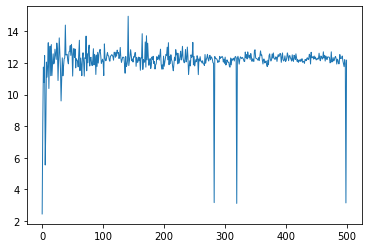

In [113]:
plt.plot([v[0] for v in cov_full['nu_mat']], linewidth = 1)

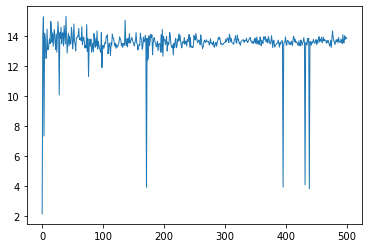

In [114]:
plt.plot([v[50] for v in cov_full['nu_mat']], linewidth = 1)

## Convergence Plot for $\alpha$

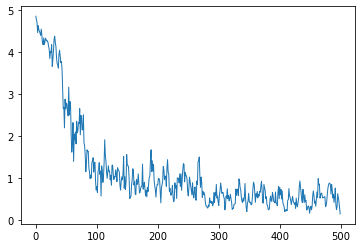

In [115]:
plt.plot([v for v in cov_full['alpha_vec']], linewidth = 1)

In [73]:
last_100_mean = np.apply_along_axis(lambda x: np.mean(x[-100:]), axis = 0, arr = cov_full['B_mat'])

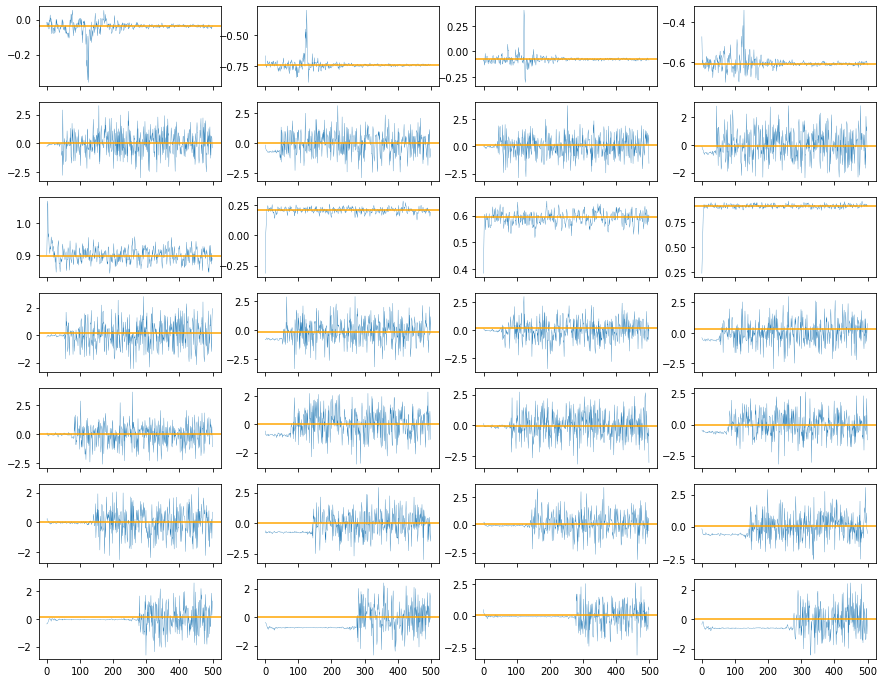

In [121]:
fig, axes = plt.subplots(nrows = 7, ncols = 4, sharex = True, squeeze=True, subplot_kw=None, figsize=(15, 12))
for h in range(7):
    for j in range(4):
        axes[h, j].plot([v[h][j] for v in np.array(cov_full['B_mat'])], linewidth=0.3)
        axes[h, j].axhline(last_100_mean[h][j], color = 'orange', linewidth = 1.5)
plt.show()

In [60]:
true_mat

array([[ 1. ,  0.3,  0.7,  1. ],
       [ 0. , -0.8, -0.1, -0.7]])

In [83]:
np.apply_along_axis(lambda x: np.mean(x[-100:]), axis = 0, arr =cov_full['B_mat'])[0]

array([-0.03749062, -0.73950231, -0.0780747 , -0.6073636 ])

In [84]:
np.apply_along_axis(lambda x: np.mean(x[-100:]), axis = 0, arr =cov_full['B_mat'])[2]

array([0.89603686, 0.2084752 , 0.5937041 , 0.90947971])

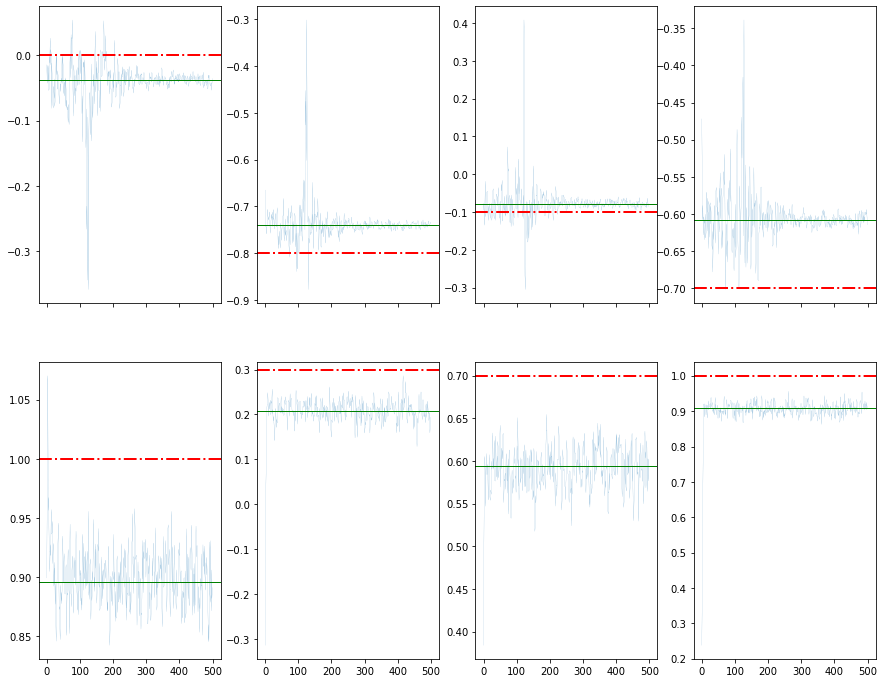

In [106]:
act_list = [0, 2]
fig, axes = plt.subplots(nrows = 2, ncols = 4, sharex = True, squeeze=True, subplot_kw=None, figsize=(15, 12))
for h in range(2):
    for j in range(4):
        axes[h, j].plot([v[act_list[h]][j] for v in np.array(cov_full['B_mat'])], linewidth = 0.1)
        axes[h, j].axhline(last_100_mean[act_list[h]][j], color = 'green', linewidth = 1)
        axes[h, j].axhline(true_mat[1 - h][j], linestyle = '-.', color = 'red', linewidth=2)
plt.show()

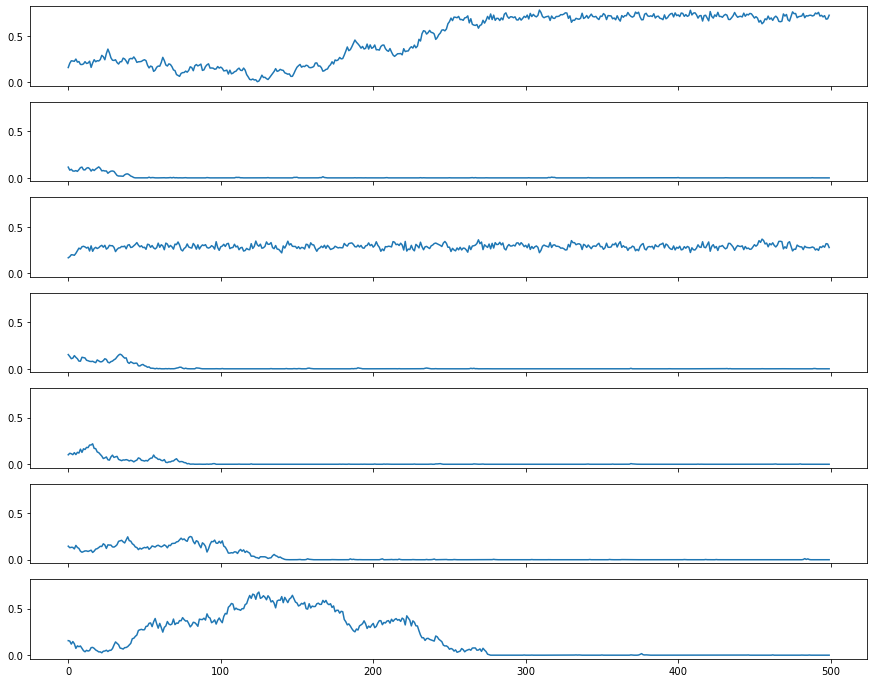

In [118]:
fig, axes = plt.subplots(nrows = 7, ncols = 1, sharex = True, sharey = True, squeeze=True, subplot_kw=None, figsize=(15, 12))
for h in range(7):
    axes[h].plot(np.array(cov_full['W_mat']).T[h])
plt.show()

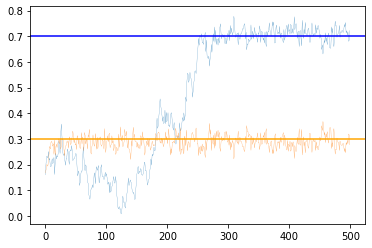

In [112]:
plt.plot([v[0] for v in cov_full['W_mat']], linewidth = 0.2)
plt.plot([v[2] for v in cov_full['W_mat']], linewidth = 0.2)
plt.axhline(0.7, color = 'blue')
plt.axhline(0.3, color = 'orange')